In [12]:
import os, sys
print(sys.executable) # works this time
print(sys.version)
print(sys.version_info)
import scanpy as sc
from sklearn.cross_decomposition import CCA
from sklearn.manifold import TSNE
from scipy.sparse import csr_matrix
from scipy.sparse import csr_matrix
import numpy as np
import umap.umap_ as umap
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import pandas as pd
import random

I:\mutiomics\pythonProject\.venv\Scripts\python.exe
3.10.11 (tags/v3.10.11:7d4cc5a, Apr  5 2023, 00:38:17) [MSC v.1929 64 bit (AMD64)]
sys.version_info(major=3, minor=10, micro=11, releaselevel='final', serial=0)


In [1746]:
adata1 = sc.read_h5ad("I:\\mutiomics\\Spatial Multimodal Analysis of Transcriptomes and Metabolomes in Tissues\\benchmark\\GC\\A2.h5ad")
adata2 = sc.read_h5ad("I:\\mutiomics\\Spatial Multimodal Analysis of Transcriptomes and Metabolomes in Tissues\\benchmark\\GC\\A1.h5ad")

In [1747]:
import anndata
import pandas as pd

# 读取 h5ad 文件

# 提取表达矩阵和位置信息
expression_matrix = adata2.X
positions = pd.DataFrame({
    '0': adata2.obs["spatialX"],
    '1': adata2.obs["spatialY"]
})  # 假设位置信息在 obs 中，列名为 'x' 和 'y'
cluster = adata2.obs["clusters"]
# 将数据保存为 CSV 文件，方便在 R 中读取
#pd.DataFrame(expression_matrix.toarray()).to_csv("I:\\mutiomics\\Spatial Multimodal Analysis of Transcriptomes and Metabolomes in Tissues\\benchmark\\B2_expression.csv", index=False)
#pd.DataFrame(positions).to_csv("I:\\mutiomics\\Spatial Multimodal Analysis of Transcriptomes and Metabolomes in Tissues\\benchmark\\B2_position.csv", index=False)
#pd.DataFrame(cluster).to_csv("I:\\mutiomics\\Spatial Multimodal Analysis of Transcriptomes and Metabolomes in Tissues\\benchmark\\B2_cluster.csv", index=False)


In [1748]:
adata1.obs["leiden"] = adata1.obs["clusters"]
adata2.obs["leiden"] = adata2.obs["clusters"]

In [1796]:
adata2.X

<1000x2500 sparse matrix of type '<class 'numpy.float32'>'
	with 327674 stored elements in Compressed Sparse Row format>

In [1749]:
import matplotlib.pyplot as plt
sc.pl.spatial(adata1, img_key = "hires", color="clusters", size=1.5, show=False)
#plt.savefig("I:\\mutiomics\\Spatial Multimodal Analysis of Transcriptomes and Metabolomes in Tissues\\m3\\m3_9AA_VisiumArray_plot.pdf")
#sc.pl.spatial(adata2, img_key = "hires", color="clusters", size=1.5, show=False)
#plt.savefig("I:\\mutiomics\\Spatial Multimodal Analysis of Transcriptomes and Metabolomes in Tissues\\m3\\m3_visium_ctrl.pdf")

ValueError: When .uns['spatial'][library_id] does not exist, spot_size must be provided directly.

In [1750]:
adata1

AnnData object with n_obs × n_vars = 1000 × 2499
    obs: 'barcode', 'in_tissue', 'array_row', 'array_col', 'pxl_col_in_fullres', 'pxl_row_in_fullres', 'leiden', 'clusters'
    var: 'gene_ids', 'feature_types', 'genome', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg', 'leiden', 'leiden_colors', 'log1p', 'moranI', 'neighbors', 'pca', 'spatial_neighbors', 'umap'
    obsm: 'X_pca', 'X_umap', 'spatial'
    varm: 'PCs'
    obsp: 'connectivities', 'distances', 'spatial_connectivities', 'spatial_distances'

In [1751]:
print(adata1.X.shape)
print(adata1.obsm["spatial"].shape)

(1000, 2499)
(1000, 2)


In [1752]:
data1_pca_results = adata1.obsm['spatial']  # PCA 结果
pca_leiden = adata1.obs["leiden"]
data1_leiden_str = pca_leiden.to_numpy()

data2_pca_results = adata2.obsm['X_umap']  # PCA 结果
pca_leiden = adata2.obs["leiden"]
data2_leiden_str = pca_leiden.to_numpy()

def var_select(df, m1, m2, n):
    # 1. 筛选出列均值在 m1 和 m2 之间的行
    filtered_df = df.loc[:,(df.mean() > m1) & (df.mean() < m2)]

    # 2. 计算每行的方差，并选择前 n 个最大值所对应的索引
    variances = filtered_df.var(axis=0)/filtered_df.mean()
    sorted_indices = variances.sort_values(ascending=False).index
    selected_indices = sorted_indices[:n]

    return selected_indices.tolist()


def convert_to_array(x):
    if isinstance(x, csr_matrix):
        return x.toarray()
    elif isinstance(x, np.ndarray):
        return x
    else:
        raise ValueError("Unsupported input type. Must be csr_matrix or ndarray.")
        
def tpm_normalize(counts_matrix):
    # 计算每个细胞的总表达量
    total_counts_per_cell = counts_matrix.sum(axis=1)
    # 计算每个基因的 TPM
    tpm_matrix = (counts_matrix.div(total_counts_per_cell, axis=0)) * 1e4
    return tpm_matrix

In [1753]:
#####spatial alignment of data3(metabolic) and data2(spatial) using CCA
def rotate_point_90_degrees(row):
    new_x = -row[0]
    new_y = row[1]
    return pd.Series({0: new_x, 1: new_y})

def flip_around_y_minus_x(row):
    new_x = -row[0]
    new_y = -row[1]
    return pd.Series({0: new_x, 1: new_y})

def flip_around_y_plus_x(row):
    new_x = row[1]
    new_y = row[0]
    return pd.Series({0: new_x, 1: new_y})
    
def center_and_scale(data, feature_range=(0, 500)):
    """
    对数据进行中心缩放和范围缩放
    """
    # 中心缩放
    scaler_center = StandardScaler()
    data_centered = scaler_center.fit_transform(data)
    
    # 范围缩放
    scaler_range = MinMaxScaler(feature_range=feature_range)
    data_scaled = scaler_range.fit_transform(data_centered)
    
    return data_scaled
    
from sklearn.preprocessing import MinMaxScaler
#scaler = MinMaxScaler(feature_range=(-100, 100))
data3_spatial_results = pd.DataFrame(adata1.obsm['spatial'])
#scaled_data = scaler.fit_transform(data3_spatial_results)
scaled_data = center_and_scale(data3_spatial_results)
data3_spatial_results = pd.DataFrame(scaled_data, columns=data3_spatial_results.columns)
print(data3_spatial_results.head)
data2_spatial_results = pd.DataFrame(adata2.obsm['spatial'])
#data2_spatial_results = positions
#scaled_data = scaler.fit_transform(data2_spatial_results)
scaled_data = center_and_scale(data2_spatial_results)
data2_spatial_results = pd.DataFrame(scaled_data, columns=data2_spatial_results.columns)

data2_spatial_results=pd.DataFrame(data2_spatial_results)
data3_spatial_results=pd.DataFrame(data3_spatial_results)
#data3_spatial_results = data3_spatial_results.apply(rotate_point_90_degrees, axis=1)
#data3_spatial_results = data3_spatial_results.apply(flip_around_y_minus_x, axis=1)
#data3_spatial_results = data3_spatial_results.apply(flip_around_y_plus_x, axis=1)
data1_spatial_results = data3_spatial_results
data1_spatial_results=pd.DataFrame(data1_spatial_results)
#data1_spatial_results = data1_spatial_results +400
#data2_spatial_results = data2_spatial_results +400
#data3_spatial_results = data3_spatial_results +400

<bound method NDFrame.head of               0           1
0     99.351176  199.358632
1     98.337388  289.417424
2    404.298459  348.743987
3     86.577453  298.236237
4     81.305758  433.190807
..          ...         ...
995  183.292782  435.061464
996   96.512571   82.041689
997  353.811841  284.874399
998  129.764801  289.951897
999  180.454177  335.916622

[1000 rows x 2 columns]>


C:\Users\28123\AppData\Local\Temp\ipykernel_2856\3934839348.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


(1000, 2) (1000, 2)
(1000, 1000)
(1000, 2) (1000, 2)
(1000, 2) (1000, 2)
   spatial.CCA.X  spatial.CCA.Y  spatial_ID  spatial_cluster  spatial.CCA.Z  \
0     106.853204     178.217822           0                3             -1   
1     106.853204     263.157895           1                2             -1   
2     406.934307     270.192809           2                6             -1   
3      96.107056     275.664409           3                9             -1   
4      95.498783     403.335070           4                0             -1   

   metabolic.CCA.X  metabolic.CCA.Y  matabolic_ID  matabolic_cluster  \
0       107.258719       181.453768           222                  3   
1       102.595296       262.426510           437                  1   
2       408.961882       267.771245           196                  8   
3        86.780211       280.064137           831                  1   
4        89.416058       397.381080           233                  2   

   matabolic.CCA.Z 

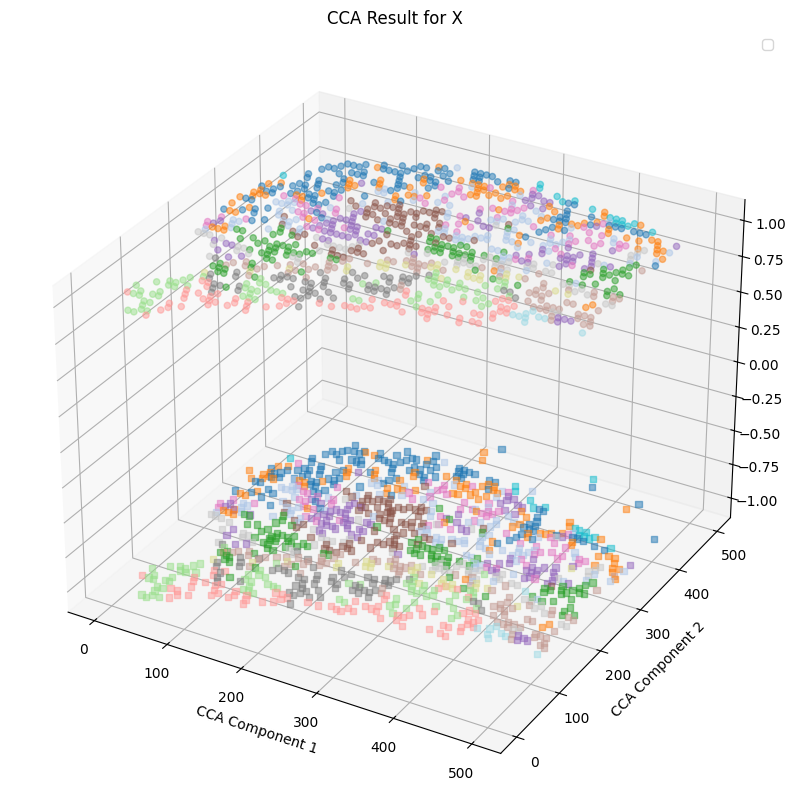

In [1754]:
Y_c = data2_spatial_results
Z_c = data3_spatial_results
print(Z_c.shape, Y_c.shape)
from scipy.spatial.distance import cdist
distances = cdist(data3_spatial_results, data2_spatial_results, metric='euclidean')
dist_df = pd.DataFrame(distances)
print(dist_df.shape)
min_row_indices = dist_df.idxmin()
print(Z_c.shape, Y_c.shape)
###############找出Y_C(spatial)周围dist_min以内的Z_C(metabolic)点
Y_C_ = Y_c.iloc[:,:]
Y_C_['spatial_ID'] = Y_C_.index
Y_C_ = Y_C_.reset_index()
Y_C_["spatial_cluster"] = data2_leiden_str.astype(int)
Y_C_["spatial.CCA.Z"] = -1
Y_C_ = Y_C_.drop(columns=['index'])
Y_C_ = Y_C_.rename(columns={0: "spatial.CCA.X", 1:"spatial.CCA.Y"})
print(Z_c.shape, Y_c.shape)
Z_C_=Z_c.iloc[min_row_indices,]
Z_C_['matabolic_ID'] = Z_C_.index
Z_C_=Z_C_.reset_index()
Z_C_["matabolic_cluster"] = data1_leiden_str[min_row_indices].astype(int)
Z_C_=Z_C_.drop(columns=['index'])
Z_C_["matabolic.CCA.Z"] = 1
Z_C_=Z_C_.rename(columns={0: "metabolic.CCA.X", 1:"metabolic.CCA.Y"})
pairs = pd.concat([Y_C_,Z_C_],axis=1)
#pairs["distance"] = dist_df.iloc[row_indices,col_indices].values.diagonal()  //diagonal要求内存过大
print(pairs.head())

fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(111, projection='3d')
plt.scatter(Z_c.iloc[:, 0], Z_c.iloc[:, 1],zs=1, c=data1_leiden_str[:].astype(int), cmap='tab20', s=20, alpha=0.5)
plt.scatter(Y_c.iloc[:, 0], Y_c.iloc[:, 1],zs=-1, c=data2_leiden_str.astype(int), cmap='tab20', s=20, alpha=0.5,marker='s')
#for i in range(0,pairs.shape[0]):
#    plt.plot(pairs.iloc[i,[0,5]], pairs.iloc[i,[1,6]], pairs.iloc[i,[4,9]], 'gray', linewidth=0.2)
plt.xlabel('CCA Component 1')
plt.ylabel('CCA Component 2')
plt.title('CCA Result for X')
plt.legend()
plt.show()

In [1755]:
color_mapping = {
    0: 'blue',
    1: 'red',
    2: 'green',
    3: 'yellow',
    4: 'orange',
    5: 'purple',
    6: 'brown',
    7: 'pink',
    8: 'gray',
    9: 'cyan',
    10: 'magenta',
    11: 'cyan',
    12: 'blue',
    13: 'red',
    14: 'green',
    15: 'yellow'
}

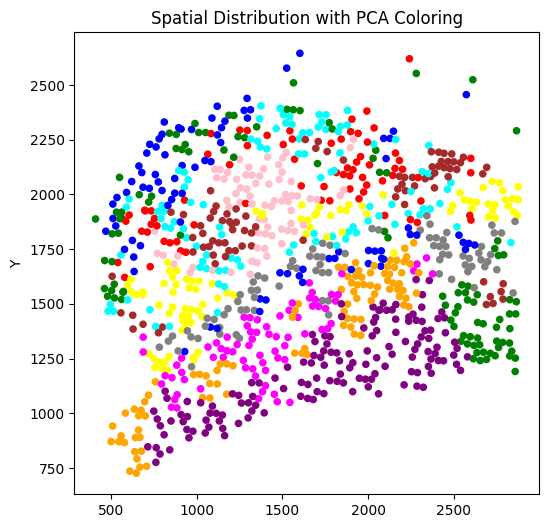

In [1756]:
plt.figure(figsize=(6, 6))
plt.scatter(pd.DataFrame(adata2.obsm['spatial']).iloc[:, 0],pd.DataFrame(adata2.obsm['spatial']).iloc[:, 1], 
            c=[color_mapping[category] for category in pairs["matabolic_cluster"].tolist()], s=20, alpha=1)
plt.ylabel('Y')
plt.title('Spatial Distribution with PCA Coloring')
unique_categories = pairs["matabolic_cluster"].unique()
handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color_mapping[cat], markersize=10) for cat in unique_categories]
#plt.legend(handles, unique_categories, title="Metabolic Clusters")
#plt.savefig("I:\\mutiomics\\Spatial Multimodal Analysis of Transcriptomes and Metabolomes in Tissues\\benchmark\\GC\\directalignment.pdf")
plt.show()


In [1757]:
pairs

,spatial.CCA.X,spatial.CCA.Y,spatial_ID,spatial_cluster,spatial.CCA.Z,metabolic.CCA.X,metabolic.CCA.Y,matabolic_ID,matabolic_cluster,matabolic.CCA.Z
0,106.853204,178.217822,0,3,-1,107.258719,181.453768,222,3,1
1,106.853204,263.157895,1,2,-1,102.595296,262.426510,437,1,1
2,406.934307,270.192809,2,6,-1,408.961882,267.771245,196,8,1
3,96.107056,275.664409,3,9,-1,86.780211,280.064137,831,1,1
4,95.498783,403.335070,4,0,-1,89.416058,397.381080,233,2,1
...,...,...,...,...,...,...,...,...,...,...
995,194.849959,388.483585,995,0,-1,195.660989,390.165687,810,9,1
996,101.175994,69.828035,996,10,-1,100.567721,73.222875,315,5,1
997,357.055961,219.124544,997,1,-1,362.327656,212.987707,569,4,1
998,139.294404,259.770714,998,6,-1,138.077859,254.142170,215,6,1


In [1758]:
same_values_mask_directmerge = pairs['spatial_cluster'] == pairs['matabolic_cluster']
# 计算相同值的个数
same_values_count_fine = same_values_mask_directmerge.sum()
accruracy_directmerge = same_values_count_fine
accruracy_directmerge

289

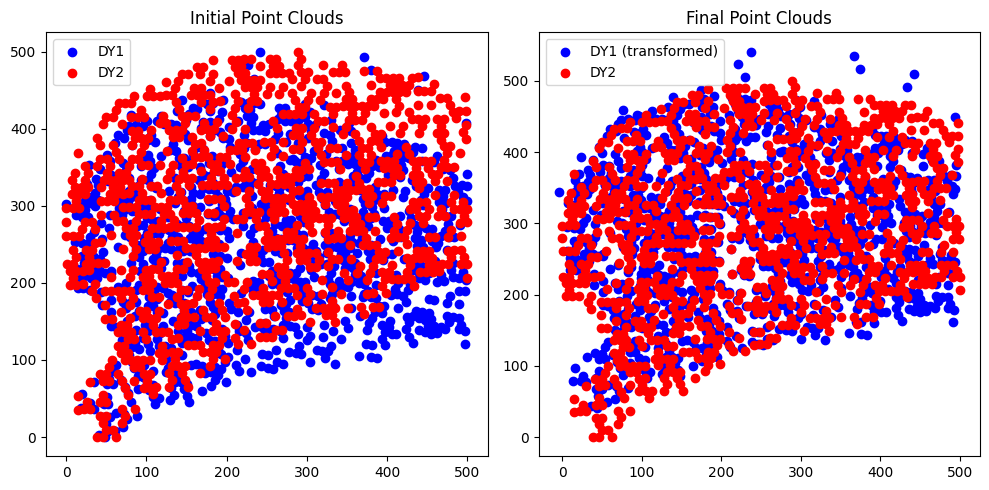

Final transformation matrix:
[[-4.20108393e-15]
 [ 9.33653155e-15]]


In [1759]:
#####direct_ICP
import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial import cKDTree

DY1 = data2_spatial_results.T.to_numpy()  # Example DYGW1 features
DY2 = data3_spatial_results.T.to_numpy()  # Example DYGW2 features

transformation = np.eye(2)  # 初始变换矩阵为2x2的单位矩阵

# 设定迭代次数和收敛阈值
max_iterations = 500
tolerance = 1e-5

# 创建一个新的图形窗口
plt.figure(figsize=(10, 5))

# 绘制初始的DY1和DY2点云
plt.subplot(1, 2, 1)
plt.title('Initial Point Clouds')
plt.scatter(DY1[0], DY1[1], color='blue', label='DY1')
plt.scatter(DY2[0], DY2[1], color='red', label='DY2')
plt.legend()

iteration = 0
converged = False

while not converged and iteration < max_iterations:
    # Step 1: Find correspondences based on spatial proximity
    tree = cKDTree(DY2.T)
    distances, indices = tree.query(DY1.T)
    
    corresponding_target_points = DY2[:, indices]

    # Step 2: Optimize transformation using spatial and feature distances
    # Example: simple averaging transformation for illustration
    transformation = np.mean(corresponding_target_points - DY1, axis=1, keepdims=True)

    # Step 3: Apply transformation to DY1
    DY1_transformed = DY1 + transformation

    # Step 4: Update DY1 for the next iteration
    DY1 = DY1_transformed

    # Step 5: Check convergence
    if np.linalg.norm(transformation) < tolerance:
        converged = True

    iteration += 1

# 绘制最终的DY1和DY2点云
plt.subplot(1, 2, 2)
plt.title('Final Point Clouds')
plt.scatter(DY1[0], DY1[1], color='blue', label='DY1 (transformed)')
plt.scatter(DY2[0], DY2[1], color='red', label='DY2')
plt.legend()

plt.tight_layout()
plt.show()

print("Final transformation matrix:")
print(transformation)

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\4280202264.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


(1000, 2) (1000, 2)
(1000, 1000)
(1000, 2) (1000, 2)
(1000, 2) (1000, 2)
   spatial.CCA.X  spatial.CCA.Y  spatial_ID  spatial_cluster  spatial.CCA.Z  \
0     102.266626     219.170679           0                3             -1   
1     102.266626     304.110752           1                2             -1   
2     402.347729     311.145666           2                6             -1   
3      91.520479     316.617266           3                9             -1   
4      90.912206     444.287928           4                0             -1   

   metabolic.CCA.X  metabolic.CCA.Y  matabolic_ID  matabolic_cluster  \
0        99.148418       217.263495           815                  3   
1       106.042174       307.589524           748                  6   
2       404.501217       312.667023           366                 11   
3        94.079481       316.408338           340                  9   
4        84.955393       442.276857           342                  0   

   matabolic.CCA.Z 

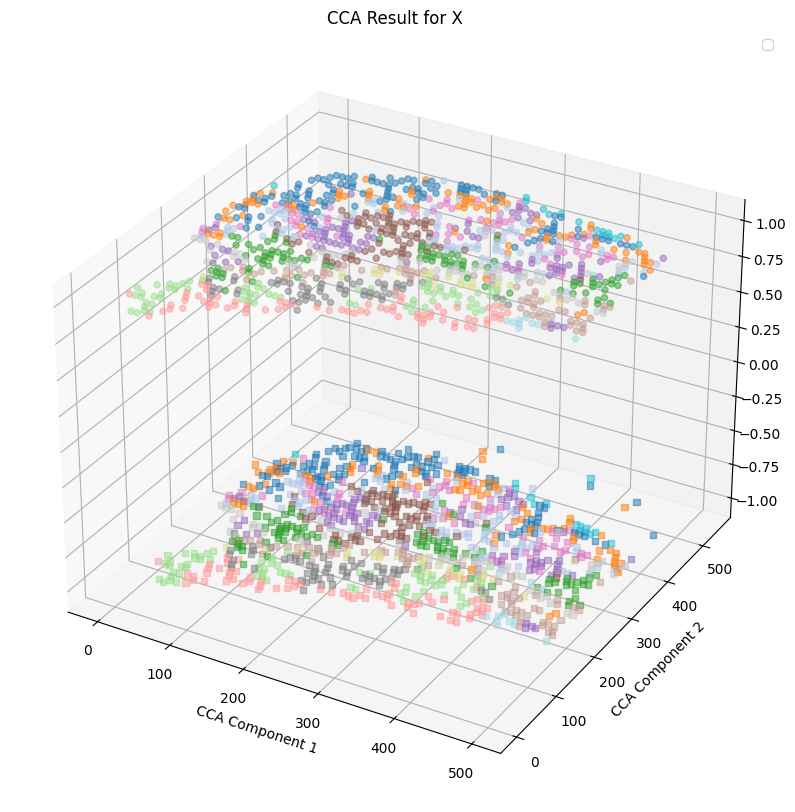

In [1760]:
Y_c = pd.DataFrame(DY1).T
Z_c = pd.DataFrame(DY2).T
print(Z_c.shape, Y_c.shape)
from scipy.spatial.distance import cdist
distances = cdist(Z_c, Y_c, metric='euclidean')
dist_df = pd.DataFrame(distances)
print(dist_df.shape)
min_row_indices_ = dist_df.idxmin()
print(Z_c.shape, Y_c.shape)
###############找出Y_C(spatial)周围dist_min以内的Z_C(metabolic)点
Y_C_ = Y_c.iloc[:,:]
Y_C_['spatial_ID'] = Y_C_.index
Y_C_ = Y_C_.reset_index()
Y_C_["spatial_cluster"] = data2_leiden_str.astype(int)
Y_C_["spatial.CCA.Z"] = -1
Y_C_ = Y_C_.drop(columns=['index'])
Y_C_ = Y_C_.rename(columns={0: "spatial.CCA.X", 1:"spatial.CCA.Y"})
print(Z_c.shape, Y_c.shape)
Z_C_=Z_c.iloc[min_row_indices_,]
Z_C_['matabolic_ID'] = Z_C_.index
Z_C_=Z_C_.reset_index()
Z_C_["matabolic_cluster"] = data1_leiden_str[min_row_indices_].astype(int)
Z_C_=Z_C_.drop(columns=['index'])
Z_C_["matabolic.CCA.Z"] = 1
Z_C_=Z_C_.rename(columns={0: "metabolic.CCA.X", 1:"metabolic.CCA.Y"})
pairs = pd.concat([Y_C_,Z_C_],axis=1)
#pairs["distance"] = dist_df.iloc[row_indices,col_indices].values.diagonal()  //diagonal要求内存过大
print(pairs.head())

fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(111, projection='3d')
plt.scatter(Z_c.iloc[:, 0], Z_c.iloc[:, 1],zs=1, c=data1_leiden_str[:].astype(int), cmap='tab20', s=20, alpha=0.5)
plt.scatter(Y_c.iloc[:, 0], Y_c.iloc[:, 1],zs=-1, c=data2_leiden_str.astype(int), cmap='tab20', s=20, alpha=0.5,marker='s')
#for i in range(0,pairs.shape[0]):
#    plt.plot(pairs.iloc[i,[0,5]], pairs.iloc[i,[1,6]], pairs.iloc[i,[4,9]], 'gray', linewidth=0.2)
plt.xlabel('CCA Component 1')
plt.ylabel('CCA Component 2')
plt.title('CCA Result for X')
plt.legend()
plt.show()

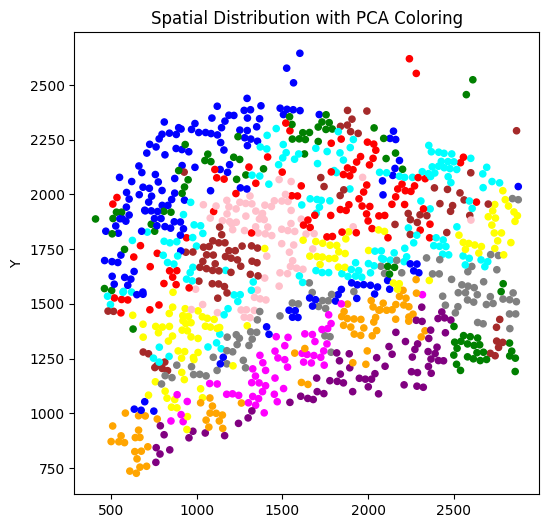

In [1761]:
plt.figure(figsize=(6, 6))
plt.scatter(pd.DataFrame(adata2.obsm['spatial']).iloc[:, 0],pd.DataFrame(adata2.obsm['spatial']).iloc[:, 1], 
            c=[color_mapping[category] for category in pairs["matabolic_cluster"].tolist()], s=20, alpha=1)
plt.ylabel('Y')
plt.title('Spatial Distribution with PCA Coloring')
unique_categories = pairs["matabolic_cluster"].unique()
handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color_mapping[cat], markersize=10) for cat in unique_categories]
#plt.legend(handles, unique_categories, title="Metabolic Clusters")
#plt.savefig("I:\\mutiomics\\Spatial Multimodal Analysis of Transcriptomes and Metabolomes in Tissues\\benchmark\\GC\\directICPalignment.pdf")
plt.show()


In [1762]:
same_values_mask_directmerge = pairs['spatial_cluster'] == pairs['matabolic_cluster']
# 计算相同值的个数
same_values_count_fine = same_values_mask_directmerge.sum()
accruracy_ICP = same_values_count_fine
accruracy_ICP

462

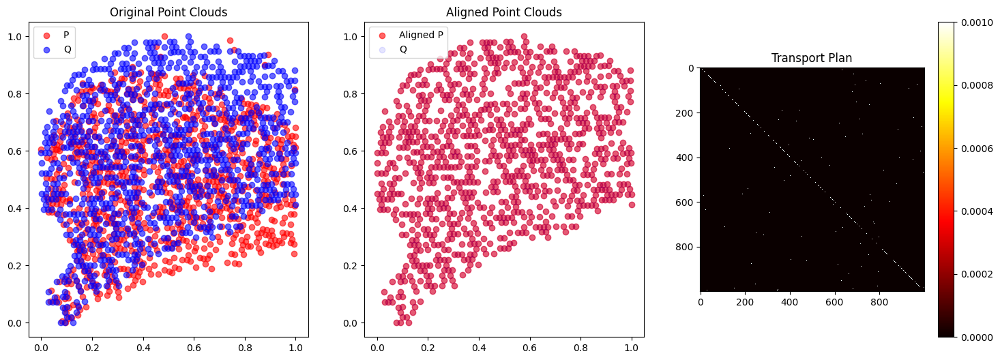

In [1763]:
import numpy as np
import ot
import matplotlib.pyplot as plt

# 假设 P 和 Q 是两个点云，形状分别为 (n, d) 和 (m, d)
P = data2_spatial_results.to_numpy()  # Example DYGW1 features
Q = data3_spatial_results.to_numpy()  # Example DYGW2 features

# 特征矩阵（这里假设特征与坐标相同）
F_P = P
F_Q = Q

# 数据标准化
scaler = StandardScaler()
P = scaler.fit_transform(P)
Q = scaler.fit_transform(Q)

# 数据归一化
scaler = MinMaxScaler()
P = scaler.fit_transform(P)
Q = scaler.fit_transform(Q)

# 计算几何距离矩阵
C_P = np.linalg.norm(P[:, None, :] - P[None, :, :], axis=2)
C_Q = np.linalg.norm(Q[:, None, :] - Q[None, :, :], axis=2)

# 计算特征距离矩阵
M = np.linalg.norm(F_P[:, None, :] - F_Q[None, :, :], axis=2)

# 初始化权重，均匀分布
a = np.ones((P.shape[0],)) / P.shape[0]
b = np.ones((Q.shape[0],)) / Q.shape[0]

# 设置平衡参数
alpha = 0.5

# 设置参数
params = {
    'max_iter': 2000,    # 增加最大迭代次数
    'tol_rel': 1e-7,     # 调整相对容差
    'tol_abs': 1e-9,     # 调整绝对容差
    'armijo': True       # 使用Armijo线搜索
}

# 计算FGW最优传输计划
pi, log = ot.gromov.fused_gromov_wasserstein(M,C_P, C_Q, a, b, alpha=alpha, log=True, **params)

# 对齐点云 P 到 Q
P_aligned = np.dot(pi, Q)
scaler = StandardScaler()
P_aligned = scaler.fit_transform(P_aligned)
scaler = MinMaxScaler()
P_aligned = scaler.fit_transform(P_aligned)


# 可视化
plt.figure(figsize=(18, 6))

# 原始点云
plt.subplot(1, 3, 1)
plt.scatter(P[:, 0], P[:, 1], color='red', label='P', alpha=0.6)
plt.scatter(Q[:, 0], Q[:, 1], color='blue', label='Q', alpha=0.6)
plt.title('Original Point Clouds')
plt.legend()

# 对齐后的点云
plt.subplot(1, 3, 2)
plt.scatter(P_aligned[:, 0], P_aligned[:, 1], color='red', label='Aligned P', alpha=0.6)
plt.scatter(Q[:, 0], Q[:, 1], color='blue', label='Q', alpha=0.1)
plt.title('Aligned Point Clouds')
plt.legend()

# 可视化传输计划
plt.subplot(1, 3, 3)
plt.imshow(pi, cmap='hot', interpolation='nearest')
plt.title('Transport Plan')
plt.colorbar()

plt.show()


C:\Users\28123\AppData\Local\Temp\ipykernel_2856\3753228269.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


(1000, 2) (1000, 2)
(1000, 1000)
(1000, 2) (1000, 2)
(1000, 2) (1000, 2)
   spatial.CCA.X  spatial.CCA.Y  spatial_ID  spatial_cluster  spatial.CCA.Z  \
0       0.206407       0.380545           0                3             -1   
1       0.180454       0.650454           1                2             -1   
2       0.808597       0.697488           2                6             -1   
3       0.180860       0.578300           3                9             -1   
4       0.169911       0.884554           4                0             -1   

   metabolic.CCA.X  metabolic.CCA.Y  matabolic_ID  matabolic_cluster  \
0         0.206407         0.380545           488                  3   
1         0.180454         0.650454           590                  0   
2         0.808597         0.697488             2                  6   
3         0.180860         0.578300           779                  9   
4         0.169911         0.884554           342                  0   

   matabolic.CCA.Z 

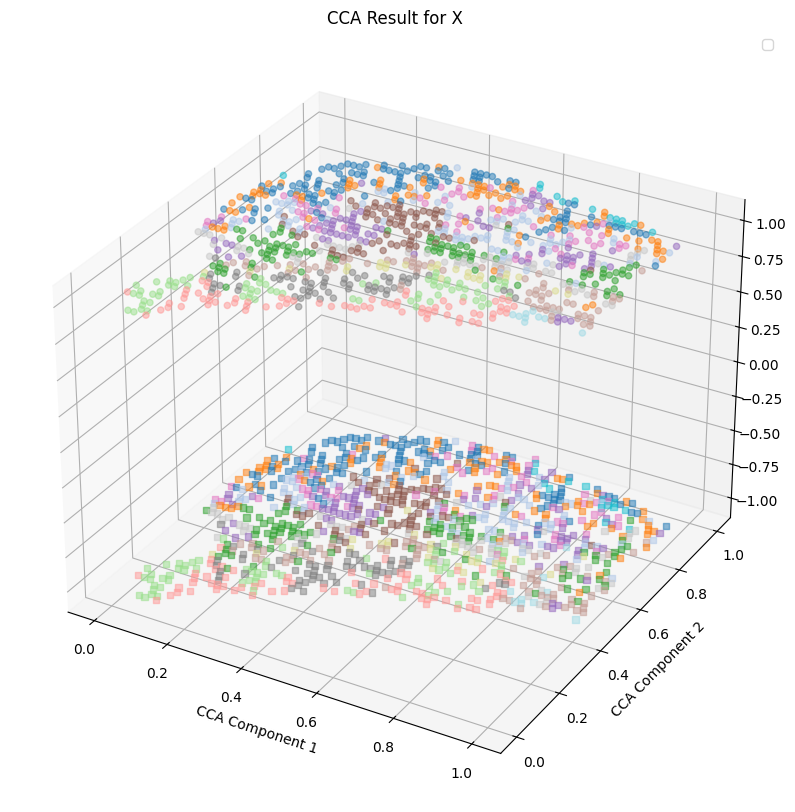

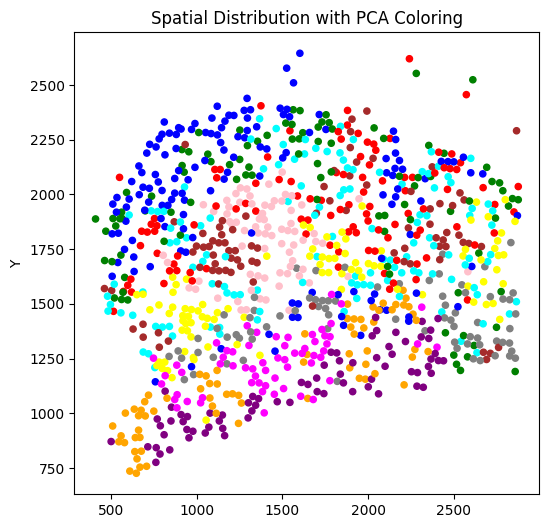

583

In [1764]:
Y_c = pd.DataFrame(P_aligned)
Z_c = pd.DataFrame(Q)
print(Z_c.shape, Y_c.shape)
from scipy.spatial.distance import cdist
distances = cdist(Z_c, Y_c, metric='euclidean')
dist_df = pd.DataFrame(distances)
print(dist_df.shape)
min_row_indices_ = dist_df.idxmin()
print(Z_c.shape, Y_c.shape)
###############找出Y_C(spatial)周围dist_min以内的Z_C(metabolic)点
Y_C_ = Y_c.iloc[:,:]
Y_C_['spatial_ID'] = Y_C_.index
Y_C_ = Y_C_.reset_index()
Y_C_["spatial_cluster"] = data2_leiden_str.astype(int)
Y_C_["spatial.CCA.Z"] = -1
Y_C_ = Y_C_.drop(columns=['index'])
Y_C_ = Y_C_.rename(columns={0: "spatial.CCA.X", 1:"spatial.CCA.Y"})
print(Z_c.shape, Y_c.shape)
Z_C_=Z_c.iloc[min_row_indices_,]
Z_C_['matabolic_ID'] = Z_C_.index
Z_C_=Z_C_.reset_index()
Z_C_["matabolic_cluster"] = data1_leiden_str[min_row_indices_].astype(int)
Z_C_=Z_C_.drop(columns=['index'])
Z_C_["matabolic.CCA.Z"] = 1
Z_C_=Z_C_.rename(columns={0: "metabolic.CCA.X", 1:"metabolic.CCA.Y"})
pairs = pd.concat([Y_C_,Z_C_],axis=1)
#pairs["distance"] = dist_df.iloc[row_indices,col_indices].values.diagonal()  //diagonal要求内存过大
print(pairs.head())

fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(111, projection='3d')
plt.scatter(Z_c.iloc[:, 0], Z_c.iloc[:, 1],zs=1, c=data1_leiden_str[:].astype(int), cmap='tab20', s=20, alpha=0.5)
plt.scatter(Y_c.iloc[:, 0], Y_c.iloc[:, 1],zs=-1, c=data2_leiden_str.astype(int), cmap='tab20', s=20, alpha=0.5,marker='s')
#for i in range(0,pairs.shape[0]):
#    plt.plot(pairs.iloc[i,[0,5]], pairs.iloc[i,[1,6]], pairs.iloc[i,[4,9]], 'gray', linewidth=0.2)
plt.xlabel('CCA Component 1')
plt.ylabel('CCA Component 2')
plt.title('CCA Result for X')
plt.legend()
plt.show()
plt.figure(figsize=(6, 6))
plt.scatter(pd.DataFrame(adata2.obsm['spatial']).iloc[:, 0],pd.DataFrame(adata2.obsm['spatial']).iloc[:, 1], 
            c=[color_mapping[category] for category in pairs["matabolic_cluster"].tolist()], s=20, alpha=1)
plt.ylabel('Y')
plt.title('Spatial Distribution with PCA Coloring')
unique_categories = pairs["matabolic_cluster"].unique()
handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color_mapping[cat], markersize=10) for cat in unique_categories]
#plt.legend(handles, unique_categories, title="Metabolic Clusters")
#plt.savefig("I:\\mutiomics\\Spatial Multimodal Analysis of Transcriptomes and Metabolomes in Tissues\\benchmark\\rat\\FPWalignment.pdf")
plt.show()
same_values_mask_directmerge = pairs['spatial_cluster'] == pairs['matabolic_cluster']
# 计算相同值的个数
same_values_count_fine = same_values_mask_directmerge.sum()
accruracy_FPWmerge = same_values_count_fine
accruracy_FPWmerge

In [1765]:
accruracy_FPWmerge

583

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1856930868.py:37: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(colormap)


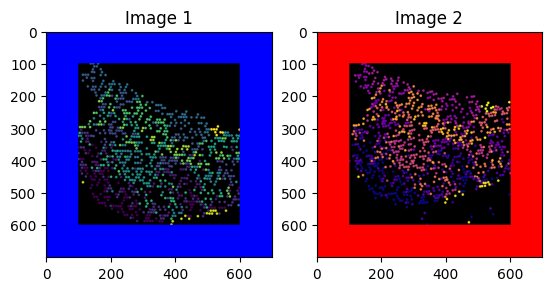

Transformation Matrix:
 [[ 1.00042640e+00 -6.33276217e-03 -5.18370538e+00]
 [ 1.64201732e-01  1.04278168e+00 -2.35769131e+01]]


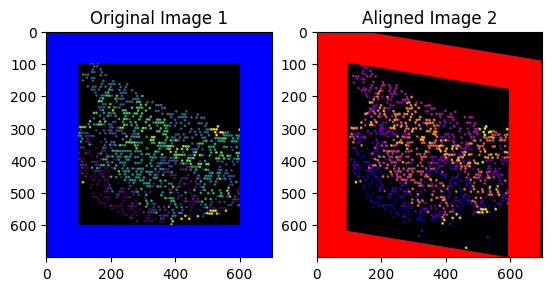

              0           1
0     99.995812  200.509188
1     99.457907  289.083140
2    399.622413  345.692856
3     88.627976  300.360167
4     87.210937  433.392915
..          ...         ...
995  186.698526  434.219694
996   95.002588   86.550097
997  350.046202  284.249695
998  131.934390  290.877951
999  181.823995  334.150557

[1000 rows x 2 columns]
              0           1
0     99.995812  200.509188
1     99.457907  289.083140
2    399.622413  345.692856
3     88.627976  300.360167
4     87.210937  433.392915
..          ...         ...
995  186.698526  434.219694
996   95.002588   86.550097
997  350.046202  284.249695
998  131.934390  290.877951
999  181.823995  334.150557

[1000 rows x 2 columns]


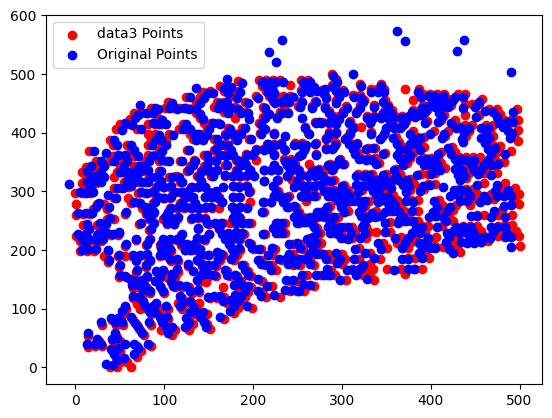

In [1766]:
import numpy as np
import pandas as pd
import cv2
import matplotlib.pyplot as plt
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm

def create_image_from_data(data, width=500, height=500, dot_size=5, border_size=50, dot_colors=None, border_color=(0, 0, 0), colormap='viridis'):
    """
    Create an image from 2D data points with specified dot size, border size, and colors.

    Parameters:
    - data: 2D numpy array where data[0] contains x coordinates and data[1] contains y coordinates
    - width: Width of the image
    - height: Height of the image
    - dot_size: Size of the dots
    - border_size: Size of the border around the image
    - dot_colors: List of scalar values for each dot, which will be mapped to colors using a colormap
    - border_color: Color of the border (BGR format)
    - colormap: Colormap to use for mapping scalar values to colors
    
    Returns:
    - bordered_image: Image with data points and border
    """
    # Initialize an empty image with three channels for color
    image = np.zeros((height, width, 3), dtype=np.uint8)

    # Normalize data points to image dimensions
    x_norm = np.interp(data[0], (data[0].min(), data[0].max()), (0, width-1))
    y_norm = np.interp(data[1], (data[1].min(), data[1].max()), (0, height-1))

    # Normalize dot_colors to [0, 1] range
    if dot_colors is not None:
        norm = plt.Normalize(vmin=min(dot_colors), vmax=max(dot_colors))
        cmap = cm.get_cmap(colormap)
        mapped_colors = cmap(norm(dot_colors))

    # Draw circles at normalized positions
    for i, (x, y) in enumerate(zip(x_norm, y_norm)):
        if dot_colors is not None:
            color = (mapped_colors[i][:3] * 255).astype(int)  # Convert to BGR format
            color = tuple(map(int, color[::-1]))  # Convert from RGB to BGR
        else:
            color = (255, 255, 255)  # Default white color
        cv2.circle(image, (int(x), int(y)), dot_size, color, -1)  # -1 means filled circle

    # Add border
    bordered_image = cv2.copyMakeBorder(image, border_size, border_size, border_size, border_size, 
                                        cv2.BORDER_CONSTANT, value=border_color)

    return bordered_image

# Simulated scalar values
dot_colors_1 = data1_leiden_str.astype(int)
dot_colors_2 = data2_leiden_str.astype(int)

# Create images
border_size = 100
img1 = create_image_from_data(data3_spatial_results, width=500, height=500, dot_size=4, border_size=border_size, dot_colors=dot_colors_1, border_color=(255, 0, 0), colormap='viridis')
img2 = create_image_from_data(data2_spatial_results, width=500, height=500, dot_size=4, border_size=border_size, dot_colors=dot_colors_2, border_color=(0, 0, 255), colormap='plasma')

# Display images using matplotlib
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))
plt.title('Image 1')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(img2, cv2.COLOR_BGR2RGB))
plt.title('Image 2')

plt.show()


import cv2
import numpy as np
import matplotlib.pyplot as plt

# Lists to store points
points_image1 = []
points_image2 = []

def click_event_image1(event, x, y, flags, param):
    if event == cv2.EVENT_LBUTTONDOWN:
        points_image1.append((x, y))
        cv2.circle(img1_display, (x, y), 5, (0, 255, 0), -1)
        cv2.imshow('Image 1', img1_display)

def click_event_image2(event, x, y, flags, param):
    if event == cv2.EVENT_LBUTTONDOWN:
        points_image2.append((x, y))
        cv2.circle(img2_display, (x, y), 5, (0, 255, 0), -1)
        cv2.imshow('Image 2', img2_display)

def compute_affine_transform(points_image1, points_image2):
    pts1 = np.float32(points_image1)
    pts2 = np.float32(points_image2)
    M = cv2.getAffineTransform(pts2[:3], pts1[:3])  # Use the first 3 points for affine transform
    return M

def warp_image(image, M, output_shape):
    warped_image = cv2.warpAffine(image, M, output_shape)
    return warped_image

# Load images
img1_display = img1.copy()
img2_display = img2.copy()

# Display images and set mouse callbacks
cv2.imshow('Image 1', img1_display)
cv2.imshow('Image 2', img2_display)
cv2.setMouseCallback('Image 1', click_event_image1)
cv2.setMouseCallback('Image 2', click_event_image2)

# Wait until 6 points are selected (3 from each image)
while len(points_image1) < 3 or len(points_image2) < 3:
    cv2.waitKey(1)

cv2.destroyAllWindows()

# Compute the transformation matrix
M = compute_affine_transform(points_image1, points_image2)
print("Transformation Matrix:\n", M)

# Apply the transformation to the second image
rows, cols = img1.shape[:2]
aligned_image = warp_image(img2, M, (cols, rows))

# Display the original and aligned images
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))
plt.title('Original Image 1')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(aligned_image, cv2.COLOR_BGR2RGB))
plt.title('Aligned Image 2')
plt.show()

M_homogeneous = np.vstack([M, [0, 0, 1]])

# Convert DataFrame to homogeneous coordinates
coordinates_data3 = data3_spatial_results  # Add a column of 1s
coordinates_data2 = data2_spatial_results  # Add a column of 1s

def apply_affine_transform_2d(coordinates, transformation_matrix):
    """
    对二维坐标应用仿射变换
    """
    # 添加齐次坐标
    homogeneous_coordinates = np.hstack([coordinates, np.ones((coordinates.shape[0], 1))])
    
    # 应用仿射变换
    transformed_coordinates = np.dot(homogeneous_coordinates, transformation_matrix.T)
    
    return transformed_coordinates[:, :2]

transformed_coordinates_data2 = apply_affine_transform_2d(coordinates_data2+border_size, M_homogeneous)
transformed_coordinates_data2 = pd.DataFrame(transformed_coordinates_data2-border_size)
# Apply the transformation matrix
#transformed_coordinates_data3 = coordinates_data3.dot(M_homogeneous.T)
#transformed_coordinates_data2 = coordinates_data2.dot(M)
# Update the DataFrame with the transformed coordinates
#print(transformed_coordinates_data2)
#print(data3_spatial_results)
#plt.title('Original Points')
plt.scatter(data3_spatial_results[0], data3_spatial_results[1], color='red', label='data3 Points')
plt.scatter(transformed_coordinates_data2[0], transformed_coordinates_data2[1], color='blue', label='Original Points')


plt.legend()

print(transformed_coordinates_data2)
data2_spatial_results = transformed_coordinates_data2.iloc[:,0:2]
print(data2_spatial_results)

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\3934839348.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


(1000, 2) (1000, 2)
(1000, 1000)
(1000, 2) (1000, 2)
(1000, 2) (1000, 2)
   spatial.CCA.X  spatial.CCA.Y  spatial_ID  spatial_cluster  spatial.CCA.Z  \
0      99.995812     200.509188           0                3             -1   
1      99.457907     289.083140           1                2             -1   
2     399.622413     345.692856           2                6             -1   
3      88.627976     300.360167           3                9             -1   
4      87.210937     433.392915           4                0             -1   

   metabolic.CCA.X  metabolic.CCA.Y  matabolic_ID  matabolic_cluster  \
0        99.351176       199.358632             0                  3   
1        98.337388       289.417424             1                  2   
2       396.390916       348.743987           154                  6   
3        86.577453       298.236237             3                  9   
4        81.305758       433.190807             4                  0   

   matabolic.CCA.Z 

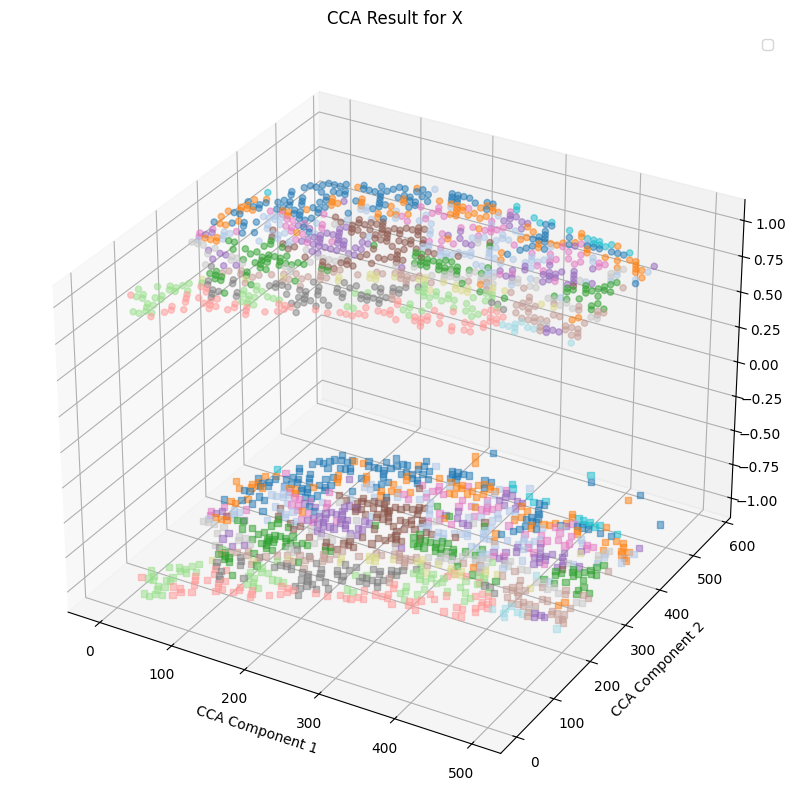

In [1767]:
Y_c = data2_spatial_results
Z_c = data3_spatial_results
print(Z_c.shape, Y_c.shape)
from scipy.spatial.distance import cdist
distances = cdist(data3_spatial_results, data2_spatial_results, metric='euclidean')
dist_df = pd.DataFrame(distances)
print(dist_df.shape)
min_row_indices = dist_df.idxmin()
print(Z_c.shape, Y_c.shape)
###############找出Y_C(spatial)周围dist_min以内的Z_C(metabolic)点
Y_C_ = Y_c.iloc[:,:]
Y_C_['spatial_ID'] = Y_C_.index
Y_C_ = Y_C_.reset_index()
Y_C_["spatial_cluster"] = data2_leiden_str.astype(int)
Y_C_["spatial.CCA.Z"] = -1
Y_C_ = Y_C_.drop(columns=['index'])
Y_C_ = Y_C_.rename(columns={0: "spatial.CCA.X", 1:"spatial.CCA.Y"})
print(Z_c.shape, Y_c.shape)
Z_C_=Z_c.iloc[min_row_indices,]
Z_C_['matabolic_ID'] = Z_C_.index
Z_C_=Z_C_.reset_index()
Z_C_["matabolic_cluster"] = data1_leiden_str[min_row_indices].astype(int)
Z_C_=Z_C_.drop(columns=['index'])
Z_C_["matabolic.CCA.Z"] = 1
Z_C_=Z_C_.rename(columns={0: "metabolic.CCA.X", 1:"metabolic.CCA.Y"})
pairs = pd.concat([Y_C_,Z_C_],axis=1)
#pairs["distance"] = dist_df.iloc[row_indices,col_indices].values.diagonal()  //diagonal要求内存过大
print(pairs.head())

fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(111, projection='3d')
plt.scatter(Z_c.iloc[:, 0], Z_c.iloc[:, 1],zs=1, c=data1_leiden_str[:].astype(int), cmap='tab20', s=20, alpha=0.5)
plt.scatter(Y_c.iloc[:, 0], Y_c.iloc[:, 1],zs=-1, c=data2_leiden_str.astype(int), cmap='tab20', s=20, alpha=0.5,marker='s')
#for i in range(0,pairs.shape[0]):
#    plt.plot(pairs.iloc[i,[0,5]], pairs.iloc[i,[1,6]], pairs.iloc[i,[4,9]], 'gray', linewidth=0.2)
plt.xlabel('CCA Component 1')
plt.ylabel('CCA Component 2')
plt.title('CCA Result for X')
plt.legend()
plt.show()

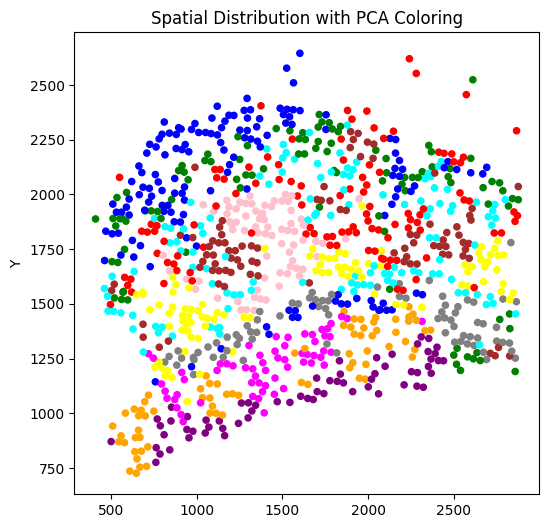

In [1768]:
plt.figure(figsize=(6, 6))
plt.scatter(pd.DataFrame(adata2.obsm['spatial']).iloc[:, 0],pd.DataFrame(adata2.obsm['spatial']).iloc[:, 1], 
            c=[color_mapping[category] for category in pairs["matabolic_cluster"].tolist()], s=20, alpha=1)
plt.ylabel('Y')
plt.title('Spatial Distribution with PCA Coloring')
unique_categories = pairs["matabolic_cluster"].unique()
handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color_mapping[cat], markersize=10) for cat in unique_categories]
#plt.legend(handles, unique_categories, title="Metabolic Clusters")
#plt.savefig("I:\\mutiomics\\Spatial Multimodal Analysis of Transcriptomes and Metabolomes in Tissues\\benchmark\\GC\\grossalignment.pdf")
plt.show()


In [1769]:
same_values_mask_directmerge = pairs['spatial_cluster'] == pairs['matabolic_cluster']
# 计算相同值的个数 
same_values_count_fine = same_values_mask_directmerge.sum()
Accruracy_grossalignment = same_values_count_fine
Accruracy_grossalignment

889

In [1770]:
X_c=pd.DataFrame(data1_spatial_results)
Y_c=pd.DataFrame(data2_spatial_results)
Z_c=pd.DataFrame(data3_spatial_results)

In [1771]:
import numpy as np
import pandas as pd
from scipy.spatial.distance import cdist
from scipy.optimize import minimize
import matplotlib.pyplot as plt

def calculate_simpson_index(values):
    total_count = len(values)
    unique_values = set(values)
    simpson_index = 1 - sum((values.count(value) / total_count) ** 2 for value in unique_values)
    return simpson_index

def main(df):
    x1_x2_lists = df.groupby('spatial_ID')['matabolic_cluster'].apply(list).reset_index()
    simpson_indices = x1_x2_lists['matabolic_cluster'].apply(calculate_simpson_index)
    max_x2_values = x1_x2_lists['matabolic_cluster'].apply(lambda x: max(set(x), key=x.count))
    new_df = pd.DataFrame({'spatial_ID': x1_x2_lists['spatial_ID'], 'Most_freq_metabolic_cluster': max_x2_values, 'Simpson_Index': simpson_indices})
    new_df = pd.merge(new_df, df[['spatial_ID', "spatial_cluster"]].drop_duplicates(), on='spatial_ID', how='left')
    return new_df

def perform_transformations(DF2, DF3, Y_c, Z_c, data2_leiden_str, data1_leiden_str):
    transform_matrix = np.array([[1., 0., 0.], [0., 1., 0.], [0., 0., 1.]])
    max_runs = 100
    run_count = 0
    while run_count < max_runs:
        run_count += 1
        distances = cdist(DF3, DF2, metric='euclidean')
        dist_df = pd.DataFrame(distances)
        
        row_indices, col_indices = np.where(distances < dist_min)
        unique_row_indices = np.unique(row_indices)
        unique_col_indices = np.unique(col_indices)
        
        Y_C_ = Y_c.iloc[col_indices, :]
        Y_C_['spatial_ID'] = Y_C_.index
        Y_C_ = Y_C_.reset_index()
        Y_C_["spatial_cluster"] = data2_leiden_str[col_indices].astype(int)
        Y_C_["spatial.CCA.Z"] = -1
        Y_C_ = Y_C_.drop(columns=['index'])
        Y_C_ = Y_C_.rename(columns={0: "spatial.CCA.X", 1: "spatial.CCA.Y"})
        
        Z_C_ = Z_c.iloc[row_indices, :]
        Z_C_['matabolic_ID'] = Z_C_.index
        Z_C_ = Z_C_.reset_index()
        Z_C_["matabolic_cluster"] = data1_leiden_str[row_indices].astype(int)
        Z_C_ = Z_C_.drop(columns=['index'])
        Z_C_["matabolic.CCA.Z"] = 1
        Z_C_ = Z_C_.rename(columns={0: "metabolic.CCA.X", 1: "metabolic.CCA.Y"})
        
        pairs = pd.concat([Y_C_, Z_C_], axis=1)
        pairs["distance"] = dist_df.iloc[row_indices, col_indices].values.diagonal()
        
        data = pairs
        df = pd.DataFrame(data)
        filtered_spatial_ids = df["spatial_ID"]
        #result_df = main(df)
        #filtered_spatial_ids = result_df[result_df["Simpson_Index"] < 1.1]["spatial_ID"]
        
     #   if filtered_spatial_ids.empty:
     #       break

        dist_df = pd.DataFrame(distances)
        dist_df = dist_df.iloc[:,DF2.drop(filtered_spatial_ids.tolist()).index.to_numpy()]
        min_row_indices = dist_df.idxmin()
        print(f"min_row_indices",min_row_indices.shape)
        df2 = DF2.iloc[DF2.drop(filtered_spatial_ids.tolist()).index.to_numpy(),:].rename(columns = {
            0:"x",
            1:"y",
        })
        df3 =DF3.iloc[min_row_indices,:].rename(columns = {
            0:"x",
            1:"y",
        })
        print("df2",df2.shape)
        print("df3",df3.shape)

        def loss_function(params, df2, df3):
            tx, ty, theta = params
            translation_matrix = np.array([[1, 0, tx], [0, 1, ty], [0, 0, 1]])
            rotation_matrix = np.array([[np.cos(theta), -np.sin(theta), 0], [np.sin(theta), np.cos(theta), 0], [0, 0, 1]])
            transform_matrix = translation_matrix.dot(rotation_matrix)
            ones = np.ones((df2.shape[0], 1))
            df2_homogeneous = np.hstack([df2, ones])
            df2_transformed = df2_homogeneous.dot(transform_matrix.T)
            total_distance = 0
            for point, point1 in zip(df2_transformed[:, :2], df2):
                distances = np.linalg.norm(df3 - point, axis=1)
                distances2 = np.linalg.norm(point - point1)
                total_distance += np.sum(distances) + distances2*0
            return total_distance

        initial_params = [0, 0, 0]
        result = minimize(loss_function, initial_params, args=(df2.values, df3.values), method='L-BFGS-B')

        optimal_params = result.x
        tx_opt, ty_opt, theta_opt = optimal_params
        translation_matrix_opt = np.array([[1, 0, tx_opt], [0, 1, ty_opt], [0, 0, 1]])
        rotation_matrix_opt = np.array([[np.cos(theta_opt), -np.sin(theta_opt), 0], [np.sin(theta_opt), np.cos(theta_opt), 0], [0, 0, 1]])
        transform_matrix_opt = translation_matrix_opt.dot(rotation_matrix_opt)

        print("Optimal Translation and Rotation Parameters:")
        print("Translation: (", tx_opt, ",", ty_opt, ")")
        print("Rotation (radians):", theta_opt)
        print("Transform Matrix:\n", transform_matrix_opt)

        ones = np.ones((df2.shape[0], 1))
        df2_homogeneous = np.hstack([df2.values, ones])
        df2_transformed = df2_homogeneous.dot(transform_matrix_opt.T)

        plt.figure(figsize=(10, 5))
        plt.subplot(1, 2, 1)
        plt.scatter(df2['x'], df2['y'], label='df2 (original)', alpha=0.6)
        plt.scatter(df3['x'], df3['y'], label='df3', alpha=0.6)
        plt.title('Original Data')
        plt.xlabel('x')
        plt.ylabel('y')
        plt.legend()

        plt.subplot(1, 2, 2)
        plt.scatter(df2_transformed[:, 0], df2_transformed[:, 1], label='df2 (transformed)', alpha=0.6)
        plt.scatter(df3['x'], df3['y'], label='df3', alpha=0.6)
        plt.title('Transformed Data')
        plt.xlabel('x')
        plt.ylabel('y')
        plt.legend()

        plt.tight_layout()
        plt.show()

        ones = np.ones((DF2.shape[0], 1))
        df2_homogeneous = np.hstack([DF2.values, ones])
        DF2 = df2_homogeneous.dot(transform_matrix_opt.T)
        DF2 = pd.DataFrame(DF2)
        DF2 = DF2.iloc[:, 0:2]

        if np.allclose(transform_matrix_opt, np.eye(3), atol=1e-3):
            break

    return DF2

# 调用函数并获取结果



C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (955,)
df2 (955, 2)
df3 (955, 2)
Optimal Translation and Rotation Parameters:
Translation: ( 5.1537827560503765e-05 , 4.1548184992591046e-05 )
Rotation (radians): -0.0012630543029395424
Transform Matrix:
 [[ 9.99999202e-01  1.26305397e-03  5.15378276e-05]
 [-1.26305397e-03  9.99999202e-01  4.15481850e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


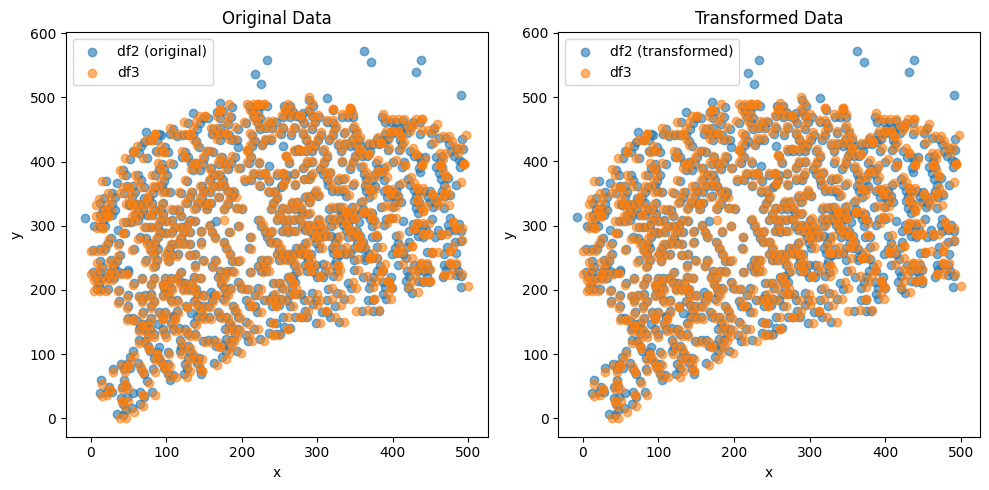

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (966,)
df2 (966, 2)
df3 (966, 2)
Optimal Translation and Rotation Parameters:
Translation: ( 5.561190036294643e-06 , 2.5233055150540172e-06 )
Rotation (radians): -0.000807990188990284
Transform Matrix:
 [[ 9.99999674e-01  8.07990101e-04  5.56119004e-06]
 [-8.07990101e-04  9.99999674e-01  2.52330552e-06]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


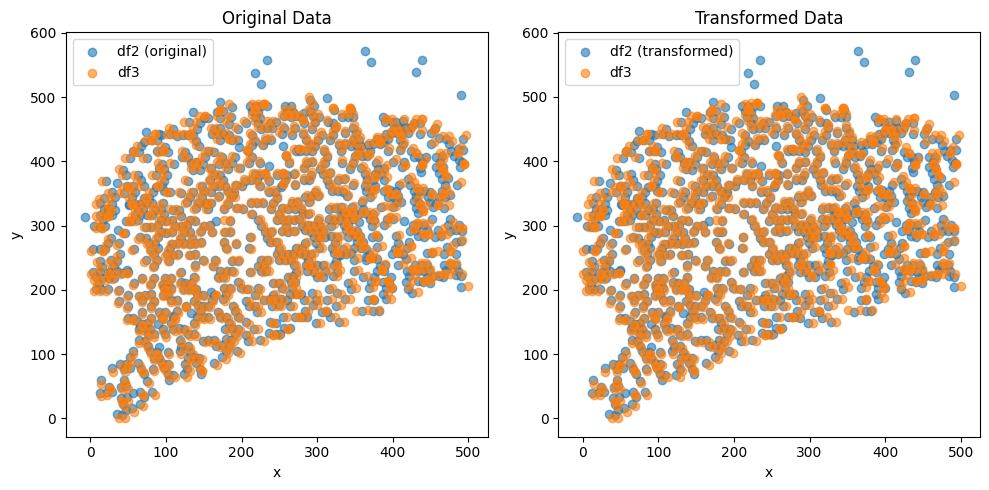

              0           1
0    100.410918  200.301707
1    100.056454  288.876583
2    400.337558  344.864524
3     89.249902  300.176015
4     88.108382  433.211412
..          ...         ...
995  187.597471  433.832146
996   95.181690   86.353201
997  350.634202  283.524169
998  132.536585  290.604130
999  182.515703  333.773319

[1000 rows x 2 columns]


In [1772]:
dist_min = 1  # min euclidean distance
data2_spatial_results = perform_transformations(data2_spatial_results, data3_spatial_results, Y_c, Z_c, data2_leiden_str, data1_leiden_str)
print(data2_spatial_results)

min_row_indices (877,)
df2 (877, 2)
df3 (877, 2)


C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


Optimal Translation and Rotation Parameters:
Translation: ( 6.507087840720926e-06 , 4.1953085299931455e-06 )
Rotation (radians): -0.0006586811144146667
Transform Matrix:
 [[ 9.99999783e-01  6.58681067e-04  6.50708784e-06]
 [-6.58681067e-04  9.99999783e-01  4.19530853e-06]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


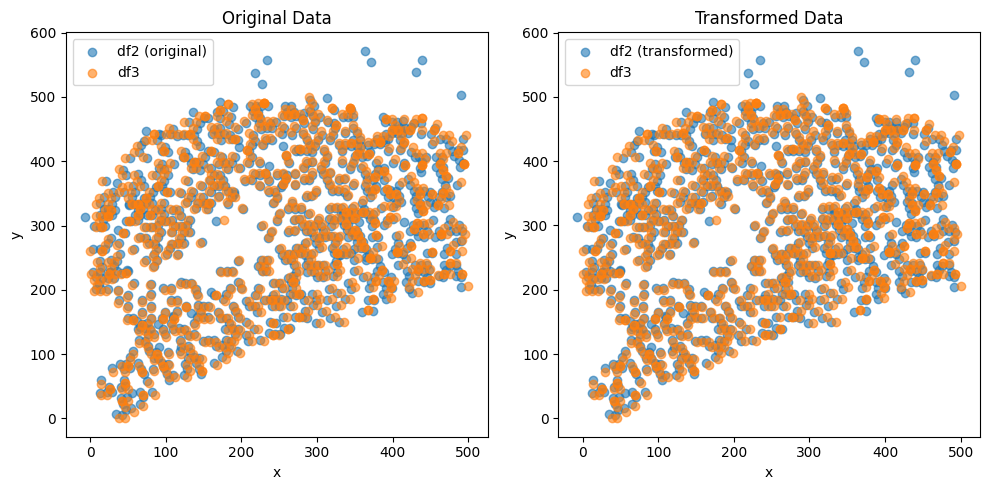

              0           1
0    100.542838  200.235529
1    100.246717  288.810619
2    400.564633  344.600759
3     89.447610  300.117167
4     88.393718  433.153287
..          ...         ...
995  187.883194  433.708489
996   95.238556   86.290492
997  350.820885  283.293155
998  132.727978  290.516771
999  182.735520  333.653031

[1000 rows x 2 columns]


In [1773]:
dist_min = 2  # min euclidean distance
data2_spatial_results = perform_transformations(data2_spatial_results, data3_spatial_results, Y_c, Z_c, data2_leiden_str, data1_leiden_str)
print(data2_spatial_results)

min_row_indices (346,)
df2 (346, 2)
df3 (346, 2)


C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


Optimal Translation and Rotation Parameters:
Translation: ( -0.25487927956401807 , -0.5416708319342891 )
Rotation (radians): 0.001020356740851154
Transform Matrix:
 [[ 0.99999948 -0.00102036 -0.25487928]
 [ 0.00102036  0.99999948 -0.54167083]
 [ 0.          0.          1.        ]]


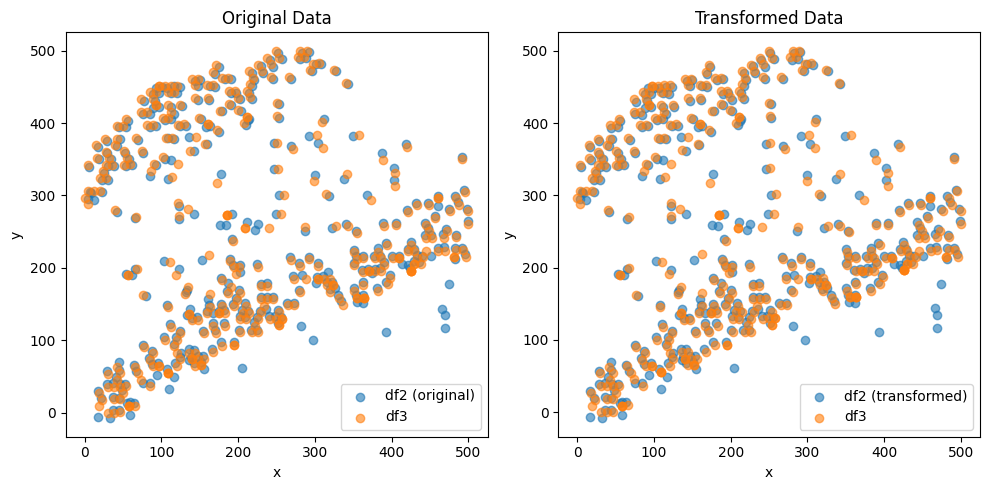

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (303,)
df2 (303, 2)
df3 (303, 2)
Optimal Translation and Rotation Parameters:
Translation: ( -0.00010362650086111082 , -0.00019933380773426288 )
Rotation (radians): -0.0006949050465625702
Transform Matrix:
 [[ 9.99999759e-01  6.94904991e-04 -1.03626501e-04]
 [-6.94904991e-04  9.99999759e-01 -1.99333808e-04]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


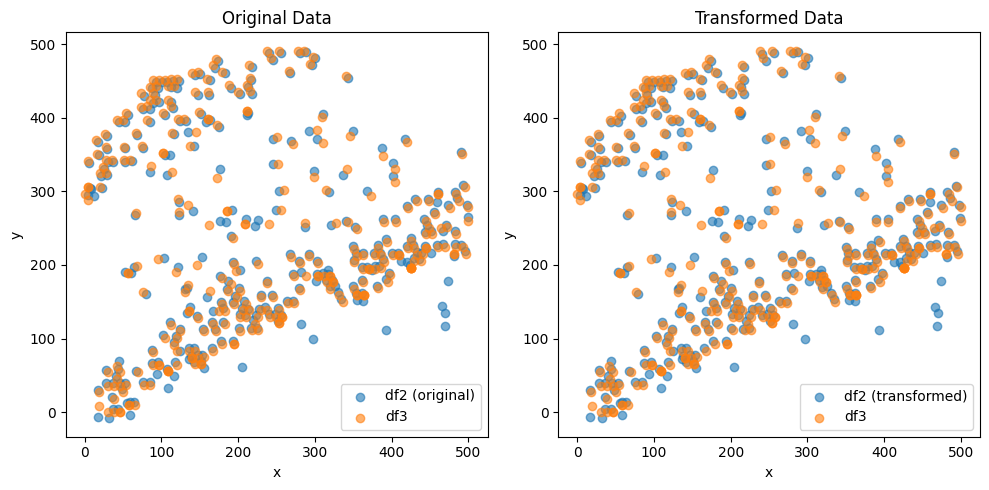

              0           1
0    333.872784  348.865357
1    245.815824  336.273219
2    396.864985  314.135585
3    112.223870  440.994963
4    221.043788  353.641435
..          ...         ...
995  335.254005  418.586911
996   36.063421   20.654099
997  275.074614  355.714978
998  122.030539  197.290484
999   80.862326  315.409941

[1000 rows x 2 columns]


In [1649]:
dist_min = 3  # min euclidean distance
data2_spatial_results = perform_transformations(data2_spatial_results, data3_spatial_results, Y_c, Z_c, data2_leiden_str, data1_leiden_str)
print(data2_spatial_results)

min_row_indices (66,)
df2 (66, 2)
df3 (66, 2)
Optimal Translation and Rotation Parameters:
Translation: ( 1.6840384034053124 , 2.075722193097936 )
Rotation (radians): 0.012850843584319087
Transform Matrix:
 [[ 0.99991743 -0.01285049  1.6840384 ]
 [ 0.01285049  0.99991743  2.07572219]
 [ 0.          0.          1.        ]]


C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


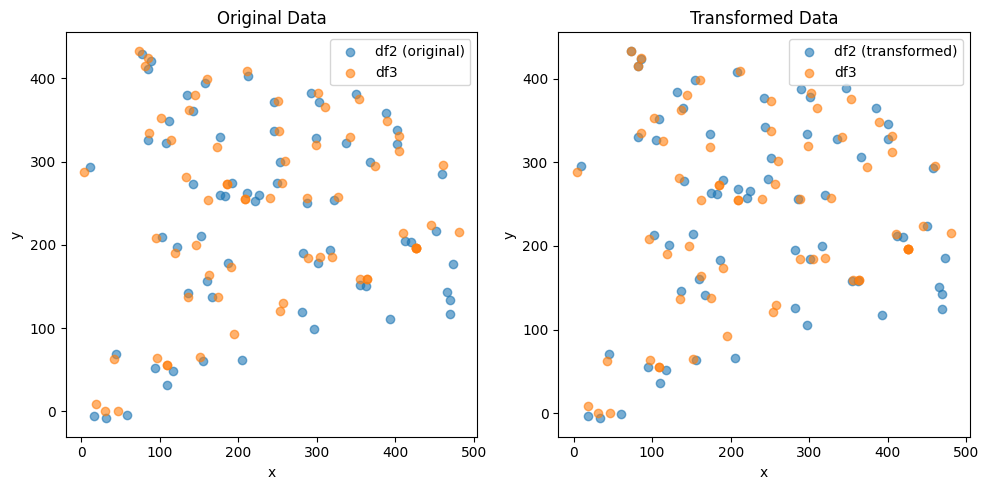

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (384,)
df2 (384, 2)
df3 (384, 2)
Optimal Translation and Rotation Parameters:
Translation: ( 1.4945711849765416e-05 , -1.4558260395777788e-05 )
Rotation (radians): -0.008440453261398292
Transform Matrix:
 [[ 9.99964380e-01  8.44035304e-03  1.49457118e-05]
 [-8.44035304e-03  9.99964380e-01 -1.45582604e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


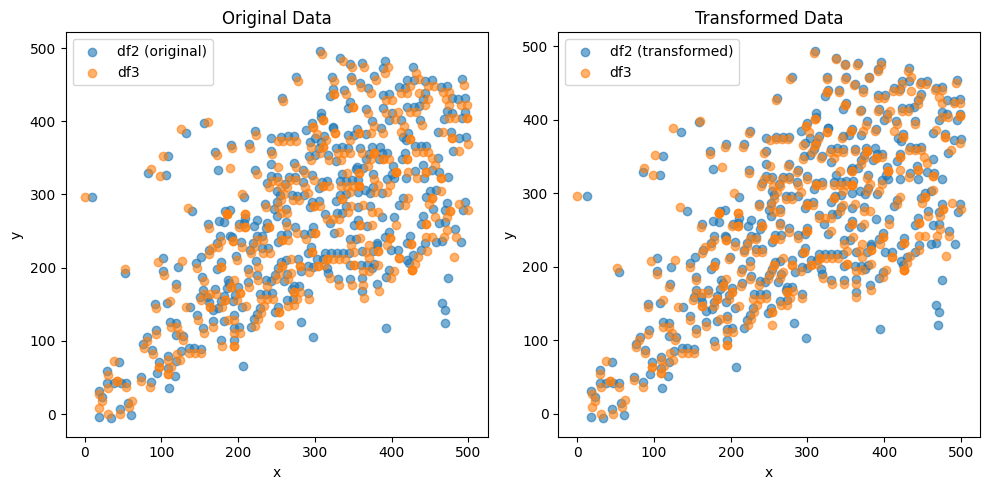

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (230,)
df2 (230, 2)
df3 (230, 2)
Optimal Translation and Rotation Parameters:
Translation: ( -5.074102357255109e-06 , -1.5209627208294887e-05 )
Rotation (radians): -0.0037548874486886385
Transform Matrix:
 [[ 9.99992950e-01  3.75487863e-03 -5.07410236e-06]
 [-3.75487863e-03  9.99992950e-01 -1.52096272e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


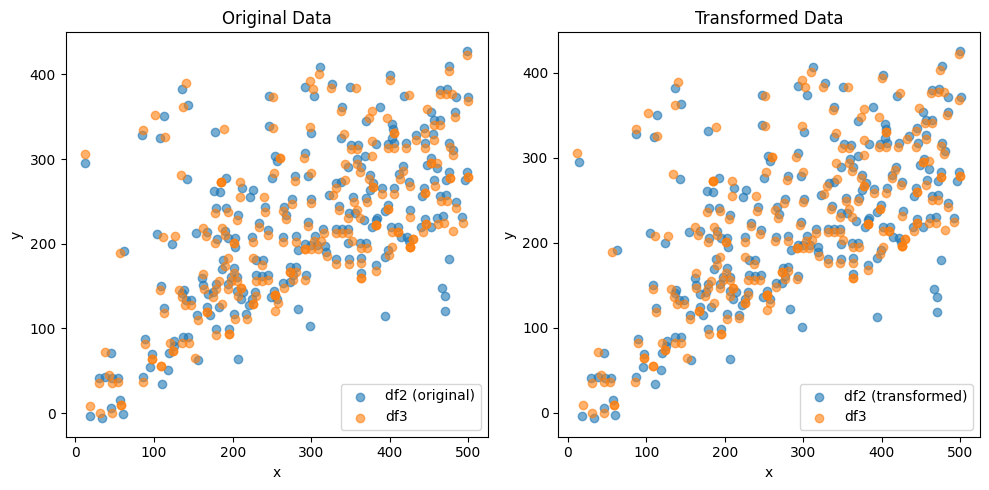

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (142,)
df2 (142, 2)
df3 (142, 2)
Optimal Translation and Rotation Parameters:
Translation: ( -0.00011217579000545804 , -4.0366042980730025e-05 )
Rotation (radians): 0.003555511075522329
Transform Matrix:
 [[ 9.99993679e-01 -3.55550358e-03 -1.12175790e-04]
 [ 3.55550358e-03  9.99993679e-01 -4.03660430e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


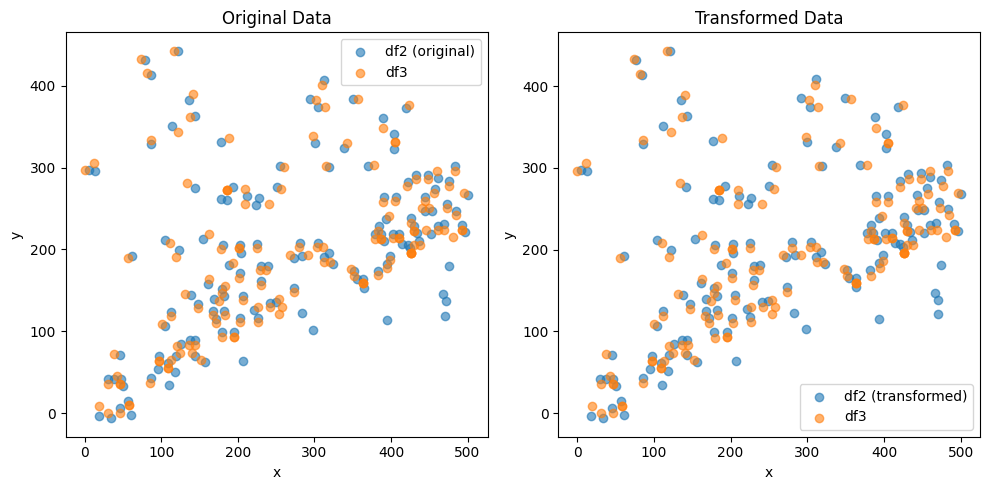

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (229,)
df2 (229, 2)
df3 (229, 2)
Optimal Translation and Rotation Parameters:
Translation: ( -5.324492277093596e-06 , -1.376173197806738e-05 )
Rotation (radians): -0.0031953964623716693
Transform Matrix:
 [[ 9.99994895e-01  3.19539102e-03 -5.32449228e-06]
 [-3.19539102e-03  9.99994895e-01 -1.37617320e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


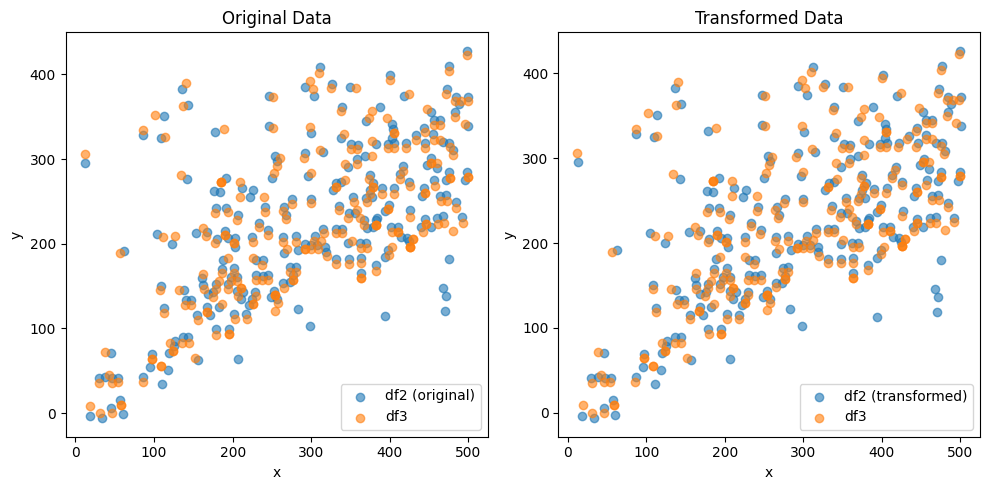

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (145,)
df2 (145, 2)
df3 (145, 2)
Optimal Translation and Rotation Parameters:
Translation: ( -3.5251144029107934e-05 , -1.287506192861587e-05 )
Rotation (radians): 0.0024105128231162332
Transform Matrix:
 [[ 9.99997095e-01 -2.41051049e-03 -3.52511440e-05]
 [ 2.41051049e-03  9.99997095e-01 -1.28750619e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


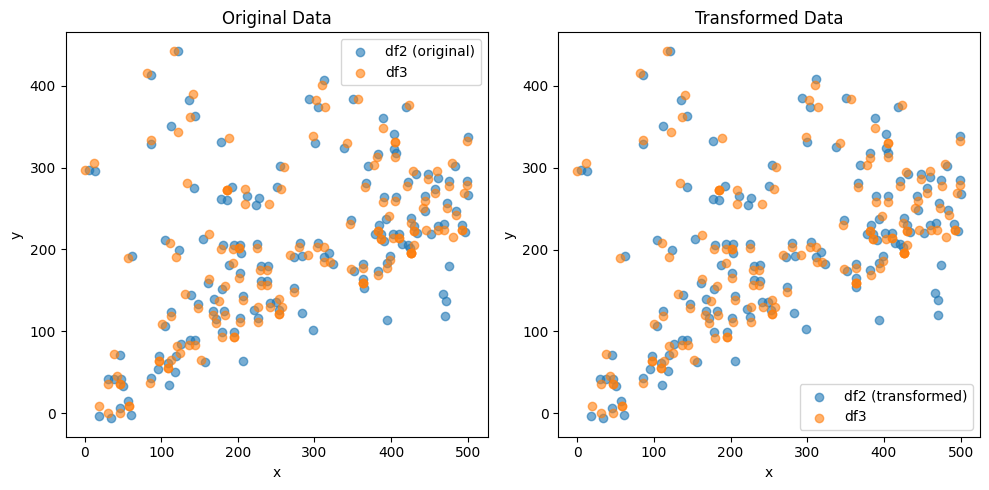

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (205,)
df2 (205, 2)
df3 (205, 2)
Optimal Translation and Rotation Parameters:
Translation: ( -6.5811833144197175e-06 , -1.2433893093315272e-05 )
Rotation (radians): -0.002602867378359119
Transform Matrix:
 [[ 9.99996613e-01  2.60286444e-03 -6.58118331e-06]
 [-2.60286444e-03  9.99996613e-01 -1.24338931e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


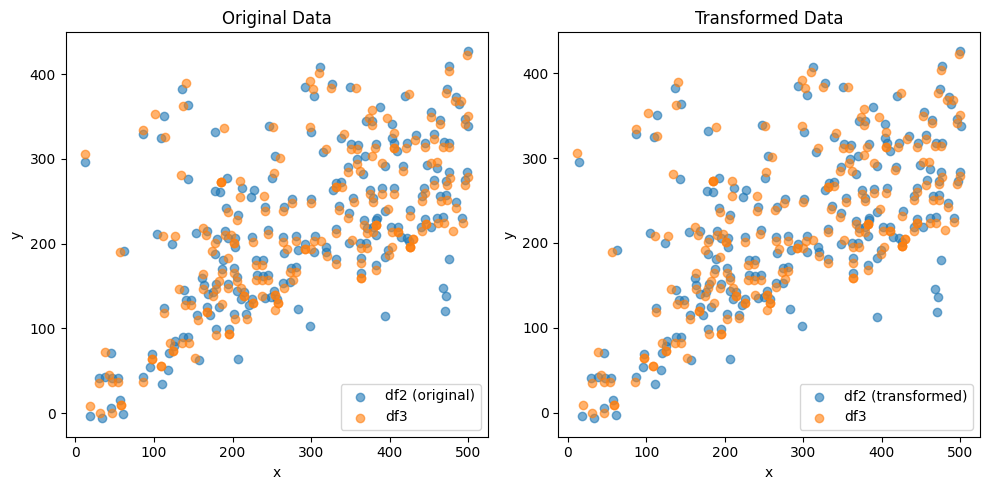

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (142,)
df2 (142, 2)
df3 (142, 2)
Optimal Translation and Rotation Parameters:
Translation: ( -1.7856852951857632e-05 , 2.4283966441950886e-06 )
Rotation (radians): 0.0040236916811218874
Transform Matrix:
 [[ 9.99991905e-01 -4.02368082e-03 -1.78568530e-05]
 [ 4.02368082e-03  9.99991905e-01  2.42839664e-06]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


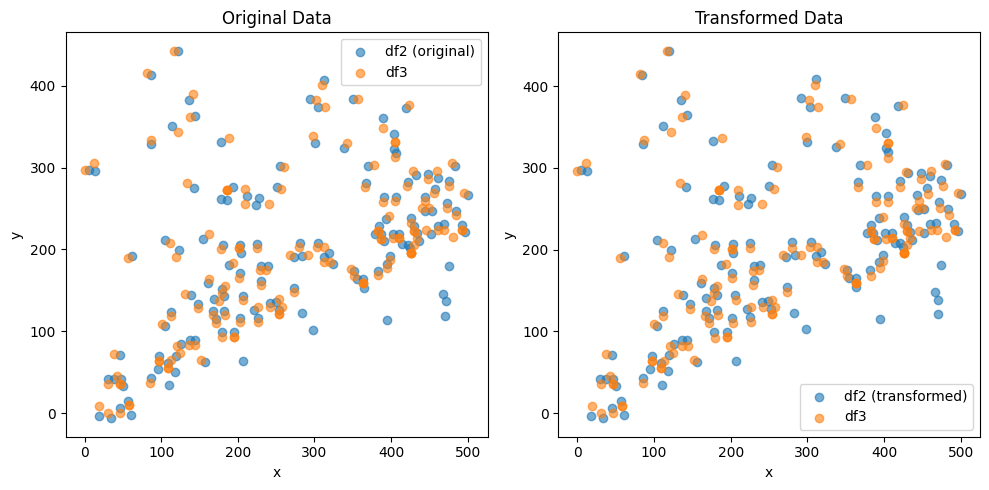

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (235,)
df2 (235, 2)
df3 (235, 2)
Optimal Translation and Rotation Parameters:
Translation: ( -2.8899830053285094e-06 , -1.5541716984454574e-05 )
Rotation (radians): -0.004013448404172552
Transform Matrix:
 [[ 9.99991946e-01  4.01343763e-03 -2.88998301e-06]
 [-4.01343763e-03  9.99991946e-01 -1.55417170e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


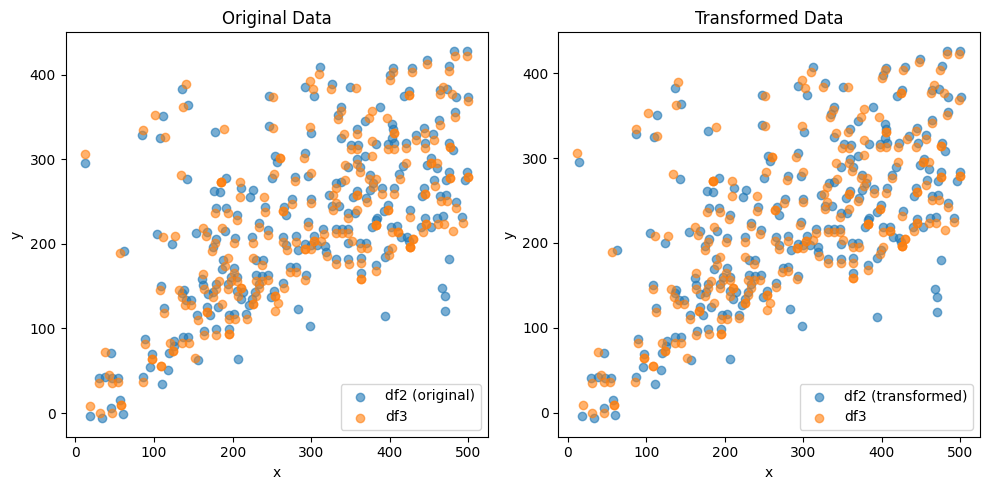

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (141,)
df2 (141, 2)
df3 (141, 2)
Optimal Translation and Rotation Parameters:
Translation: ( -1.769844025253981e-05 , 2.1166926918163134e-06 )
Rotation (radians): 0.003941434440205911
Transform Matrix:
 [[ 9.99992233e-01 -3.94142424e-03 -1.76984403e-05]
 [ 3.94142424e-03  9.99992233e-01  2.11669269e-06]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


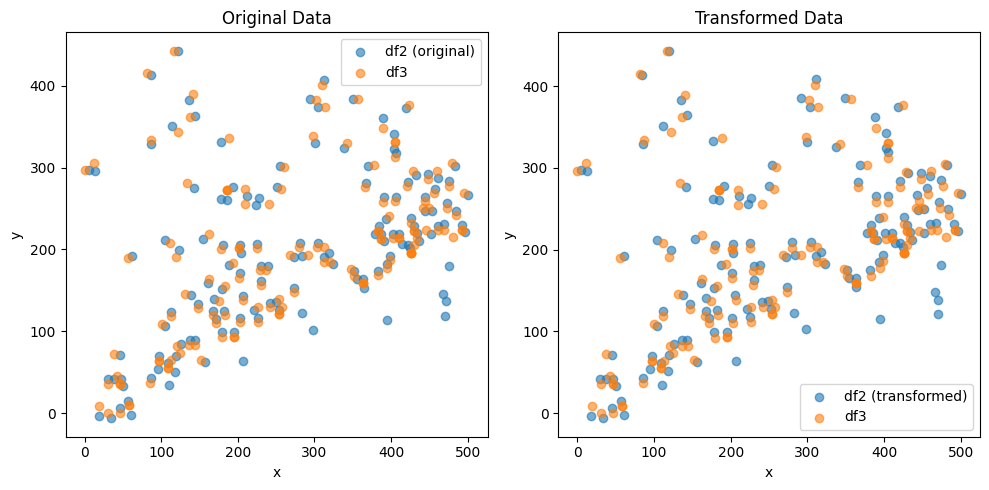

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (235,)
df2 (235, 2)
df3 (235, 2)
Optimal Translation and Rotation Parameters:
Translation: ( -3.2840865653773975e-06 , -1.5142139714938585e-05 )
Rotation (radians): -0.0037760639647826883
Transform Matrix:
 [[ 9.99992871e-01  3.77605499e-03 -3.28408657e-06]
 [-3.77605499e-03  9.99992871e-01 -1.51421397e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


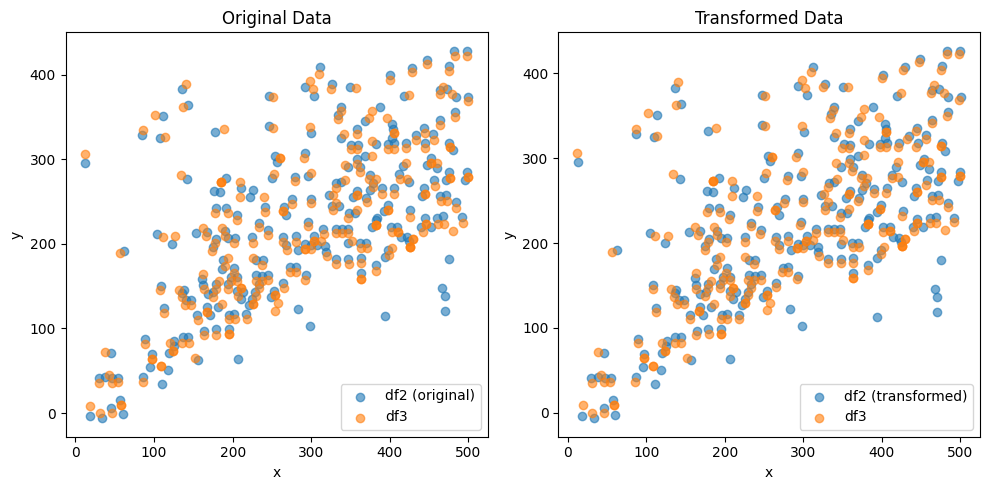

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (144,)
df2 (144, 2)
df3 (144, 2)
Optimal Translation and Rotation Parameters:
Translation: ( -3.347548450851888e-05 , -1.1097249652022985e-05 )
Rotation (radians): 0.0028627165232949663
Transform Matrix:
 [[ 9.99995902e-01 -2.86271261e-03 -3.34754845e-05]
 [ 2.86271261e-03  9.99995902e-01 -1.10972497e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


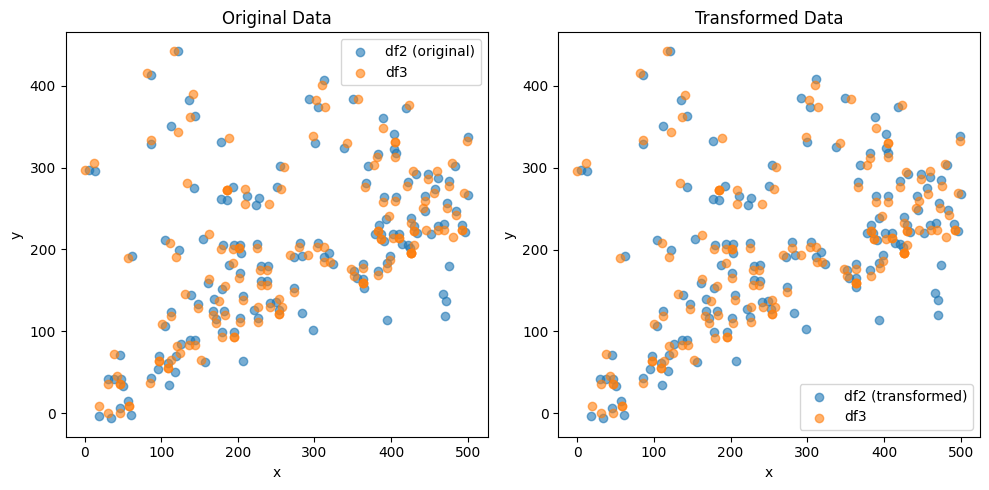

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (221,)
df2 (221, 2)
df3 (221, 2)
Optimal Translation and Rotation Parameters:
Translation: ( -6.149942860918138e-06 , -1.2892513616781914e-05 )
Rotation (radians): -0.002534167373567261
Transform Matrix:
 [[ 9.99996789e-01  2.53416466e-03 -6.14994286e-06]
 [-2.53416466e-03  9.99996789e-01 -1.28925136e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


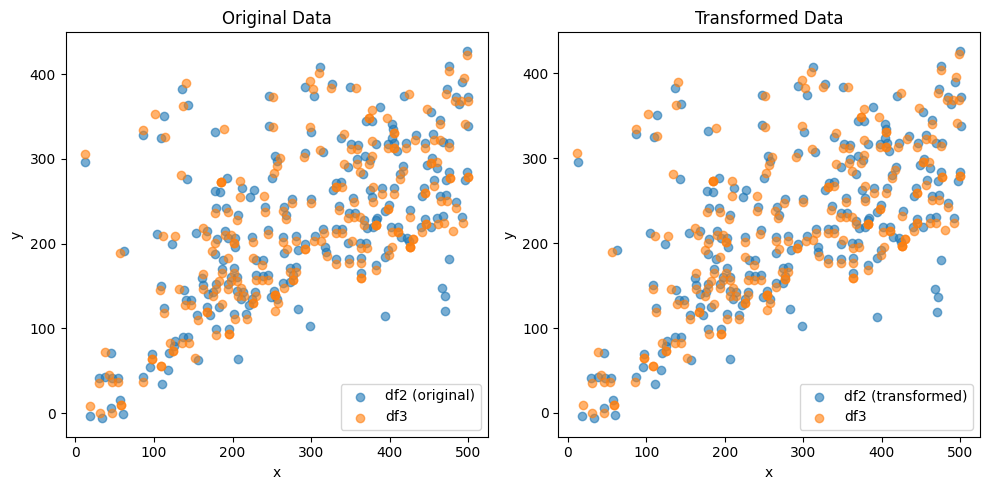

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (153,)
df2 (153, 2)
df3 (153, 2)
Optimal Translation and Rotation Parameters:
Translation: ( -3.498450126533021e-05 , -1.5715289111492716e-05 )
Rotation (radians): 0.0022802590701359554
Transform Matrix:
 [[ 9.99997400e-01 -2.28025709e-03 -3.49845013e-05]
 [ 2.28025709e-03  9.99997400e-01 -1.57152891e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


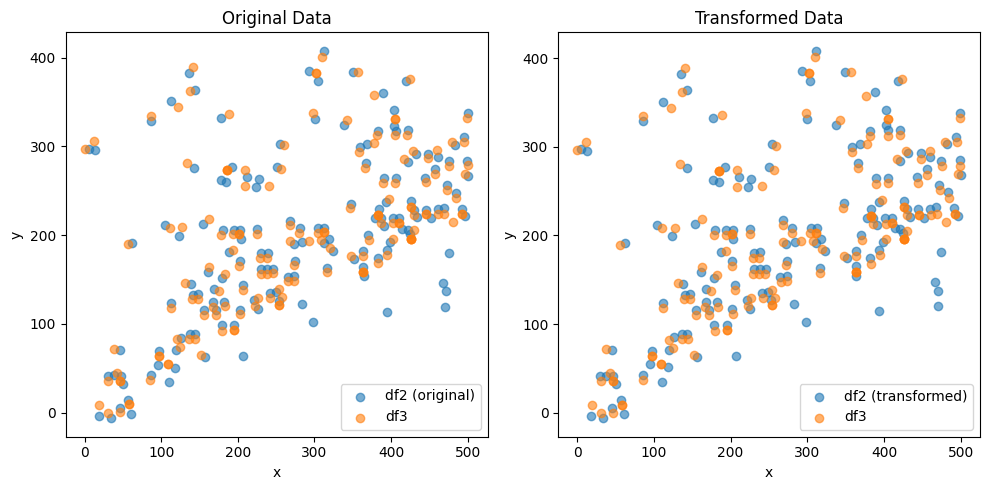

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (207,)
df2 (207, 2)
df3 (207, 2)
Optimal Translation and Rotation Parameters:
Translation: ( -5.109630924797583e-06 , -1.0918954944308409e-05 )
Rotation (radians): -0.002354696417848906
Transform Matrix:
 [[ 9.99997228e-01  2.35469424e-03 -5.10963092e-06]
 [-2.35469424e-03  9.99997228e-01 -1.09189549e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


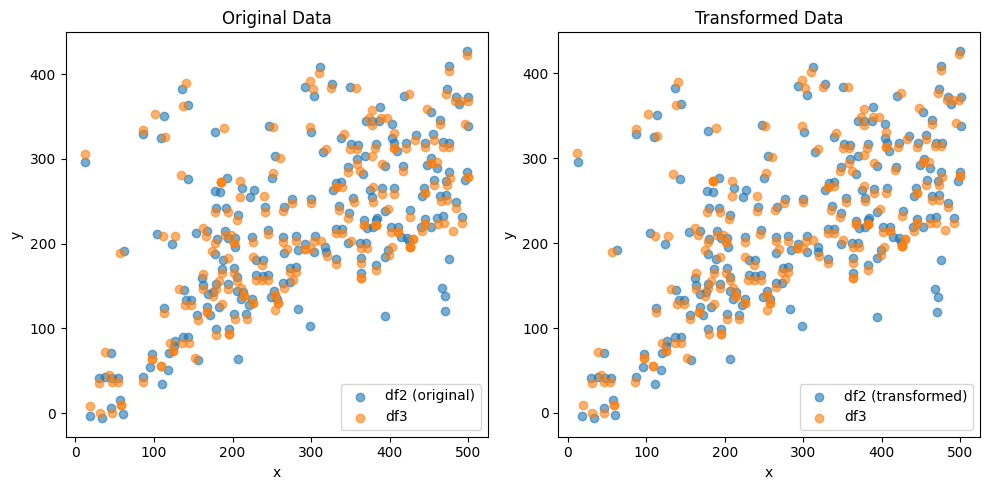

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (150,)
df2 (150, 2)
df3 (150, 2)
Optimal Translation and Rotation Parameters:
Translation: ( -2.8406501231991024e-05 , -1.1440688065766917e-05 )
Rotation (radians): 0.002762584003029274
Transform Matrix:
 [[ 9.99996184e-01 -2.76258049e-03 -2.84065012e-05]
 [ 2.76258049e-03  9.99996184e-01 -1.14406881e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


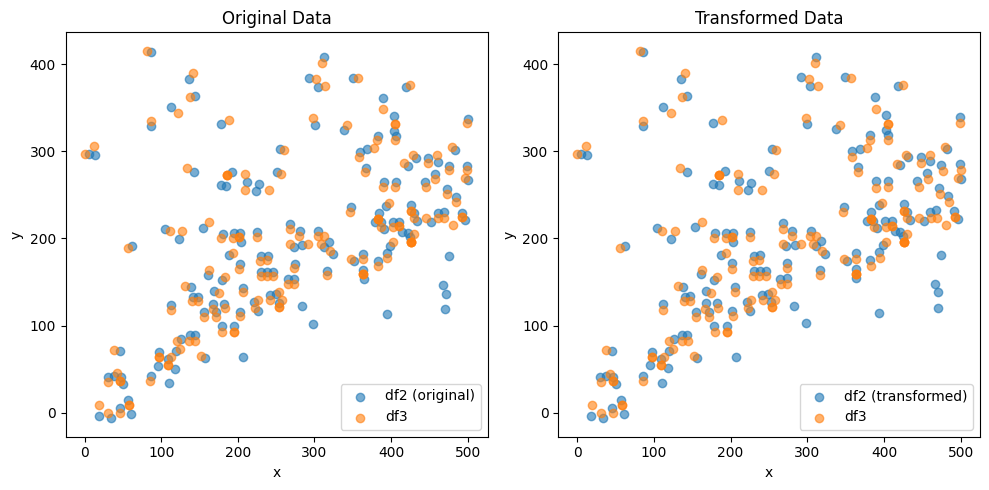

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (225,)
df2 (225, 2)
df3 (225, 2)
Optimal Translation and Rotation Parameters:
Translation: ( -5.782647978851818e-06 , -1.2797101663096178e-05 )
Rotation (radians): -0.0026809132396801686
Transform Matrix:
 [[ 9.99996406e-01  2.68091003e-03 -5.78264798e-06]
 [-2.68091003e-03  9.99996406e-01 -1.27971017e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


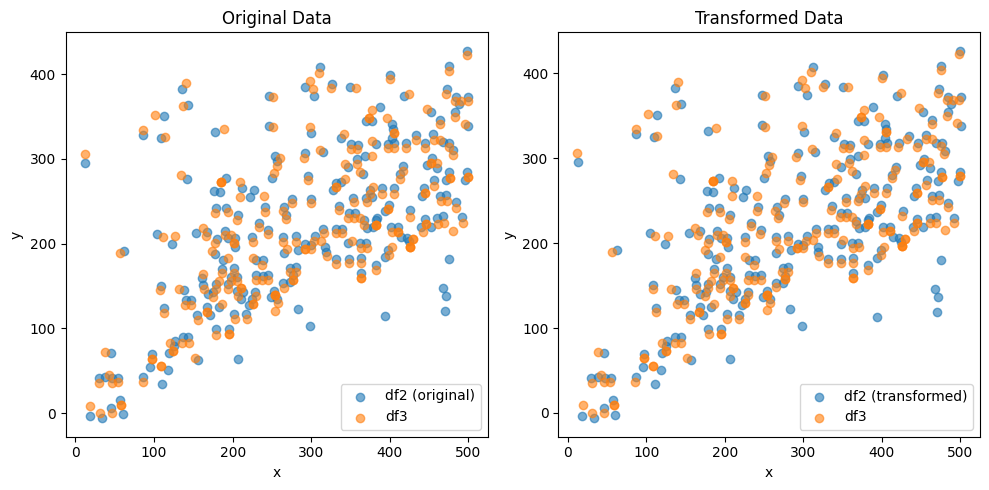

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (153,)
df2 (153, 2)
df3 (153, 2)
Optimal Translation and Rotation Parameters:
Translation: ( -3.498768413078974e-05 , -1.5733282662352366e-05 )
Rotation (radians): 0.002273073219455189
Transform Matrix:
 [[ 9.99997417e-01 -2.27307126e-03 -3.49876841e-05]
 [ 2.27307126e-03  9.99997417e-01 -1.57332827e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


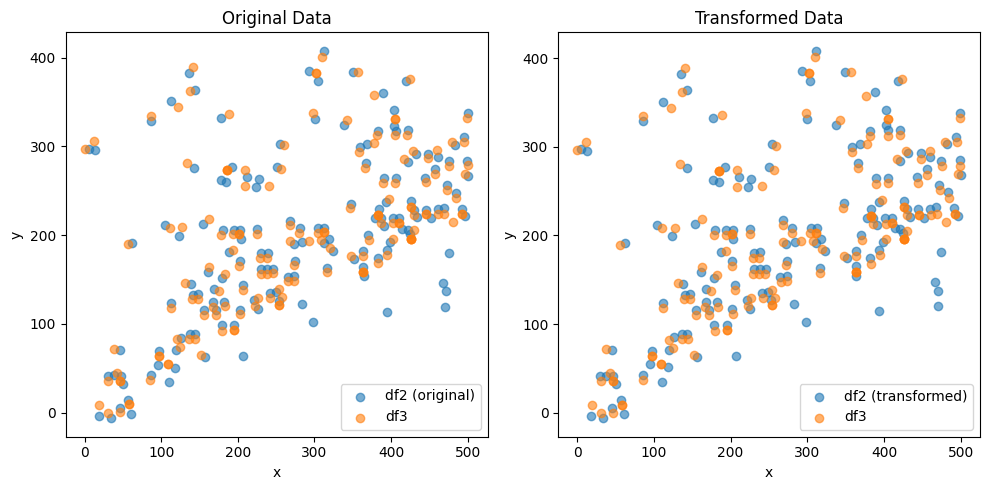

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (207,)
df2 (207, 2)
df3 (207, 2)
Optimal Translation and Rotation Parameters:
Translation: ( -5.1101731849961894e-06 , -1.0970425382098446e-05 )
Rotation (radians): -0.002354761376250062
Transform Matrix:
 [[ 9.99997228e-01  2.35475920e-03 -5.11017318e-06]
 [-2.35475920e-03  9.99997228e-01 -1.09704254e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


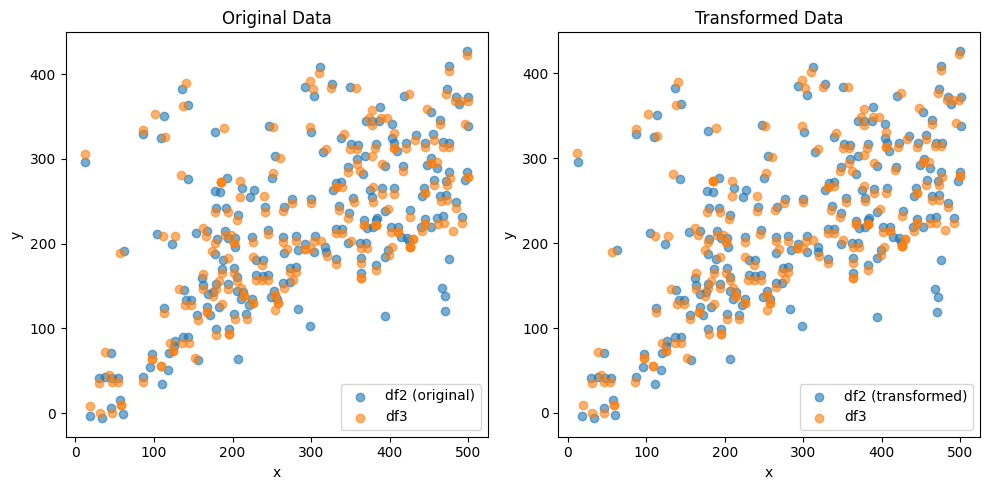

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (150,)
df2 (150, 2)
df3 (150, 2)
Optimal Translation and Rotation Parameters:
Translation: ( -2.8370895483388567e-05 , -1.1527093532231729e-05 )
Rotation (radians): 0.0027625560242186013
Transform Matrix:
 [[ 9.99996184e-01 -2.76255251e-03 -2.83708955e-05]
 [ 2.76255251e-03  9.99996184e-01 -1.15270935e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


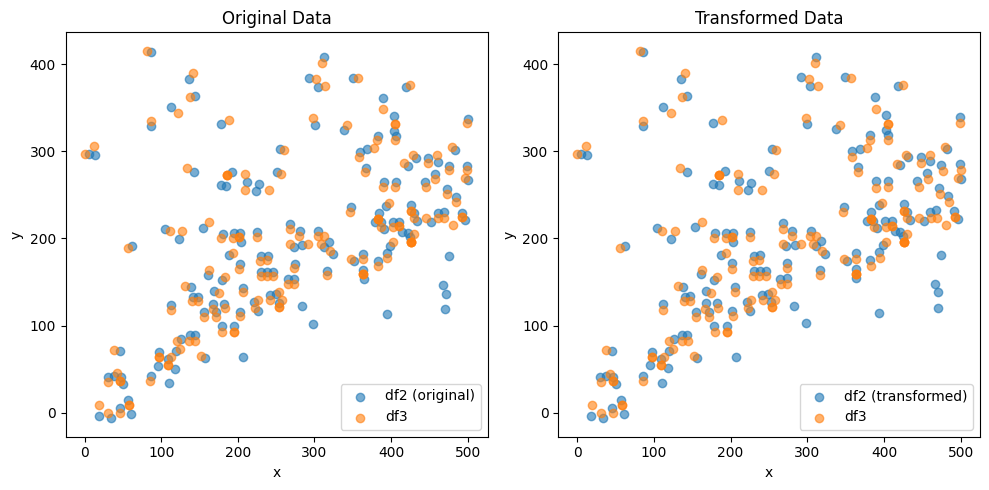

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (225,)
df2 (225, 2)
df3 (225, 2)
Optimal Translation and Rotation Parameters:
Translation: ( -5.835235138059864e-06 , -1.2831687267405942e-05 )
Rotation (radians): -0.0026808819353404093
Transform Matrix:
 [[ 9.99996406e-01  2.68087872e-03 -5.83523514e-06]
 [-2.68087872e-03  9.99996406e-01 -1.28316873e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


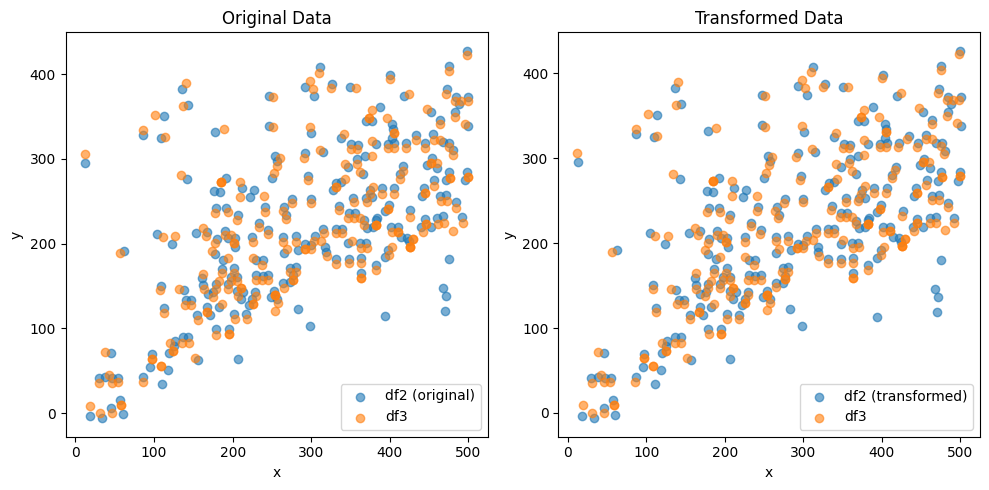

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (153,)
df2 (153, 2)
df3 (153, 2)
Optimal Translation and Rotation Parameters:
Translation: ( -3.502634838491329e-05 , -1.5815162083517035e-05 )
Rotation (radians): 0.0022730820798256917
Transform Matrix:
 [[ 9.99997417e-01 -2.27308012e-03 -3.50263484e-05]
 [ 2.27308012e-03  9.99997417e-01 -1.58151621e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


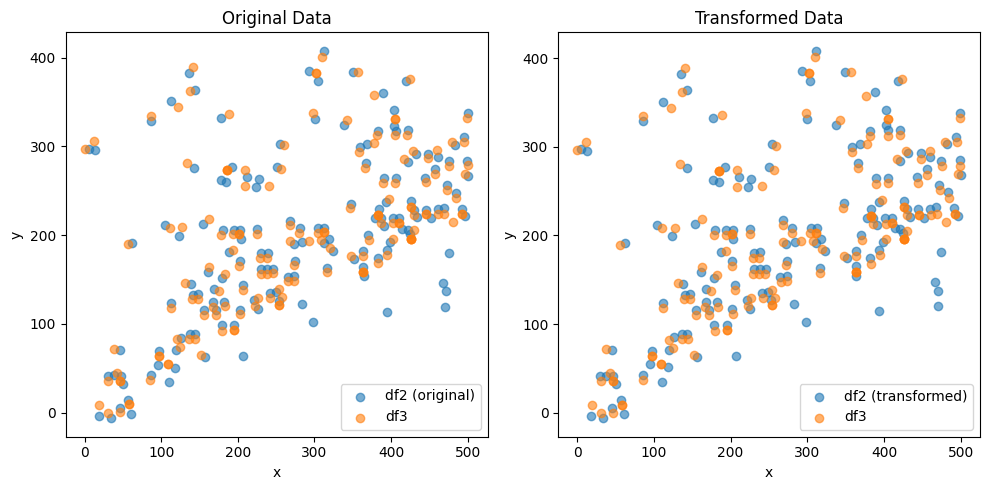

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (207,)
df2 (207, 2)
df3 (207, 2)
Optimal Translation and Rotation Parameters:
Translation: ( -5.084482197738736e-06 , -1.094516361422274e-05 )
Rotation (radians): -0.002354766536732101
Transform Matrix:
 [[ 9.99997228e-01  2.35476436e-03 -5.08448220e-06]
 [-2.35476436e-03  9.99997228e-01 -1.09451636e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


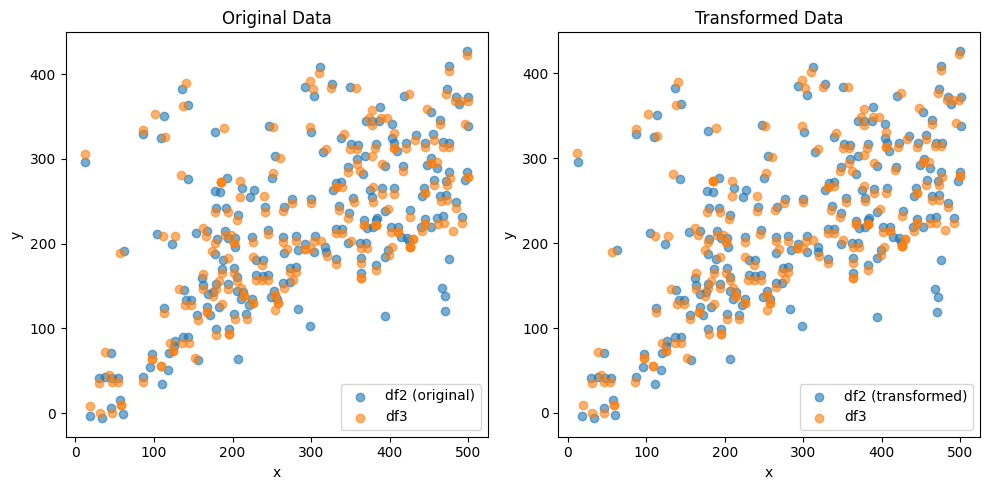

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (150,)
df2 (150, 2)
df3 (150, 2)
Optimal Translation and Rotation Parameters:
Translation: ( -2.8296216456315035e-05 , -1.1517946948172845e-05 )
Rotation (radians): 0.002762625186305414
Transform Matrix:
 [[ 9.99996184e-01 -2.76262167e-03 -2.82962165e-05]
 [ 2.76262167e-03  9.99996184e-01 -1.15179469e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


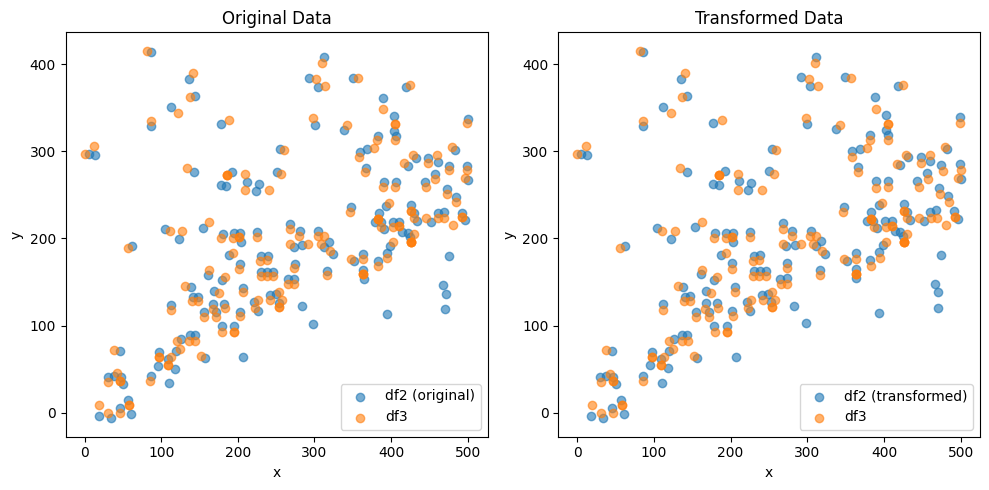

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (225,)
df2 (225, 2)
df3 (225, 2)
Optimal Translation and Rotation Parameters:
Translation: ( -5.823913760549014e-06 , -1.2775938024813142e-05 )
Rotation (radians): -0.0026809972722274737
Transform Matrix:
 [[ 9.99996406e-01  2.68099406e-03 -5.82391376e-06]
 [-2.68099406e-03  9.99996406e-01 -1.27759380e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


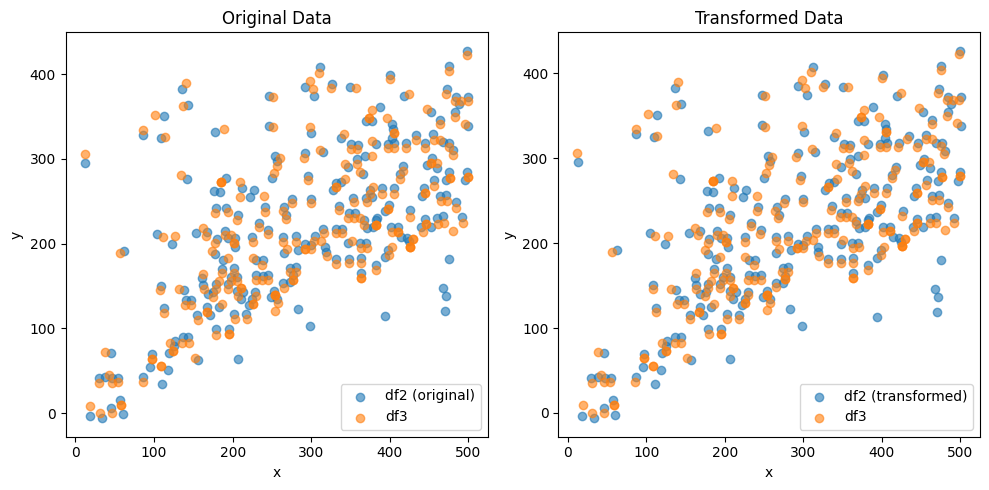

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (153,)
df2 (153, 2)
df3 (153, 2)
Optimal Translation and Rotation Parameters:
Translation: ( -3.492779364136228e-05 , -1.5797810080583246e-05 )
Rotation (radians): 0.0022731212043161585
Transform Matrix:
 [[ 9.99997416e-01 -2.27311925e-03 -3.49277936e-05]
 [ 2.27311925e-03  9.99997416e-01 -1.57978101e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


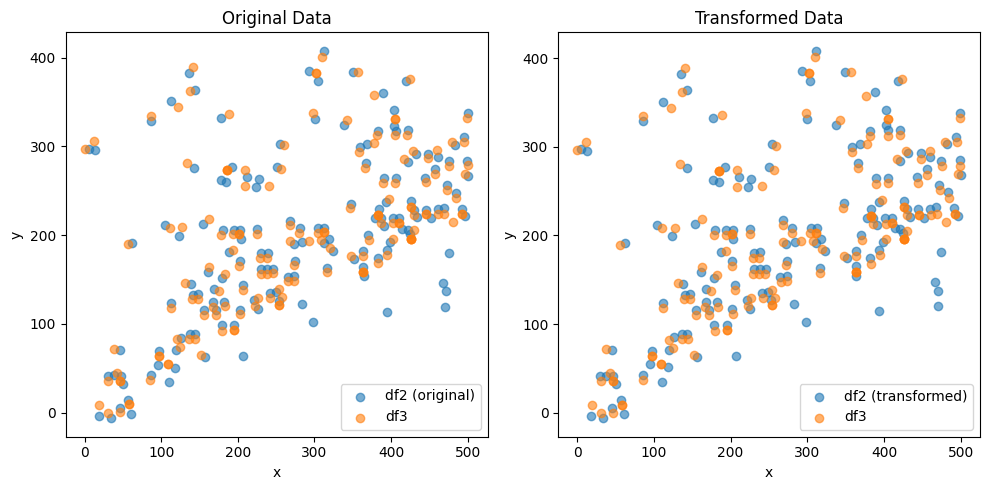

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (207,)
df2 (207, 2)
df3 (207, 2)
Optimal Translation and Rotation Parameters:
Translation: ( -5.109147425235981e-06 , -1.0937163503368051e-05 )
Rotation (radians): -0.002354730066210114
Transform Matrix:
 [[ 9.99997228e-01  2.35472789e-03 -5.10914743e-06]
 [-2.35472789e-03  9.99997228e-01 -1.09371635e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


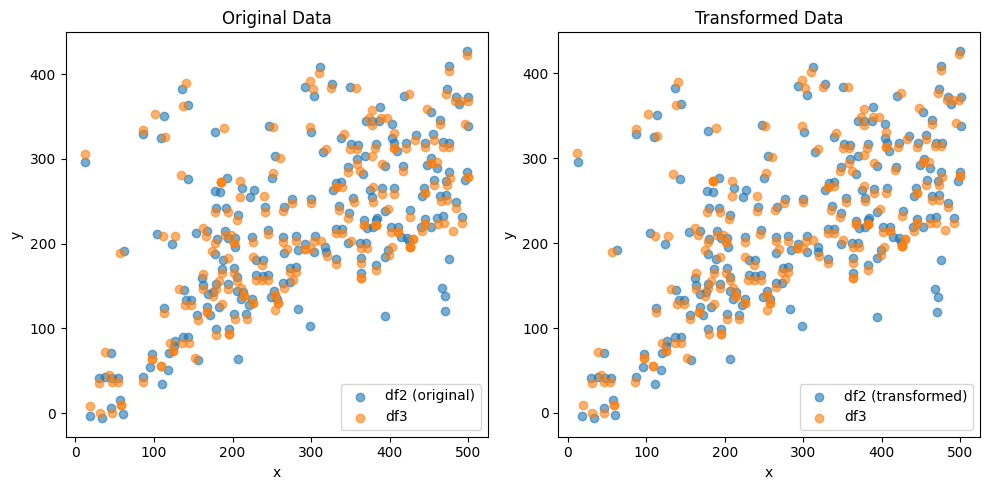

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (150,)
df2 (150, 2)
df3 (150, 2)
Optimal Translation and Rotation Parameters:
Translation: ( -2.8427667440893397e-05 , -1.1523202587909493e-05 )
Rotation (radians): 0.002762376862339143
Transform Matrix:
 [[ 9.99996185e-01 -2.76237335e-03 -2.84276674e-05]
 [ 2.76237335e-03  9.99996185e-01 -1.15232026e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


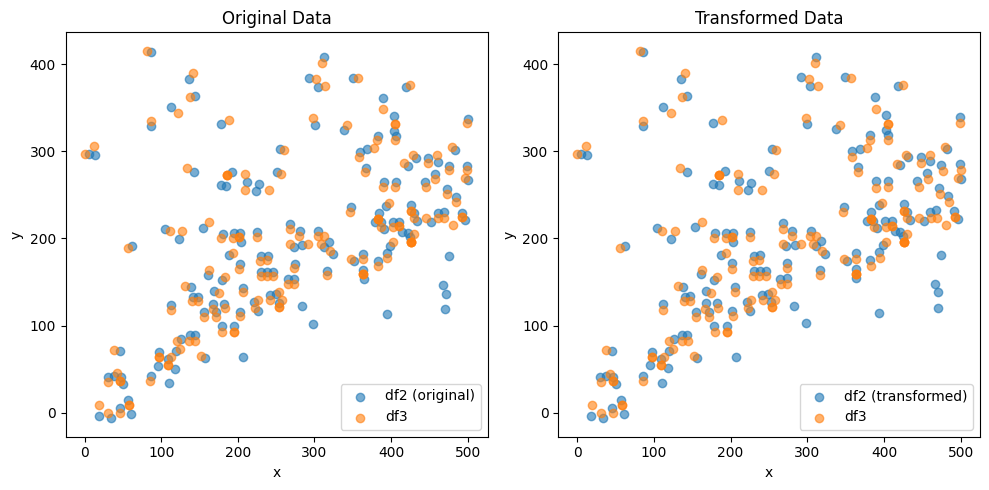

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (225,)
df2 (225, 2)
df3 (225, 2)
Optimal Translation and Rotation Parameters:
Translation: ( -5.800126362934566e-06 , -1.2731925359084547e-05 )
Rotation (radians): -0.002680757428249731
Transform Matrix:
 [[ 9.99996407e-01  2.68075422e-03 -5.80012636e-06]
 [-2.68075422e-03  9.99996407e-01 -1.27319254e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


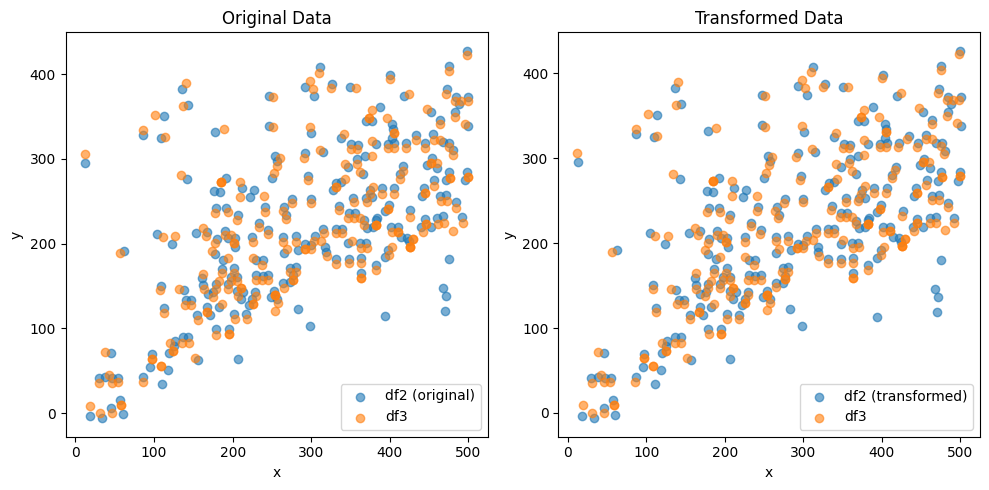

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (153,)
df2 (153, 2)
df3 (153, 2)
Optimal Translation and Rotation Parameters:
Translation: ( -3.4873970040052044e-05 , -1.5649372604320355e-05 )
Rotation (radians): 0.002273247076956472
Transform Matrix:
 [[ 9.99997416e-01 -2.27324512e-03 -3.48739700e-05]
 [ 2.27324512e-03  9.99997416e-01 -1.56493726e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


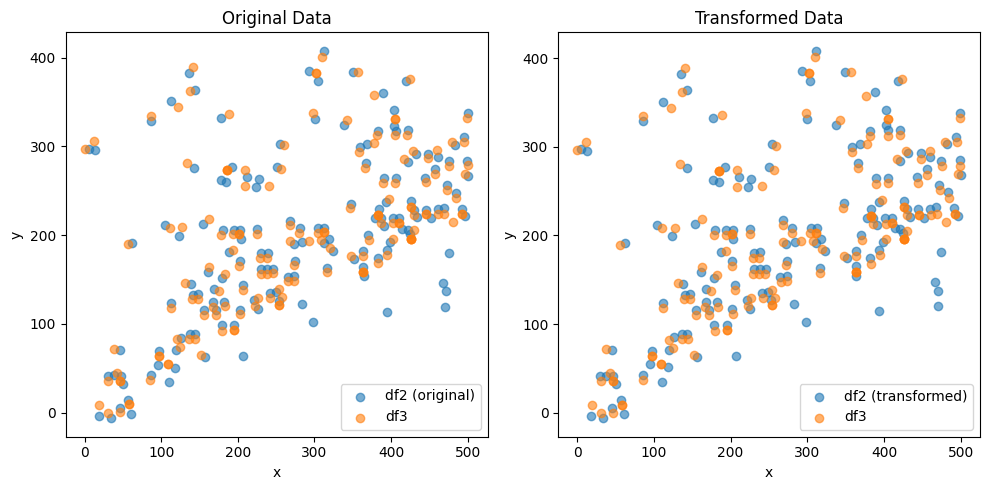

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (207,)
df2 (207, 2)
df3 (207, 2)
Optimal Translation and Rotation Parameters:
Translation: ( -5.106127799670216e-06 , -1.0958311639803968e-05 )
Rotation (radians): -0.0023549322683782694
Transform Matrix:
 [[ 9.99997227e-01  2.35493009e-03 -5.10612780e-06]
 [-2.35493009e-03  9.99997227e-01 -1.09583116e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


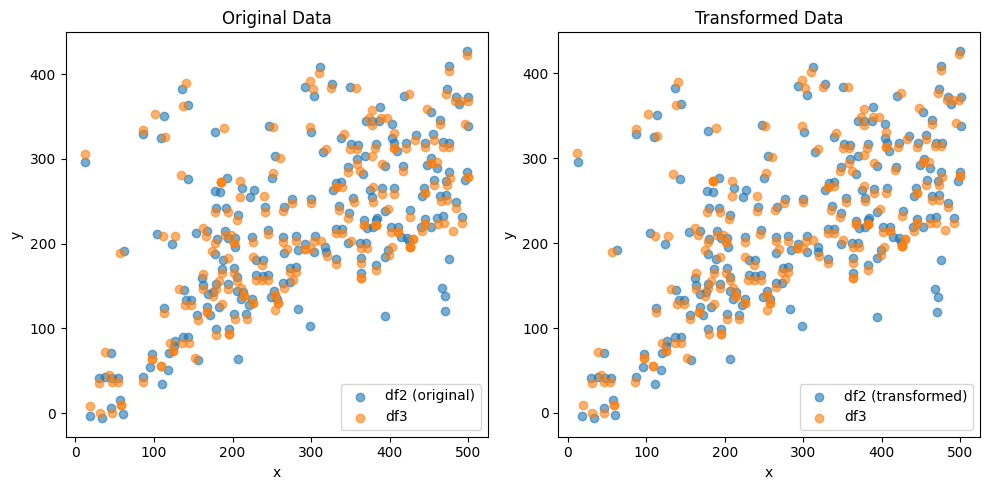

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (150,)
df2 (150, 2)
df3 (150, 2)
Optimal Translation and Rotation Parameters:
Translation: ( -2.839635639615257e-05 , -1.1571090669131765e-05 )
Rotation (radians): 0.002762611074610186
Transform Matrix:
 [[ 9.99996184e-01 -2.76260756e-03 -2.83963564e-05]
 [ 2.76260756e-03  9.99996184e-01 -1.15710907e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


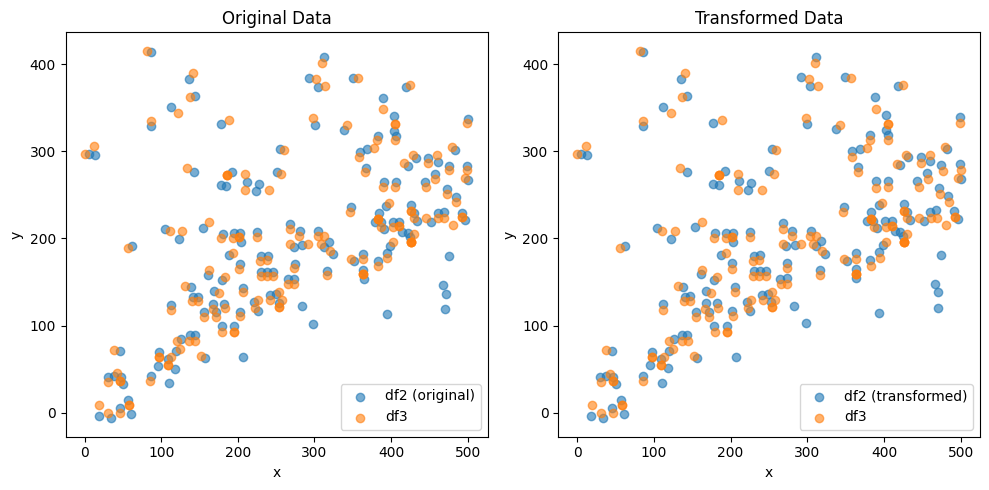

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (225,)
df2 (225, 2)
df3 (225, 2)
Optimal Translation and Rotation Parameters:
Translation: ( -5.783041046345749e-06 , -1.2787785909703252e-05 )
Rotation (radians): -0.002680933727603604
Transform Matrix:
 [[ 9.99996406e-01  2.68093052e-03 -5.78304105e-06]
 [-2.68093052e-03  9.99996406e-01 -1.27877859e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


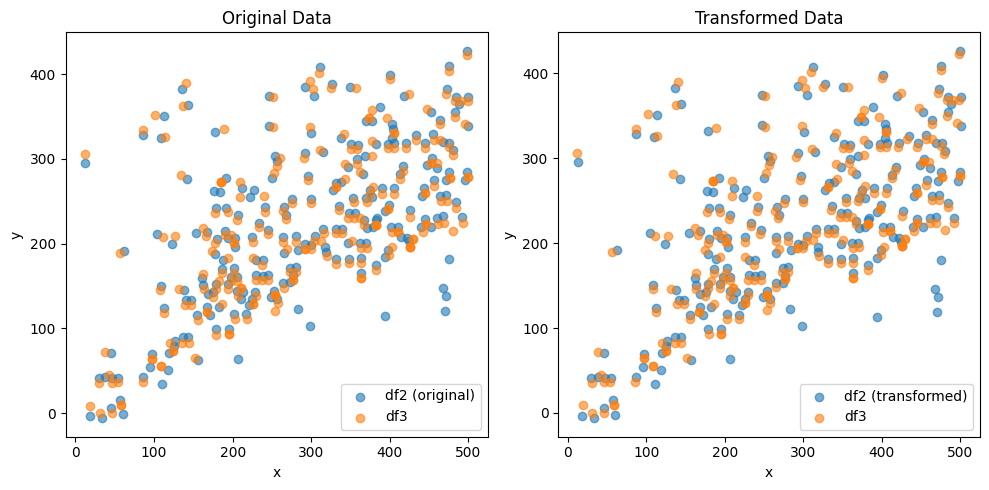

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (153,)
df2 (153, 2)
df3 (153, 2)
Optimal Translation and Rotation Parameters:
Translation: ( -3.4937360907675586e-05 , -1.584991214196563e-05 )
Rotation (radians): 0.002273147676554018
Transform Matrix:
 [[ 9.99997416e-01 -2.27314572e-03 -3.49373609e-05]
 [ 2.27314572e-03  9.99997416e-01 -1.58499121e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


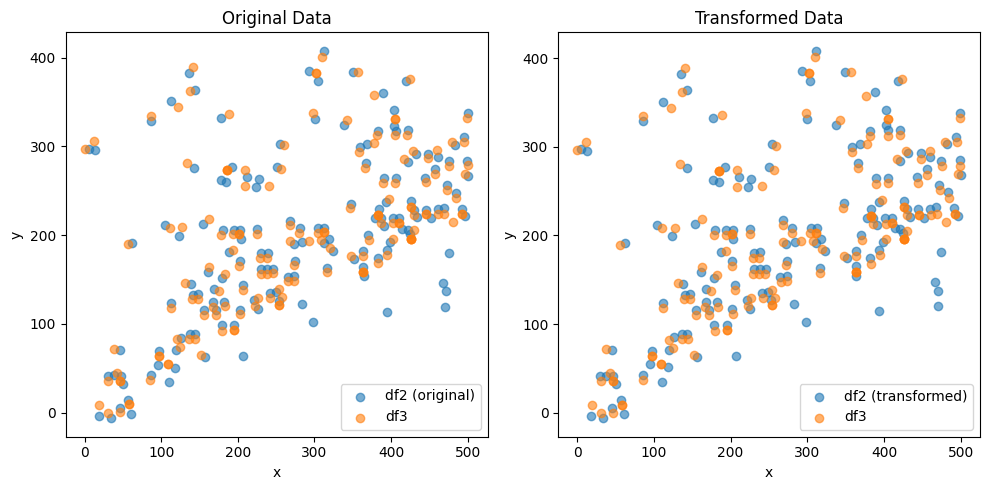

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (207,)
df2 (207, 2)
df3 (207, 2)
Optimal Translation and Rotation Parameters:
Translation: ( -5.106156211492992e-06 , -1.0968196522228174e-05 )
Rotation (radians): -0.0023548111314687648
Transform Matrix:
 [[ 9.99997227e-01  2.35480896e-03 -5.10615621e-06]
 [-2.35480896e-03  9.99997227e-01 -1.09681965e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


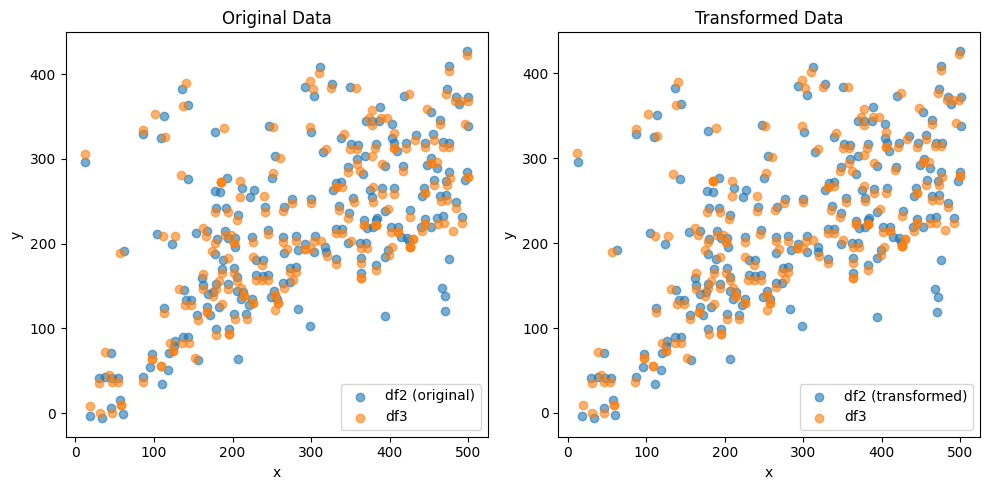

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (150,)
df2 (150, 2)
df3 (150, 2)
Optimal Translation and Rotation Parameters:
Translation: ( -2.833484461752215e-05 , -1.1615240189531157e-05 )
Rotation (radians): 0.0027625992085368208
Transform Matrix:
 [[ 9.99996184e-01 -2.76259569e-03 -2.83348446e-05]
 [ 2.76259569e-03  9.99996184e-01 -1.16152402e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


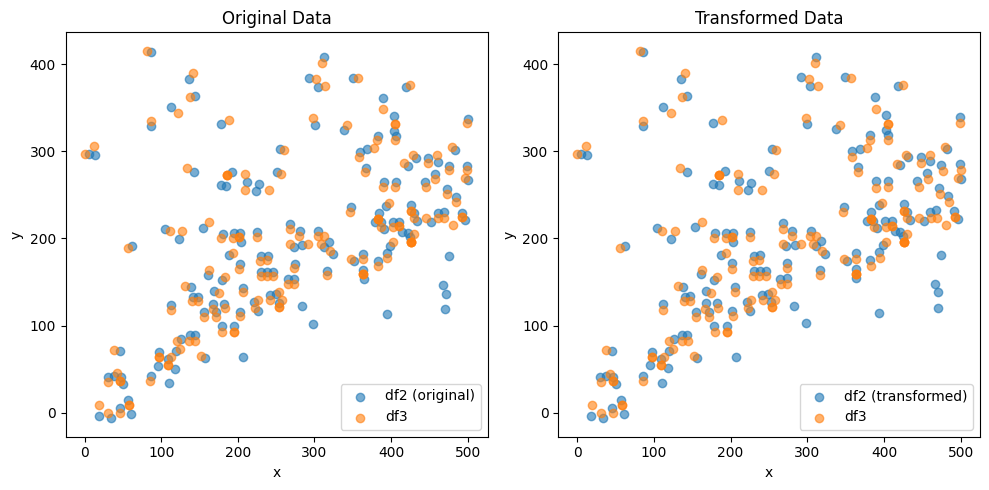

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (225,)
df2 (225, 2)
df3 (225, 2)
Optimal Translation and Rotation Parameters:
Translation: ( -5.8484526095988535e-06 , -1.2775082478480985e-05 )
Rotation (radians): -0.002680963675441367
Transform Matrix:
 [[ 9.99996406e-01  2.68096046e-03 -5.84845261e-06]
 [-2.68096046e-03  9.99996406e-01 -1.27750825e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


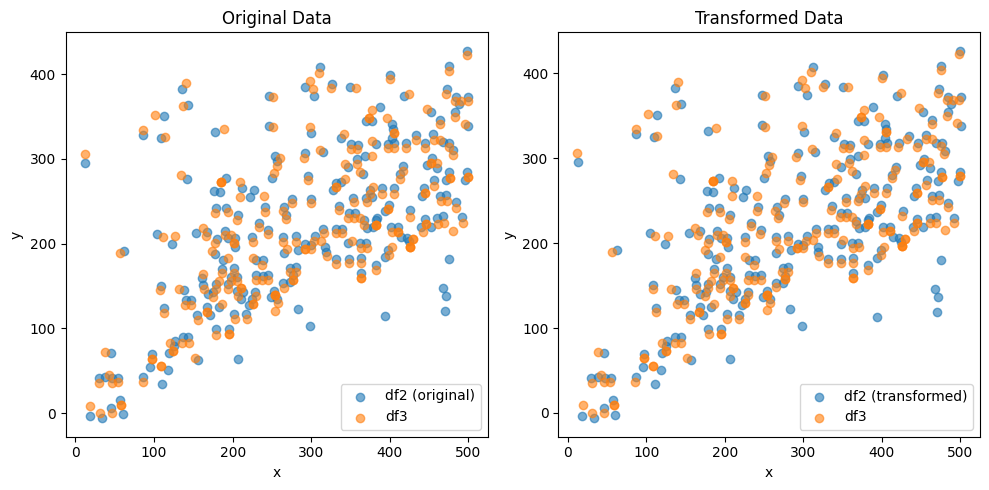

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (153,)
df2 (153, 2)
df3 (153, 2)
Optimal Translation and Rotation Parameters:
Translation: ( -3.48498271720949e-05 , -1.5639589099529328e-05 )
Rotation (radians): 0.0022732317460730997
Transform Matrix:
 [[ 9.99997416e-01 -2.27322979e-03 -3.48498272e-05]
 [ 2.27322979e-03  9.99997416e-01 -1.56395891e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


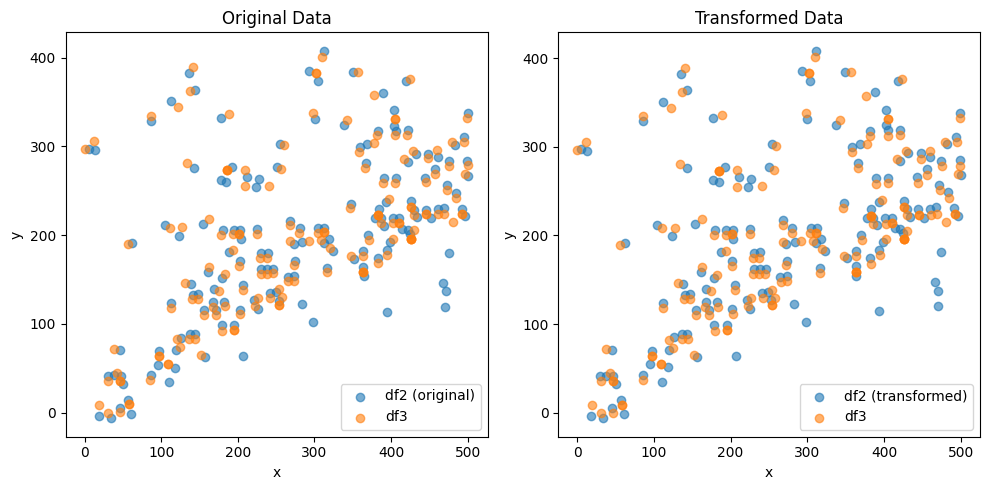

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (207,)
df2 (207, 2)
df3 (207, 2)
Optimal Translation and Rotation Parameters:
Translation: ( -5.128369388863583e-06 , -1.0959722736416536e-05 )
Rotation (radians): -0.002354922103870623
Transform Matrix:
 [[ 9.99997227e-01  2.35491993e-03 -5.12836939e-06]
 [-2.35491993e-03  9.99997227e-01 -1.09597227e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


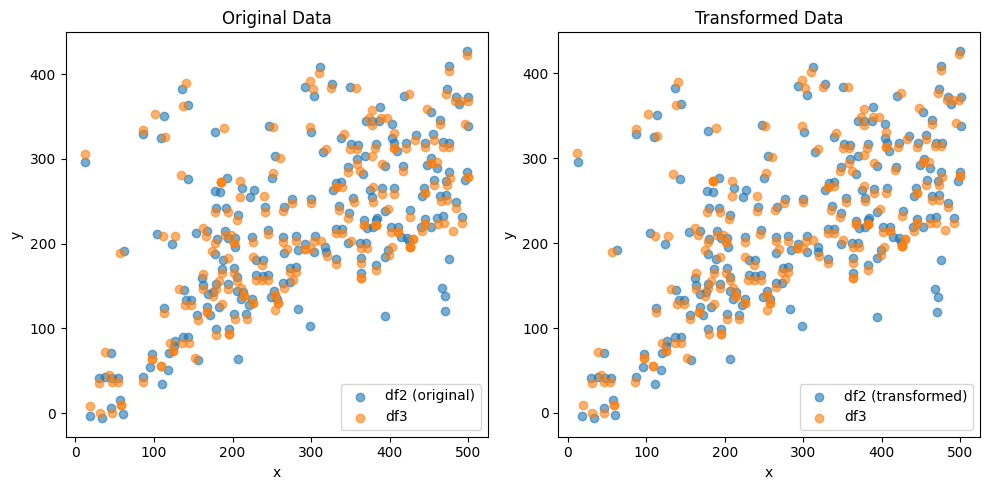

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (150,)
df2 (150, 2)
df3 (150, 2)
Optimal Translation and Rotation Parameters:
Translation: ( -2.842456069301552e-05 , -1.1535547552240074e-05 )
Rotation (radians): 0.002762686478023554
Transform Matrix:
 [[ 9.99996184e-01 -2.76268296e-03 -2.84245607e-05]
 [ 2.76268296e-03  9.99996184e-01 -1.15355476e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


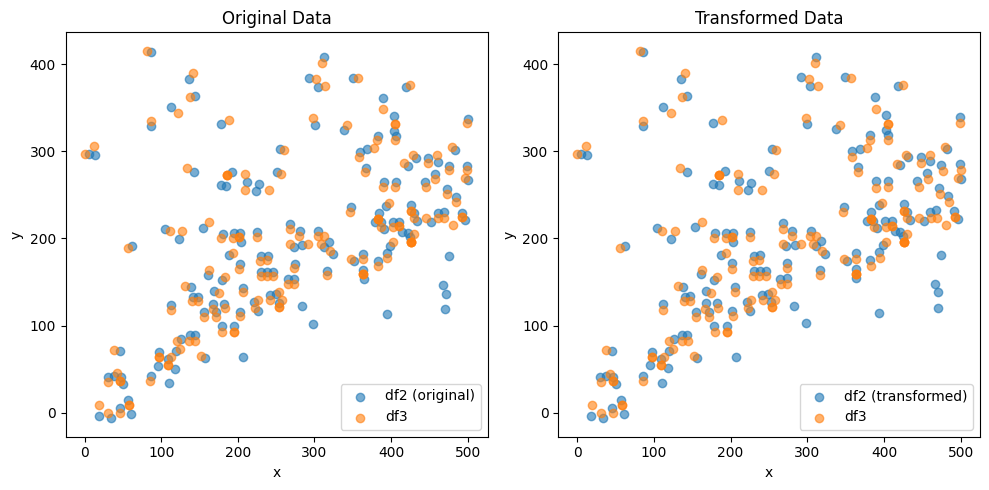

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (225,)
df2 (225, 2)
df3 (225, 2)
Optimal Translation and Rotation Parameters:
Translation: ( -5.838520187977068e-06 , -1.2839439213050055e-05 )
Rotation (radians): -0.002681016100746518
Transform Matrix:
 [[ 9.99996406e-01  2.68101289e-03 -5.83852019e-06]
 [-2.68101289e-03  9.99996406e-01 -1.28394392e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


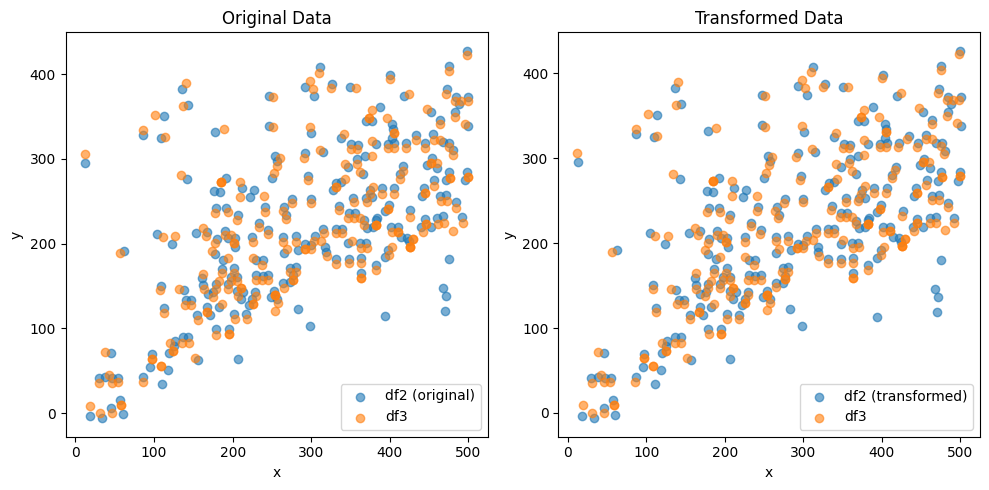

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (153,)
df2 (153, 2)
df3 (153, 2)
Optimal Translation and Rotation Parameters:
Translation: ( -3.4980905716072515e-05 , -1.5725190078962528e-05 )
Rotation (radians): 0.0022730447272937193
Transform Matrix:
 [[ 9.99997417e-01 -2.27304277e-03 -3.49809057e-05]
 [ 2.27304277e-03  9.99997417e-01 -1.57251901e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


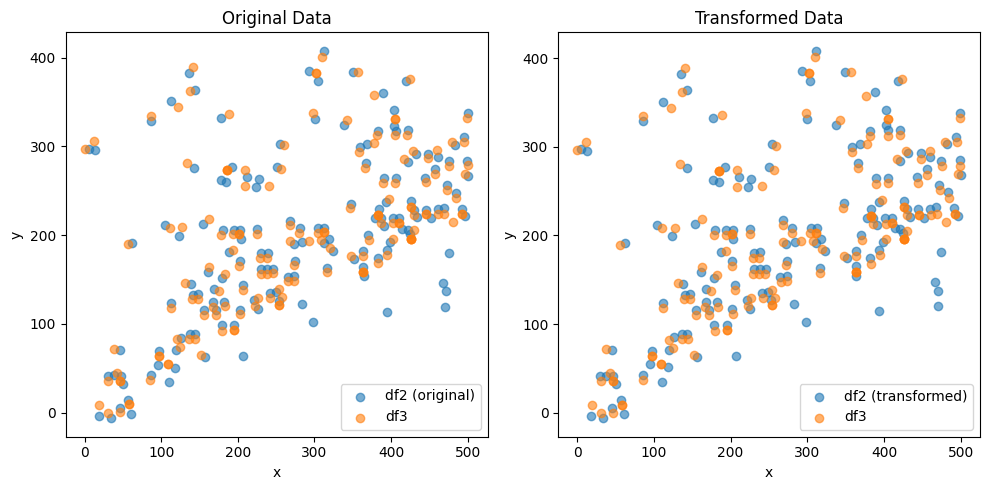

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (207,)
df2 (207, 2)
df3 (207, 2)
Optimal Translation and Rotation Parameters:
Translation: ( -5.1244367718397486e-06 , -1.0917851322388626e-05 )
Rotation (radians): -0.0023547053760801895
Transform Matrix:
 [[ 9.99997228e-01  2.35470320e-03 -5.12443677e-06]
 [-2.35470320e-03  9.99997228e-01 -1.09178513e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


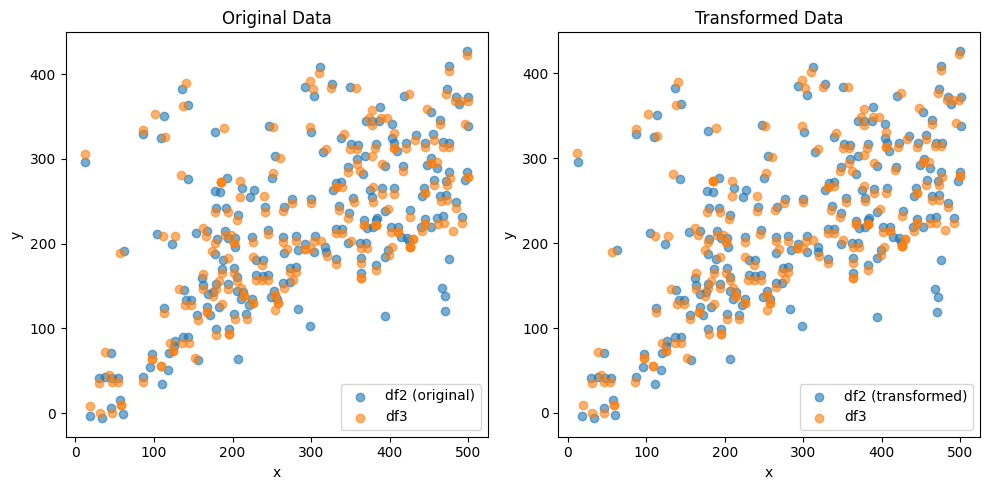

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (150,)
df2 (150, 2)
df3 (150, 2)
Optimal Translation and Rotation Parameters:
Translation: ( -2.8352305677698417e-05 , -1.1579746253318735e-05 )
Rotation (radians): 0.0027625539181992858
Transform Matrix:
 [[ 9.99996184e-01 -2.76255040e-03 -2.83523057e-05]
 [ 2.76255040e-03  9.99996184e-01 -1.15797463e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


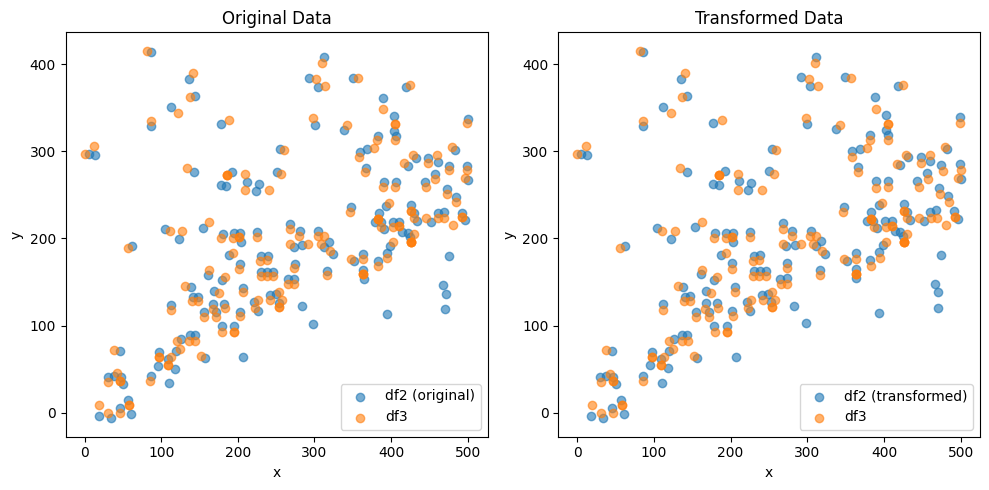

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (225,)
df2 (225, 2)
df3 (225, 2)
Optimal Translation and Rotation Parameters:
Translation: ( -5.825863772549852e-06 , -1.2782762163308449e-05 )
Rotation (radians): -0.00268090098190006
Transform Matrix:
 [[ 9.99996406e-01  2.68089777e-03 -5.82586377e-06]
 [-2.68089777e-03  9.99996406e-01 -1.27827622e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


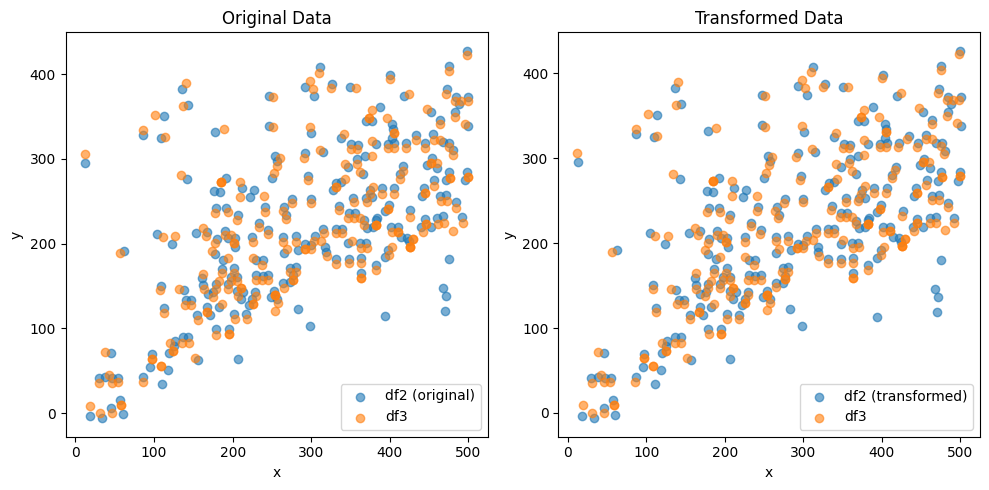

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (153,)
df2 (153, 2)
df3 (153, 2)
Optimal Translation and Rotation Parameters:
Translation: ( -3.4791797166684733e-05 , -1.566726630525809e-05 )
Rotation (radians): 0.0022733750183494723
Transform Matrix:
 [[ 9.99997416e-01 -2.27337306e-03 -3.47917972e-05]
 [ 2.27337306e-03  9.99997416e-01 -1.56672663e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


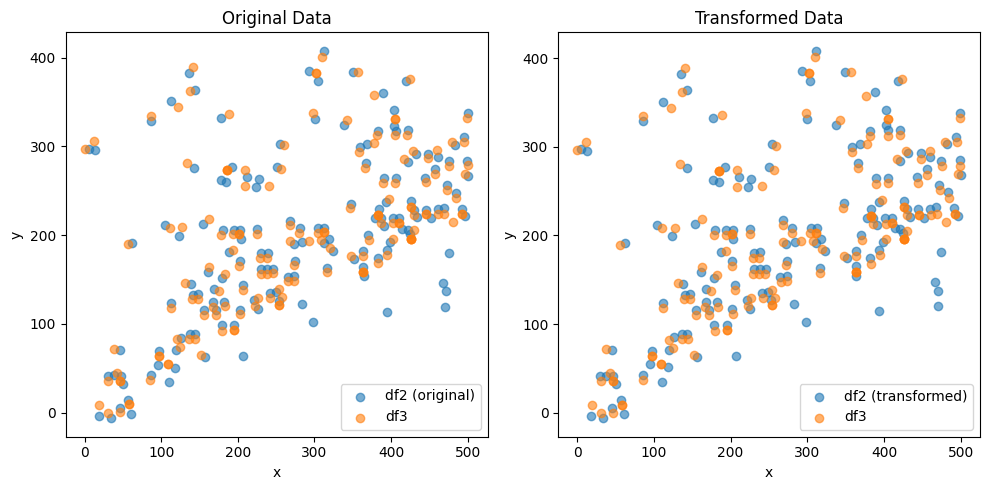

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (207,)
df2 (207, 2)
df3 (207, 2)
Optimal Translation and Rotation Parameters:
Translation: ( -5.073356447738971e-06 , -1.0909464283769847e-05 )
Rotation (radians): -0.002355011119354201
Transform Matrix:
 [[ 9.99997227e-01  2.35500894e-03 -5.07335645e-06]
 [-2.35500894e-03  9.99997227e-01 -1.09094643e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


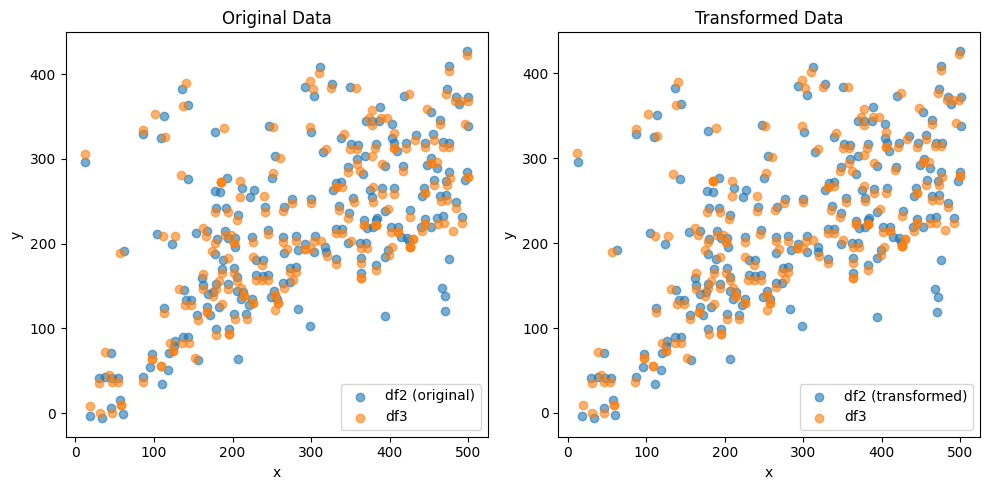

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (150,)
df2 (150, 2)
df3 (150, 2)
Optimal Translation and Rotation Parameters:
Translation: ( -2.855621091446435e-05 , -1.1638036098919653e-05 )
Rotation (radians): 0.00276269742465789
Transform Matrix:
 [[ 9.99996184e-01 -2.76269391e-03 -2.85562109e-05]
 [ 2.76269391e-03  9.99996184e-01 -1.16380361e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


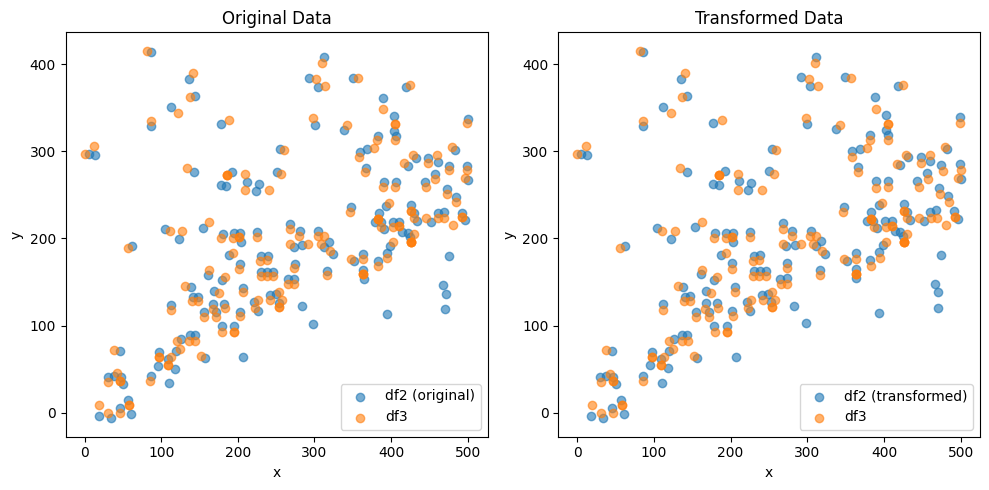

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (225,)
df2 (225, 2)
df3 (225, 2)
Optimal Translation and Rotation Parameters:
Translation: ( -5.8023654053031475e-06 , -1.2772748649925404e-05 )
Rotation (radians): -0.002681094038459602
Transform Matrix:
 [[ 9.99996406e-01  2.68109083e-03 -5.80236541e-06]
 [-2.68109083e-03  9.99996406e-01 -1.27727486e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


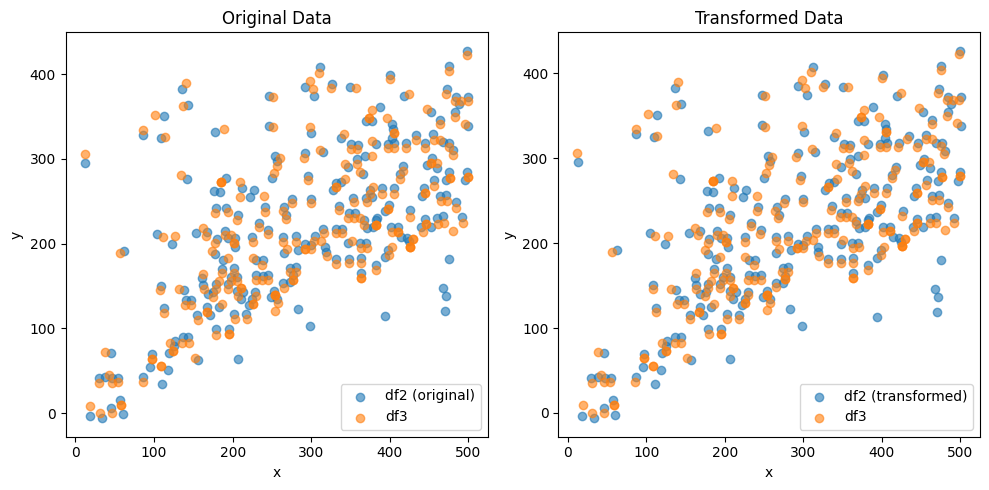

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (153,)
df2 (153, 2)
df3 (153, 2)
Optimal Translation and Rotation Parameters:
Translation: ( -3.494742995395891e-05 , -1.5695123444345333e-05 )
Rotation (radians): 0.0022731596981902485
Transform Matrix:
 [[ 9.99997416e-01 -2.27315774e-03 -3.49474300e-05]
 [ 2.27315774e-03  9.99997416e-01 -1.56951234e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


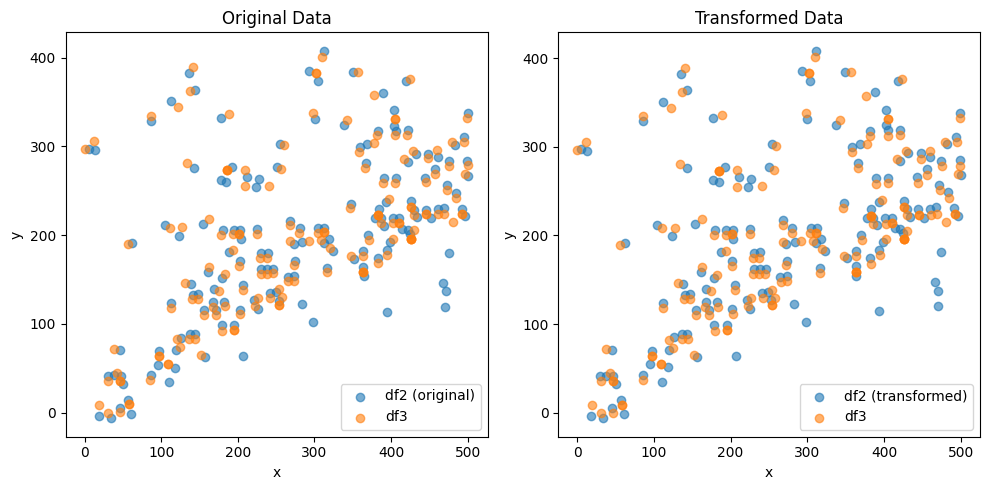

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (207,)
df2 (207, 2)
df3 (207, 2)
Optimal Translation and Rotation Parameters:
Translation: ( -5.108064145506304e-06 , -1.0985877556856847e-05 )
Rotation (radians): -0.0023548160239841853
Transform Matrix:
 [[ 9.99997227e-01  2.35481385e-03 -5.10806415e-06]
 [-2.35481385e-03  9.99997227e-01 -1.09858776e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


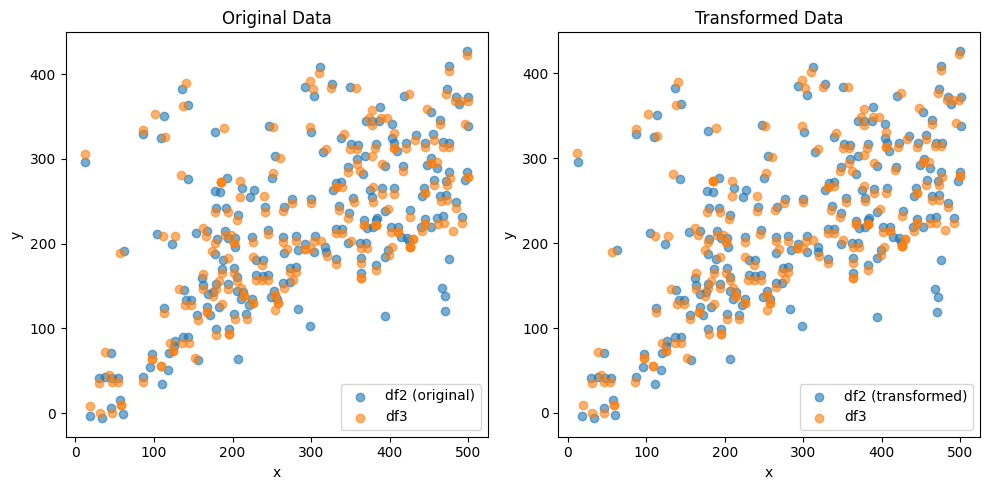

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (150,)
df2 (150, 2)
df3 (150, 2)
Optimal Translation and Rotation Parameters:
Translation: ( -2.839087492840449e-05 , -1.1512622628891901e-05 )
Rotation (radians): 0.0027625832235035792
Transform Matrix:
 [[ 9.99996184e-01 -2.76257971e-03 -2.83908749e-05]
 [ 2.76257971e-03  9.99996184e-01 -1.15126226e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


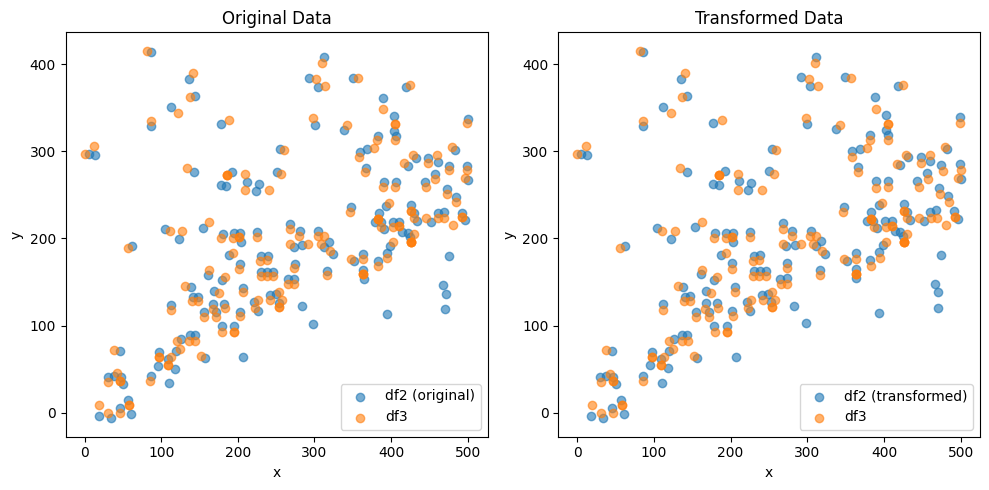

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (225,)
df2 (225, 2)
df3 (225, 2)
Optimal Translation and Rotation Parameters:
Translation: ( -5.76102011116507e-06 , -1.2726562378903676e-05 )
Rotation (radians): -0.002680894625607966
Transform Matrix:
 [[ 9.99996406e-01  2.68089141e-03 -5.76102011e-06]
 [-2.68089141e-03  9.99996406e-01 -1.27265624e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


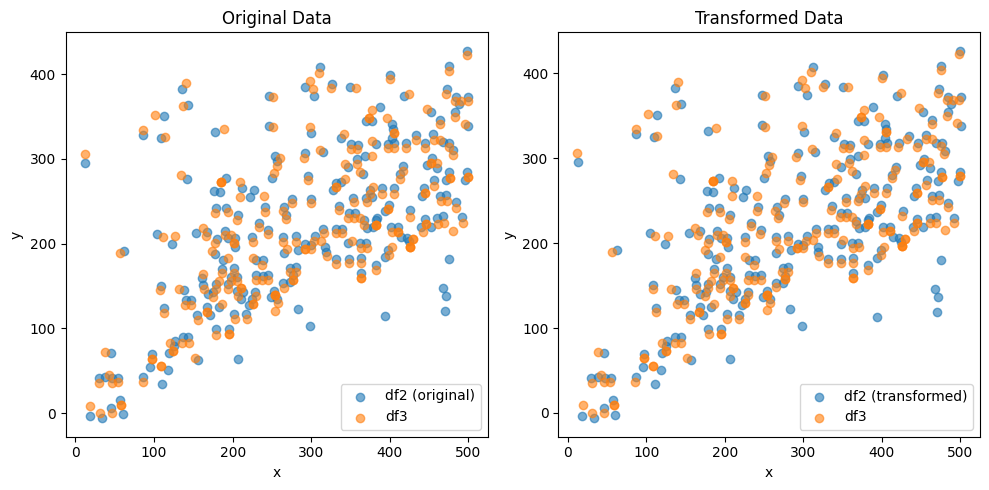

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (153,)
df2 (153, 2)
df3 (153, 2)
Optimal Translation and Rotation Parameters:
Translation: ( -3.484118350161295e-05 , -1.577010047630944e-05 )
Rotation (radians): 0.002273181433957181
Transform Matrix:
 [[ 9.99997416e-01 -2.27317948e-03 -3.48411835e-05]
 [ 2.27317948e-03  9.99997416e-01 -1.57701005e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


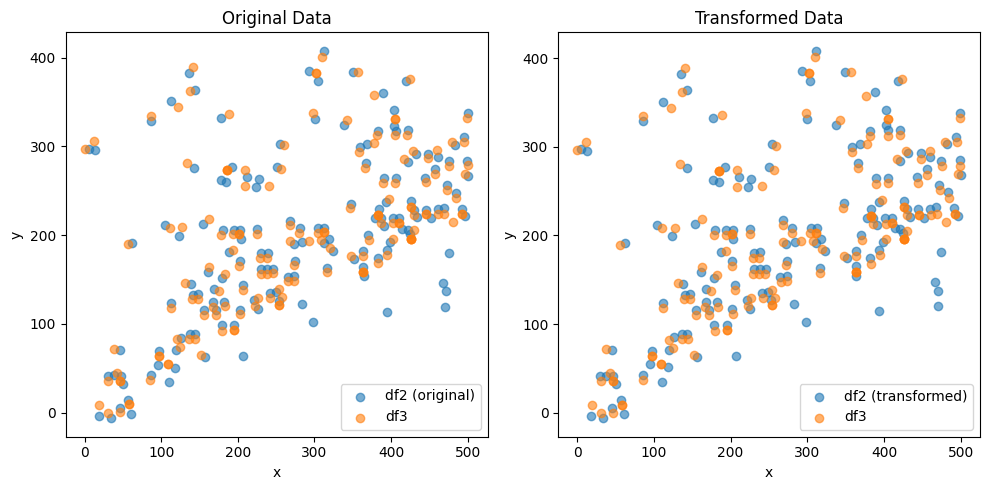

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (207,)
df2 (207, 2)
df3 (207, 2)
Optimal Translation and Rotation Parameters:
Translation: ( -5.148143057692446e-06 , -1.0963331302200233e-05 )
Rotation (radians): -0.0023548813799827623
Transform Matrix:
 [[ 9.99997227e-01  2.35487920e-03 -5.14814306e-06]
 [-2.35487920e-03  9.99997227e-01 -1.09633313e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


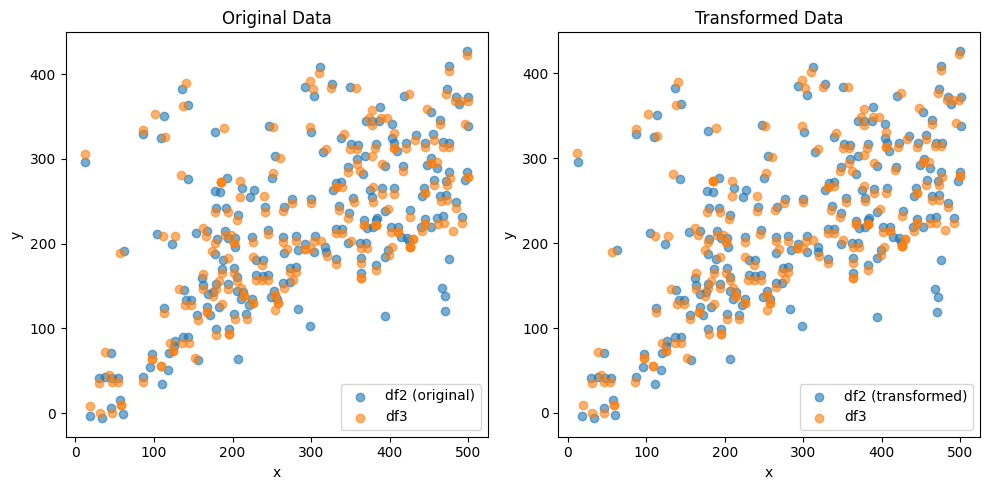

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (150,)
df2 (150, 2)
df3 (150, 2)
Optimal Translation and Rotation Parameters:
Translation: ( -3.050793751215177e-05 , -1.3303901379734377e-05 )
Rotation (radians): 0.00260791199044587
Transform Matrix:
 [[ 9.99996599e-01 -2.60790903e-03 -3.05079375e-05]
 [ 2.60790903e-03  9.99996599e-01 -1.33039014e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


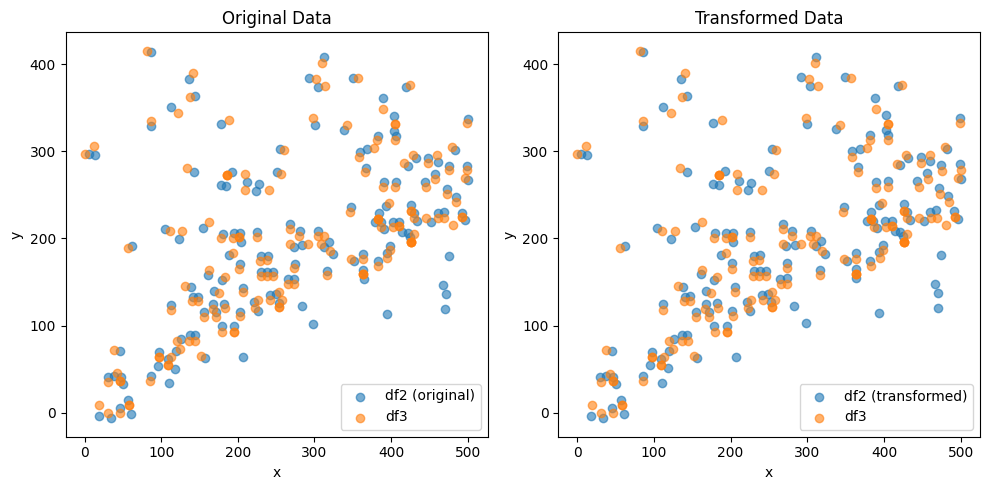

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (221,)
df2 (221, 2)
df3 (221, 2)
Optimal Translation and Rotation Parameters:
Translation: ( -6.073821201539725e-06 , -1.2743000522272455e-05 )
Rotation (radians): -0.0025334587282301
Transform Matrix:
 [[ 9.99996791e-01  2.53345602e-03 -6.07382120e-06]
 [-2.53345602e-03  9.99996791e-01 -1.27430005e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


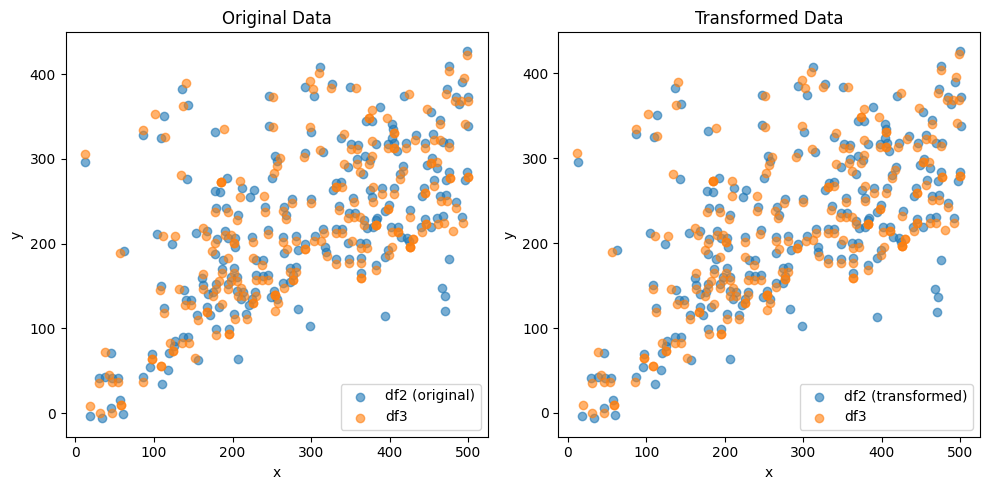

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (154,)
df2 (154, 2)
df3 (154, 2)
Optimal Translation and Rotation Parameters:
Translation: ( -3.410249782256406e-05 , -1.491742082625028e-05 )
Rotation (radians): 0.0022778002607969274
Transform Matrix:
 [[ 9.99997406e-01 -2.27779829e-03 -3.41024978e-05]
 [ 2.27779829e-03  9.99997406e-01 -1.49174208e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


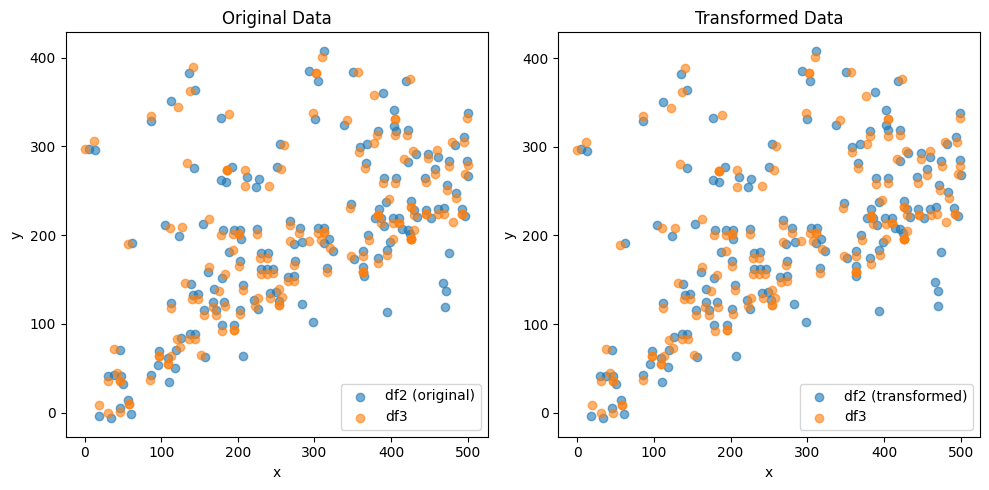

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (207,)
df2 (207, 2)
df3 (207, 2)
Optimal Translation and Rotation Parameters:
Translation: ( -5.137939522078244e-06 , -1.0940496040280701e-05 )
Rotation (radians): -0.002352269104415785
Transform Matrix:
 [[ 9.99997233e-01  2.35226694e-03 -5.13793952e-06]
 [-2.35226694e-03  9.99997233e-01 -1.09404960e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


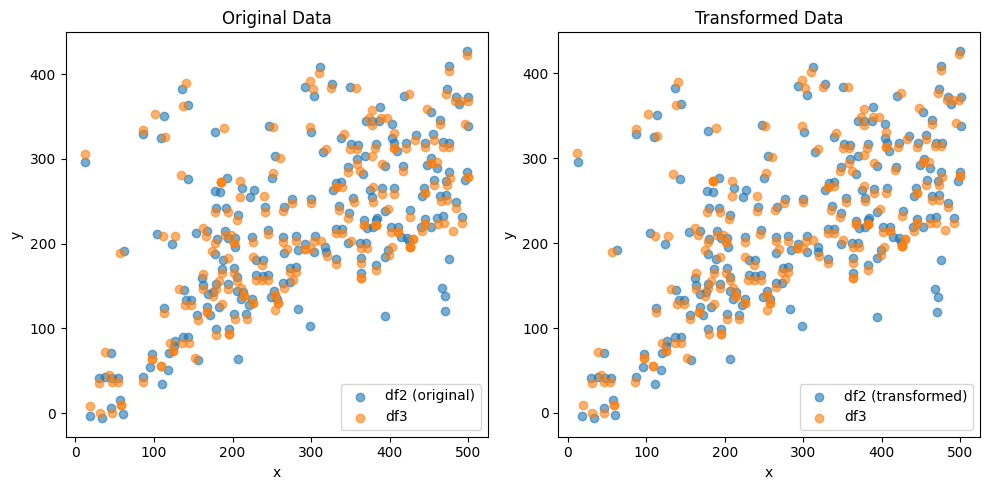

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (150,)
df2 (150, 2)
df3 (150, 2)
Optimal Translation and Rotation Parameters:
Translation: ( -3.0576063622473216e-05 , -1.3294083420672874e-05 )
Rotation (radians): 0.002607778152829484
Transform Matrix:
 [[ 9.99996600e-01 -2.60777520e-03 -3.05760636e-05]
 [ 2.60777520e-03  9.99996600e-01 -1.32940834e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


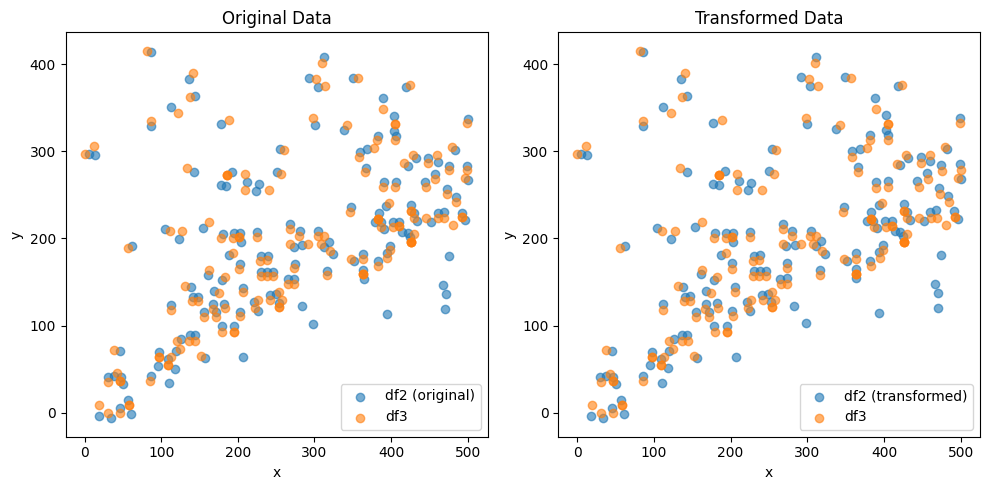

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (221,)
df2 (221, 2)
df3 (221, 2)
Optimal Translation and Rotation Parameters:
Translation: ( -6.131485017546224e-06 , -1.2777004432856703e-05 )
Rotation (radians): -0.0025333259724776686
Transform Matrix:
 [[ 9.99996791e-01  2.53332326e-03 -6.13148502e-06]
 [-2.53332326e-03  9.99996791e-01 -1.27770044e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


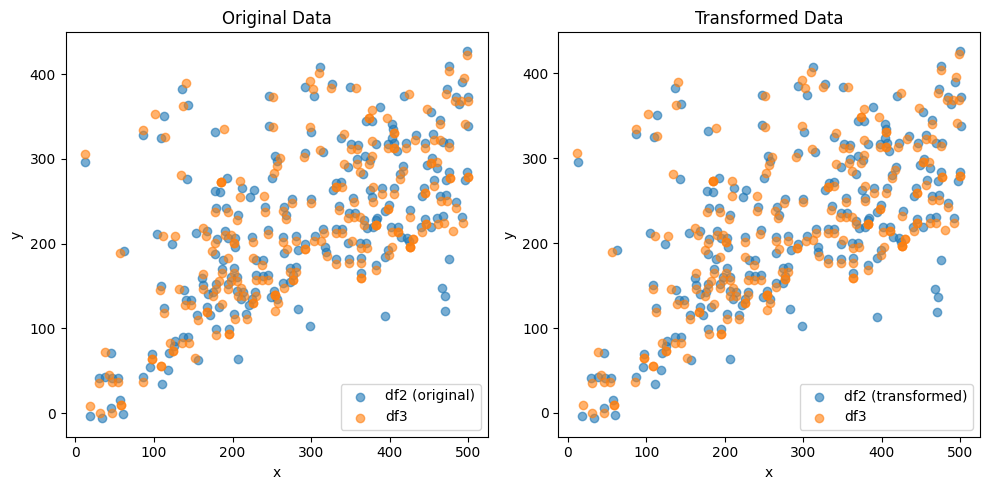

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (154,)
df2 (154, 2)
df3 (154, 2)
Optimal Translation and Rotation Parameters:
Translation: ( -3.422501431327808e-05 , -1.5095772238843815e-05 )
Rotation (radians): 0.002277633442696669
Transform Matrix:
 [[ 9.99997406e-01 -2.27763147e-03 -3.42250143e-05]
 [ 2.27763147e-03  9.99997406e-01 -1.50957722e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


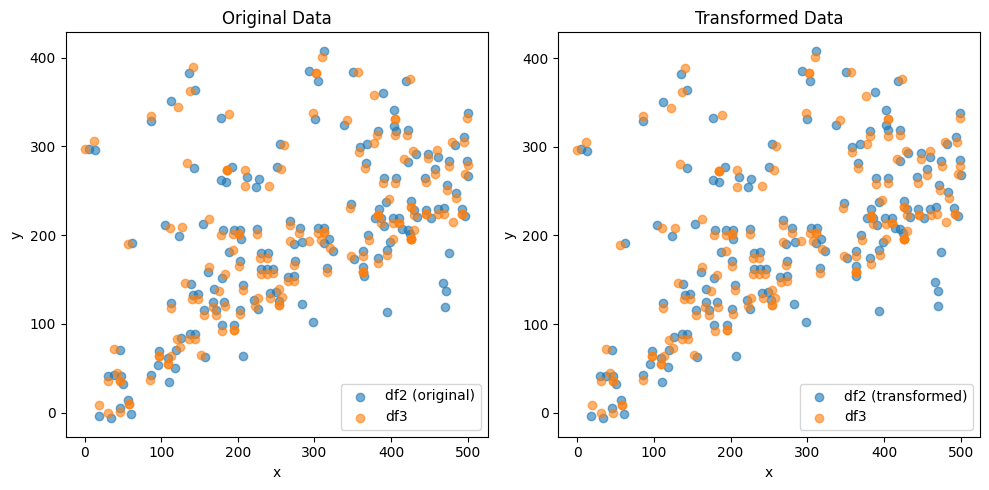

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (207,)
df2 (207, 2)
df3 (207, 2)
Optimal Translation and Rotation Parameters:
Translation: ( -5.115300867470915e-06 , -1.0979981930548254e-05 )
Rotation (radians): -0.002352098131600842
Transform Matrix:
 [[ 9.99997234e-01  2.35209596e-03 -5.11530087e-06]
 [-2.35209596e-03  9.99997234e-01 -1.09799819e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


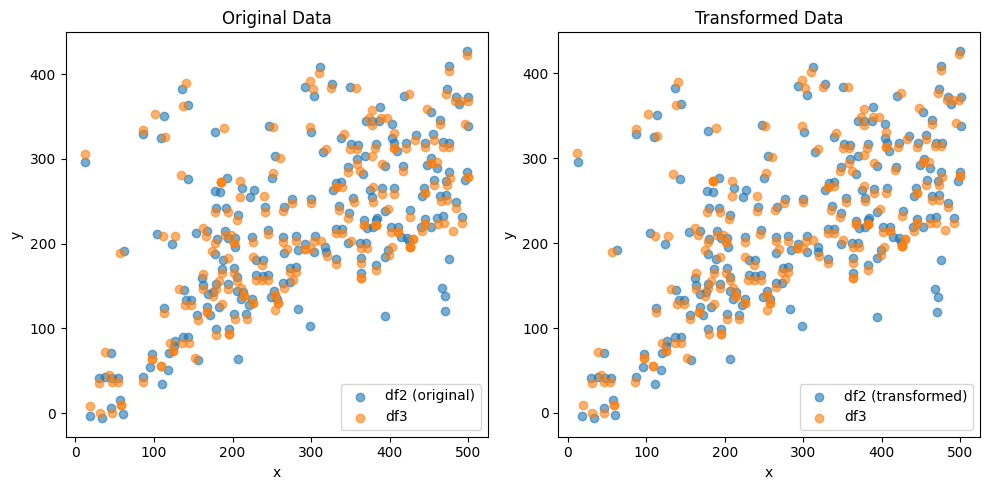

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (150,)
df2 (150, 2)
df3 (150, 2)
Optimal Translation and Rotation Parameters:
Translation: ( -3.0448989961458736e-05 , -1.3279763734245487e-05 )
Rotation (radians): 0.0026078532613399256
Transform Matrix:
 [[ 9.99996600e-01 -2.60785031e-03 -3.04489900e-05]
 [ 2.60785031e-03  9.99996600e-01 -1.32797637e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


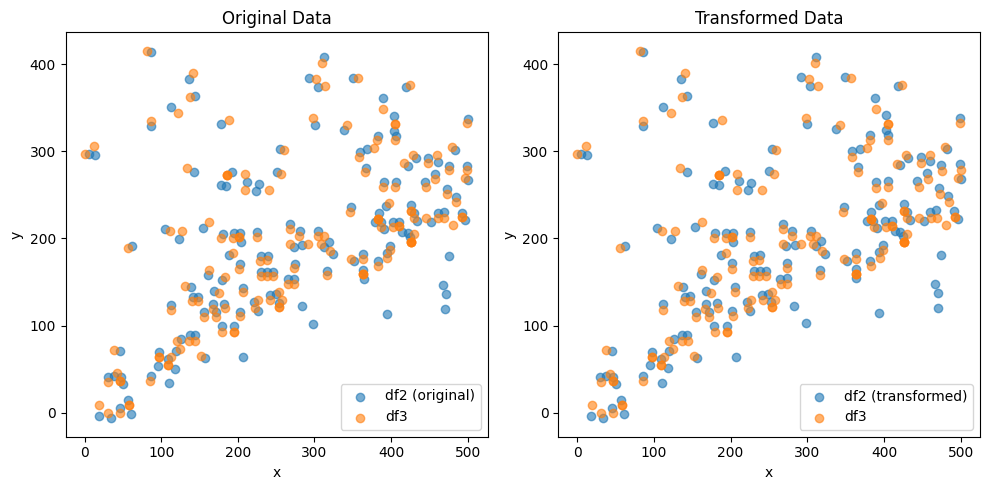

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (221,)
df2 (221, 2)
df3 (221, 2)
Optimal Translation and Rotation Parameters:
Translation: ( -6.036222051244742e-06 , -1.2704567757269247e-05 )
Rotation (radians): -0.002533393166486039
Transform Matrix:
 [[ 9.99996791e-01  2.53339046e-03 -6.03622205e-06]
 [-2.53339046e-03  9.99996791e-01 -1.27045678e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


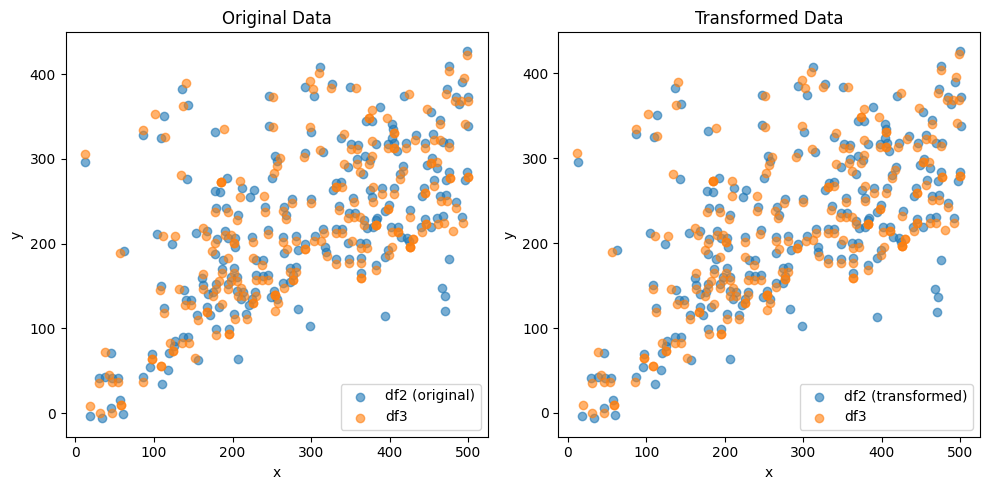

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (154,)
df2 (154, 2)
df3 (154, 2)
Optimal Translation and Rotation Parameters:
Translation: ( -3.4045135030514314e-05 , -1.4988662513637329e-05 )
Rotation (radians): 0.002277631592941096
Transform Matrix:
 [[ 9.99997406e-01 -2.27762962e-03 -3.40451350e-05]
 [ 2.27762962e-03  9.99997406e-01 -1.49886625e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


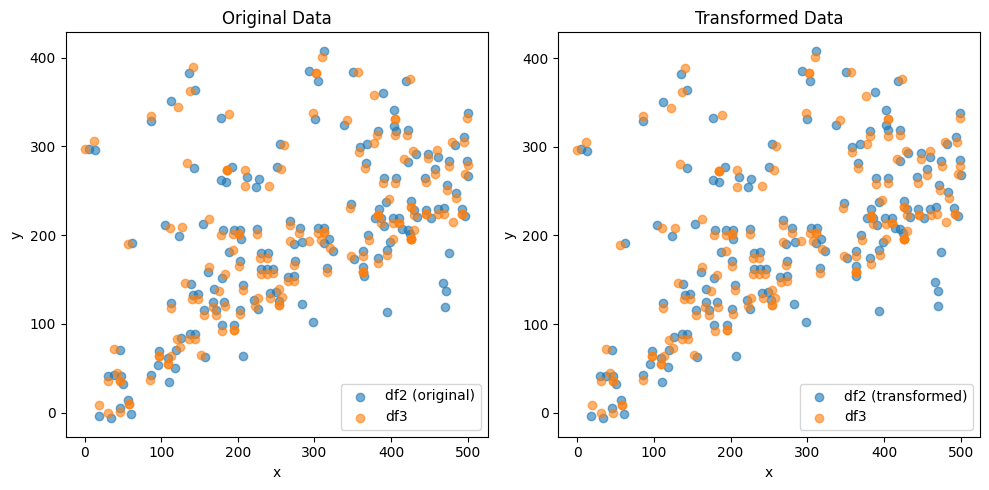

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (207,)
df2 (207, 2)
df3 (207, 2)
Optimal Translation and Rotation Parameters:
Translation: ( -5.105672736283209e-06 , -1.0966197850876283e-05 )
Rotation (radians): -0.0023520882851325747
Transform Matrix:
 [[ 9.99997234e-01  2.35208612e-03 -5.10567274e-06]
 [-2.35208612e-03  9.99997234e-01 -1.09661979e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


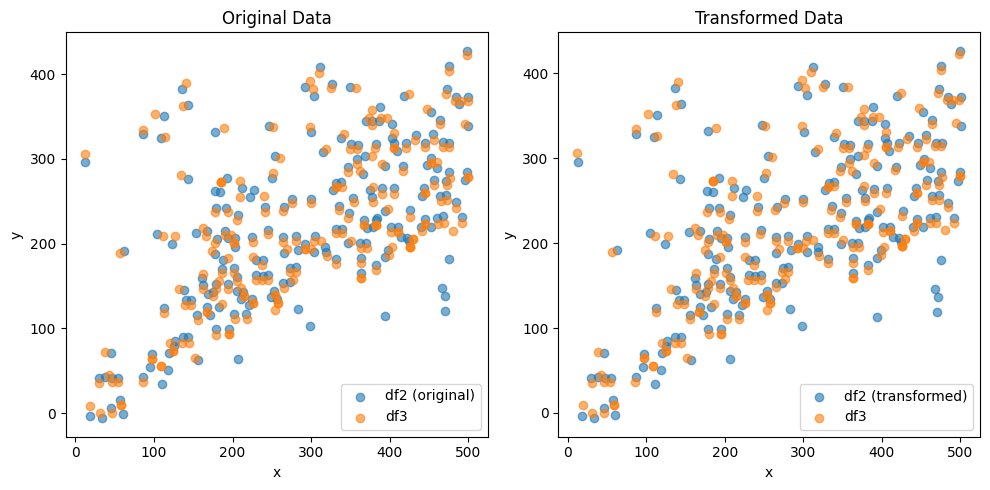

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (150,)
df2 (150, 2)
df3 (150, 2)
Optimal Translation and Rotation Parameters:
Translation: ( -3.0581497120539934e-05 , -1.3503965879266104e-05 )
Rotation (radians): 0.002607750270128023
Transform Matrix:
 [[ 9.99996600e-01 -2.60774731e-03 -3.05814971e-05]
 [ 2.60774731e-03  9.99996600e-01 -1.35039659e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


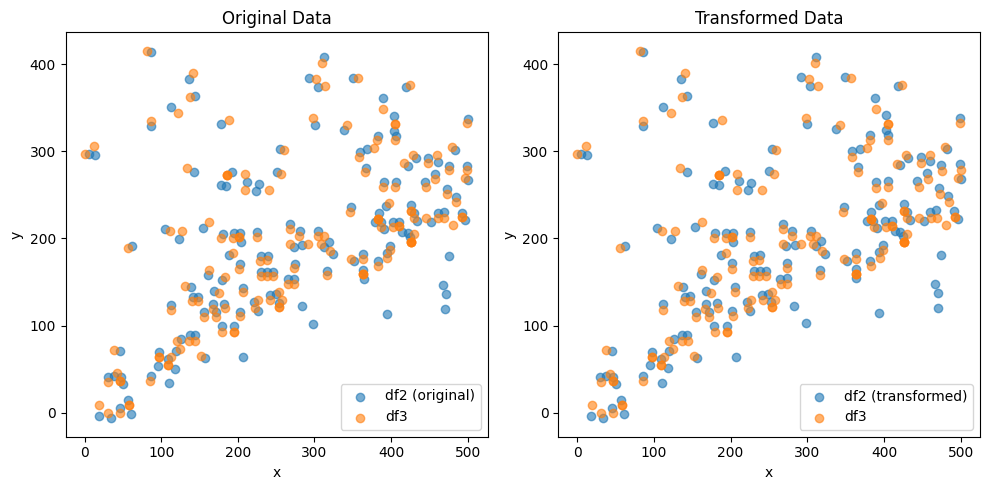

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (221,)
df2 (221, 2)
df3 (221, 2)
Optimal Translation and Rotation Parameters:
Translation: ( -6.1127079857816644e-06 , -1.27734543801394e-05 )
Rotation (radians): -0.0025333101951689075
Transform Matrix:
 [[ 9.99996791e-01  2.53330749e-03 -6.11270799e-06]
 [-2.53330749e-03  9.99996791e-01 -1.27734544e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


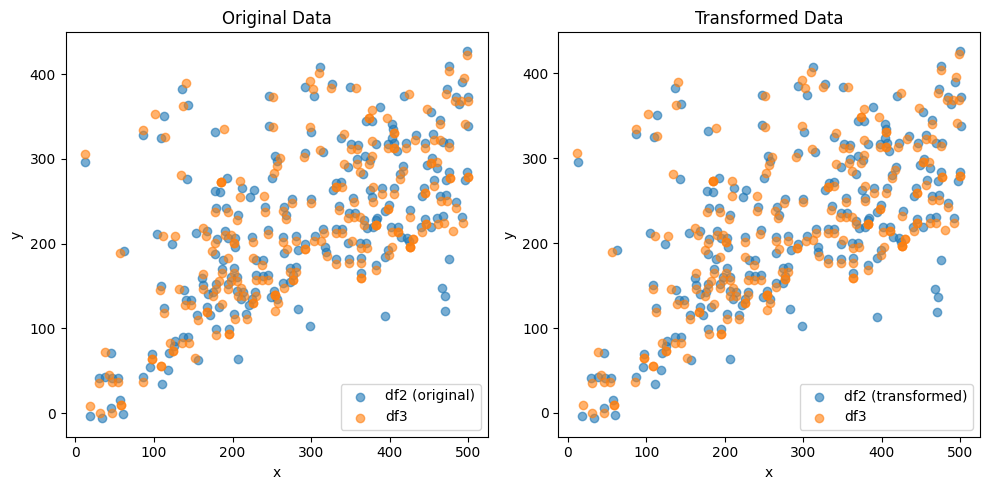

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (154,)
df2 (154, 2)
df3 (154, 2)
Optimal Translation and Rotation Parameters:
Translation: ( -3.41290736707584e-05 , -1.501097461102876e-05 )
Rotation (radians): 0.002277799852120206
Transform Matrix:
 [[ 9.99997406e-01 -2.27779788e-03 -3.41290737e-05]
 [ 2.27779788e-03  9.99997406e-01 -1.50109746e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


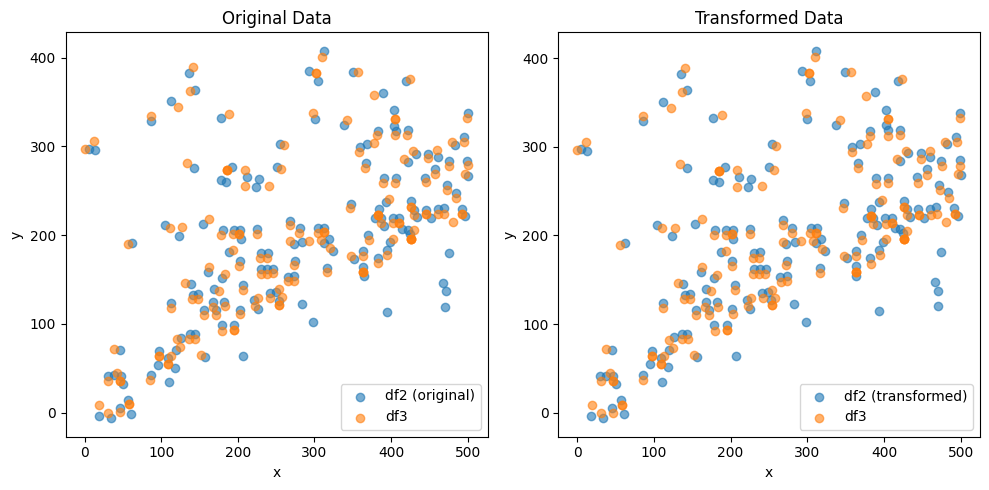

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (207,)
df2 (207, 2)
df3 (207, 2)
Optimal Translation and Rotation Parameters:
Translation: ( -5.13188314359113e-06 , -1.0921060323673126e-05 )
Rotation (radians): -0.002352255310368904
Transform Matrix:
 [[ 9.99997233e-01  2.35225314e-03 -5.13188314e-06]
 [-2.35225314e-03  9.99997233e-01 -1.09210603e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


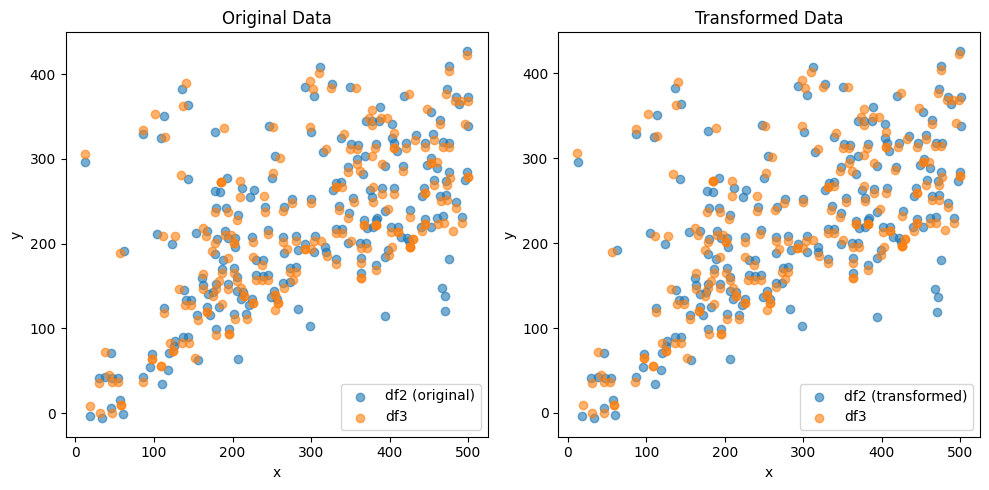

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (150,)
df2 (150, 2)
df3 (150, 2)
Optimal Translation and Rotation Parameters:
Translation: ( -3.05640372700331e-05 , -1.337158937032111e-05 )
Rotation (radians): 0.002607759026948202
Transform Matrix:
 [[ 9.99996600e-01 -2.60775607e-03 -3.05640373e-05]
 [ 2.60775607e-03  9.99996600e-01 -1.33715894e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


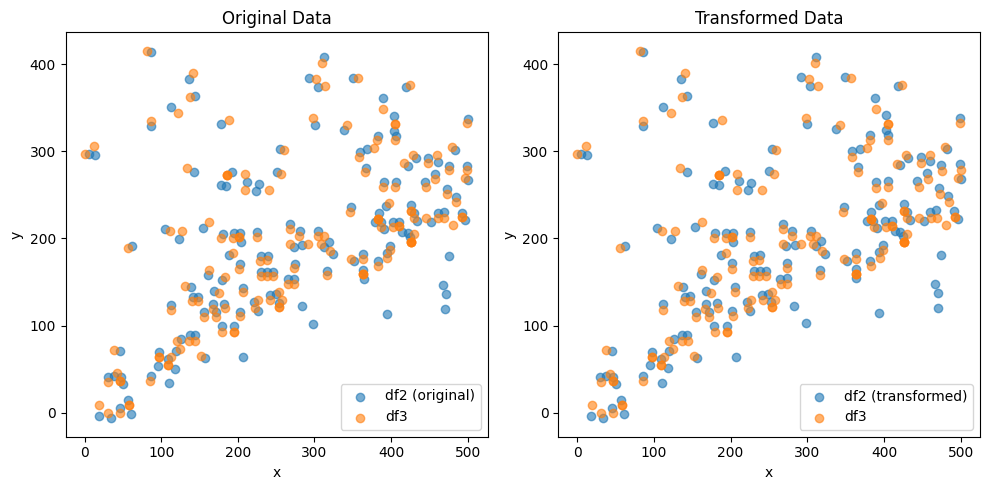

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (221,)
df2 (221, 2)
df3 (221, 2)
Optimal Translation and Rotation Parameters:
Translation: ( -6.132012543202444e-06 , -1.277993521039291e-05 )
Rotation (radians): -0.0025333124969783957
Transform Matrix:
 [[ 9.99996791e-01  2.53330979e-03 -6.13201254e-06]
 [-2.53330979e-03  9.99996791e-01 -1.27799352e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


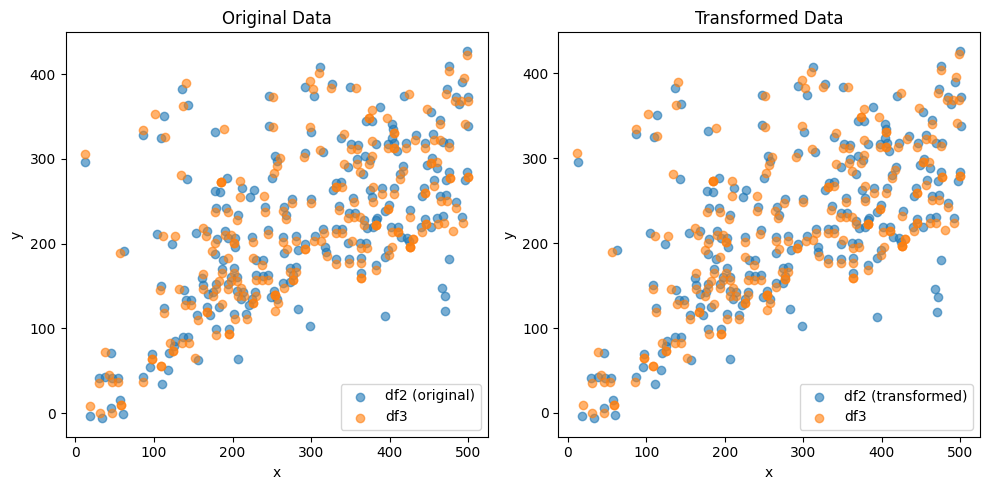

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (154,)
df2 (154, 2)
df3 (154, 2)
Optimal Translation and Rotation Parameters:
Translation: ( -3.402340157834181e-05 , -1.4825160539830064e-05 )
Rotation (radians): 0.0022777871411581055
Transform Matrix:
 [[ 9.99997406e-01 -2.27778517e-03 -3.40234016e-05]
 [ 2.27778517e-03  9.99997406e-01 -1.48251605e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


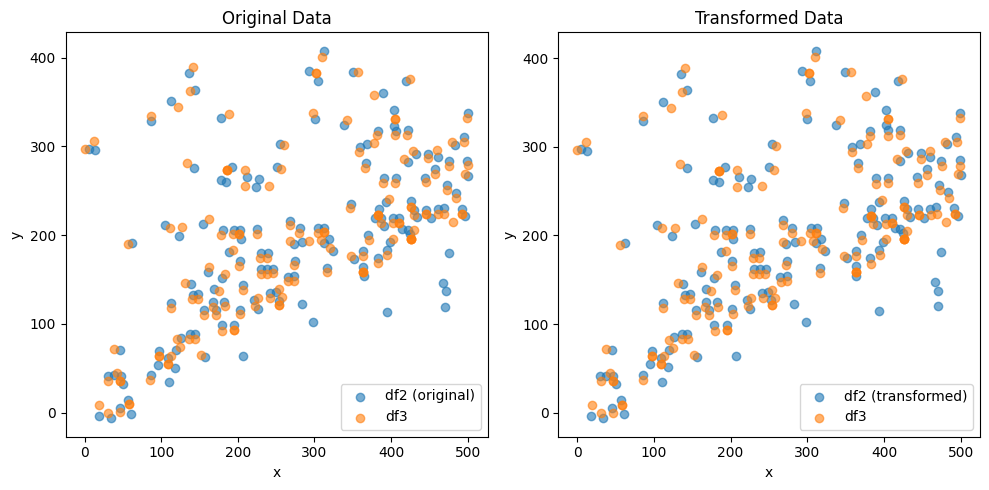

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (207,)
df2 (207, 2)
df3 (207, 2)
Optimal Translation and Rotation Parameters:
Translation: ( -5.137065535370047e-06 , -1.0983326272301006e-05 )
Rotation (radians): -0.002352265556891716
Transform Matrix:
 [[ 9.99997233e-01  2.35226339e-03 -5.13706554e-06]
 [-2.35226339e-03  9.99997233e-01 -1.09833263e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


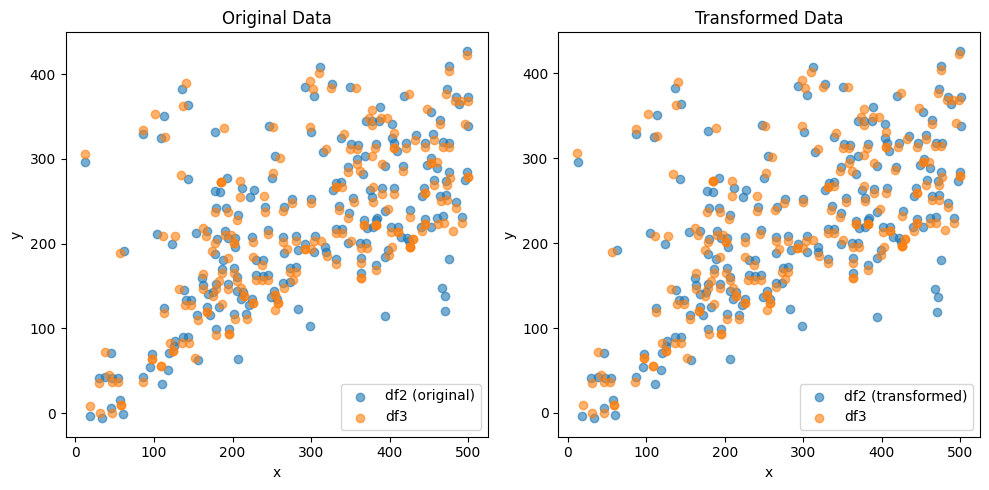

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (150,)
df2 (150, 2)
df3 (150, 2)
Optimal Translation and Rotation Parameters:
Translation: ( -3.046720451818646e-05 , -1.3429168426723616e-05 )
Rotation (radians): 0.002608021323619588
Transform Matrix:
 [[ 9.99996599e-01 -2.60801837e-03 -3.04672045e-05]
 [ 2.60801837e-03  9.99996599e-01 -1.34291684e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


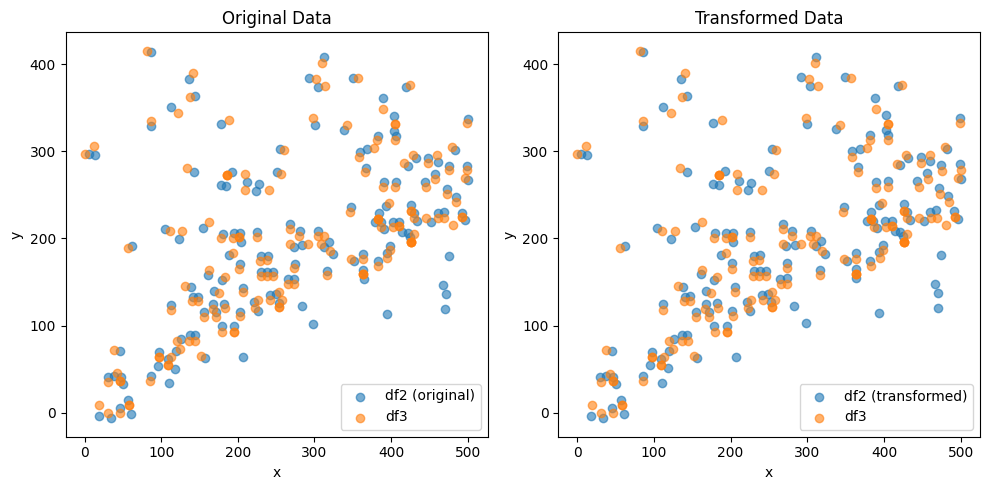

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (221,)
df2 (221, 2)
df3 (221, 2)
Optimal Translation and Rotation Parameters:
Translation: ( -6.116433843498021e-06 , -1.2795261053921326e-05 )
Rotation (radians): -0.002533597993943405
Transform Matrix:
 [[ 9.99996790e-01  2.53359528e-03 -6.11643384e-06]
 [-2.53359528e-03  9.99996790e-01 -1.27952611e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


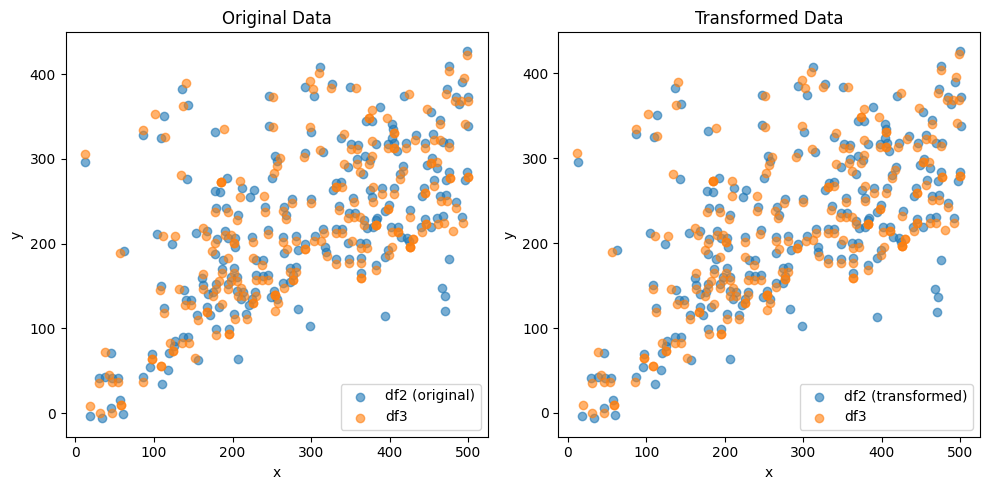

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (154,)
df2 (154, 2)
df3 (154, 2)
Optimal Translation and Rotation Parameters:
Translation: ( -3.404561422782264e-05 , -1.491172379496759e-05 )
Rotation (radians): 0.0022777955774880886
Transform Matrix:
 [[ 9.99997406e-01 -2.27779361e-03 -3.40456142e-05]
 [ 2.27779361e-03  9.99997406e-01 -1.49117238e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


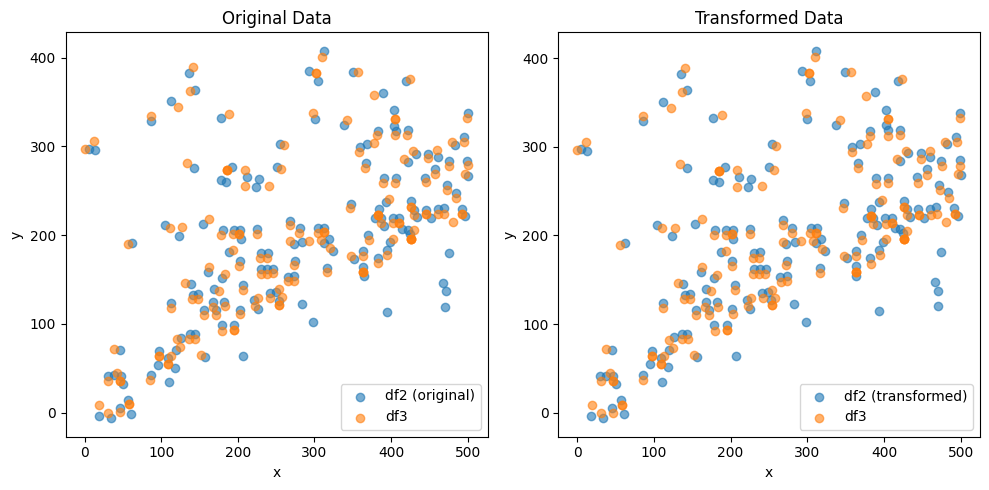

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (207,)
df2 (207, 2)
df3 (207, 2)
Optimal Translation and Rotation Parameters:
Translation: ( -5.097281015007878e-06 , -1.0958098733558227e-05 )
Rotation (radians): -0.0023522322125553853
Transform Matrix:
 [[ 9.99997234e-01  2.35223004e-03 -5.09728102e-06]
 [-2.35223004e-03  9.99997234e-01 -1.09580987e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


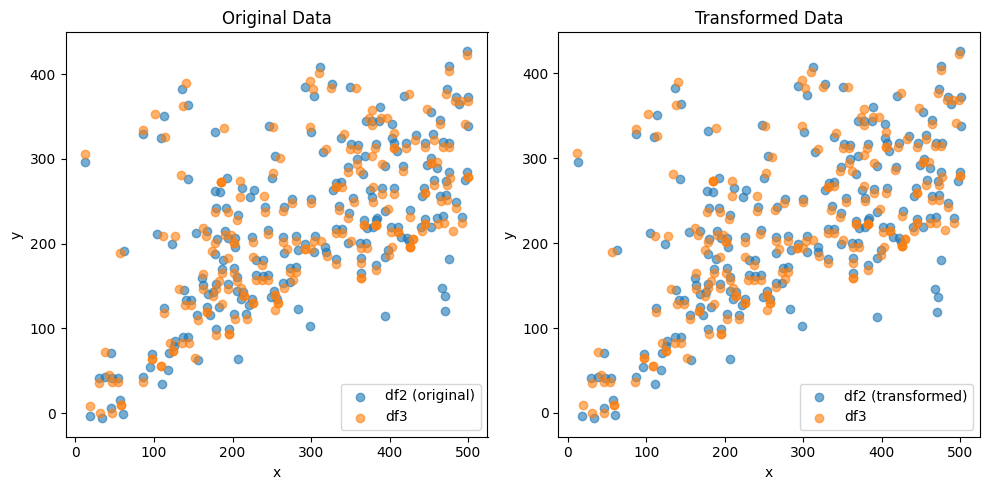

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (150,)
df2 (150, 2)
df3 (150, 2)
Optimal Translation and Rotation Parameters:
Translation: ( -3.044509108471638e-05 , -1.3292002981133773e-05 )
Rotation (radians): 0.002608014220515956
Transform Matrix:
 [[ 9.99996599e-01 -2.60801126e-03 -3.04450911e-05]
 [ 2.60801126e-03  9.99996599e-01 -1.32920030e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


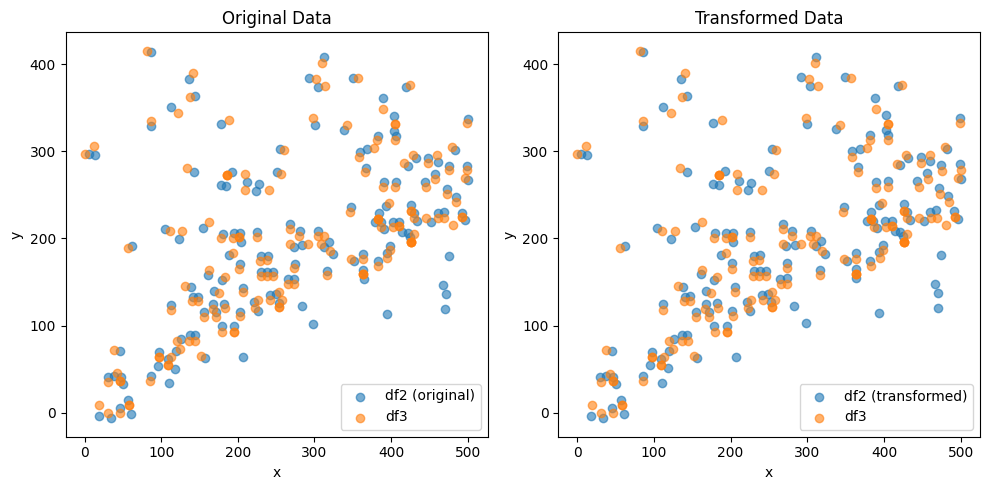

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (221,)
df2 (221, 2)
df3 (221, 2)
Optimal Translation and Rotation Parameters:
Translation: ( -6.106781085555551e-06 , -1.2774363642872303e-05 )
Rotation (radians): -0.002533591644393104
Transform Matrix:
 [[ 9.99996790e-01  2.53358893e-03 -6.10678109e-06]
 [-2.53358893e-03  9.99996790e-01 -1.27743636e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


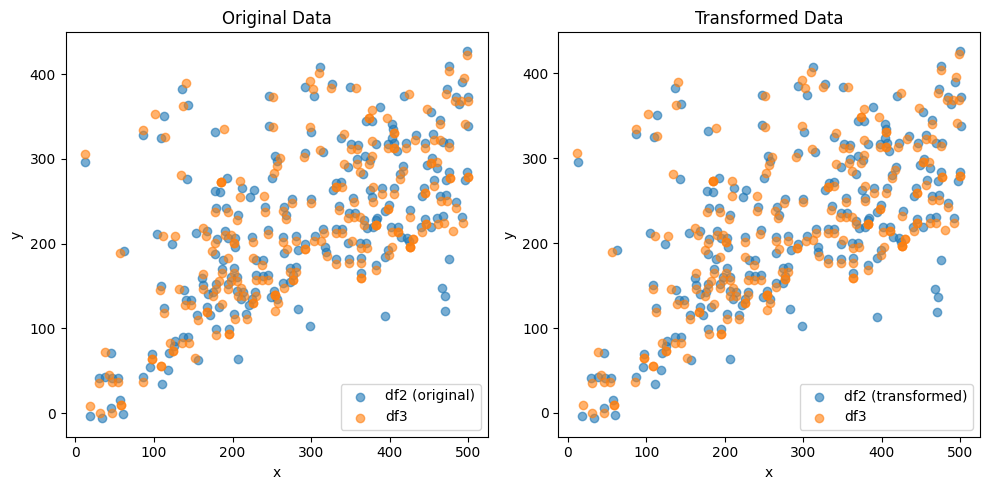

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (154,)
df2 (154, 2)
df3 (154, 2)
Optimal Translation and Rotation Parameters:
Translation: ( -3.408145736036528e-05 , -1.4900531726356098e-05 )
Rotation (radians): 0.0022777095381877055
Transform Matrix:
 [[ 9.99997406e-01 -2.27770757e-03 -3.40814574e-05]
 [ 2.27770757e-03  9.99997406e-01 -1.49005317e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


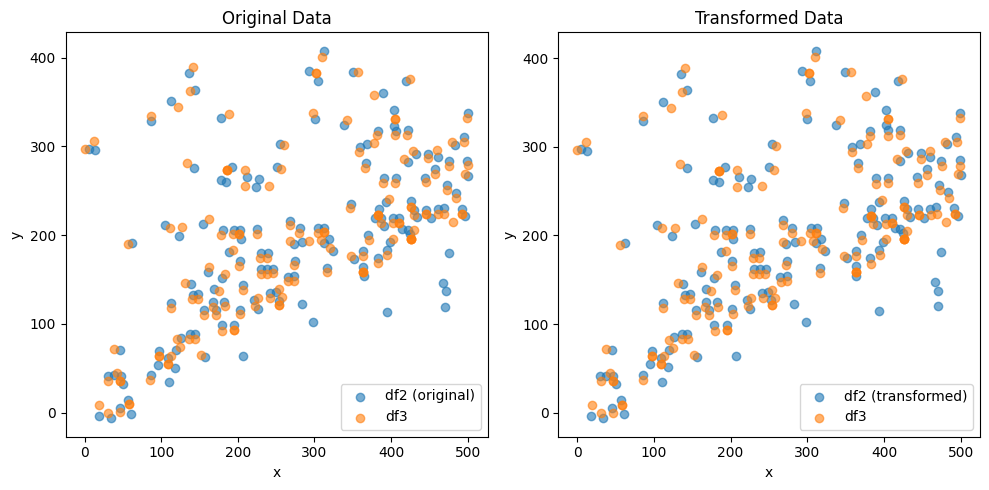

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (207,)
df2 (207, 2)
df3 (207, 2)
Optimal Translation and Rotation Parameters:
Translation: ( -5.1140796310513524e-06 , -1.098109235733934e-05 )
Rotation (radians): -0.0023521342984693205
Transform Matrix:
 [[ 9.99997234e-01  2.35213213e-03 -5.11407963e-06]
 [-2.35213213e-03  9.99997234e-01 -1.09810924e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


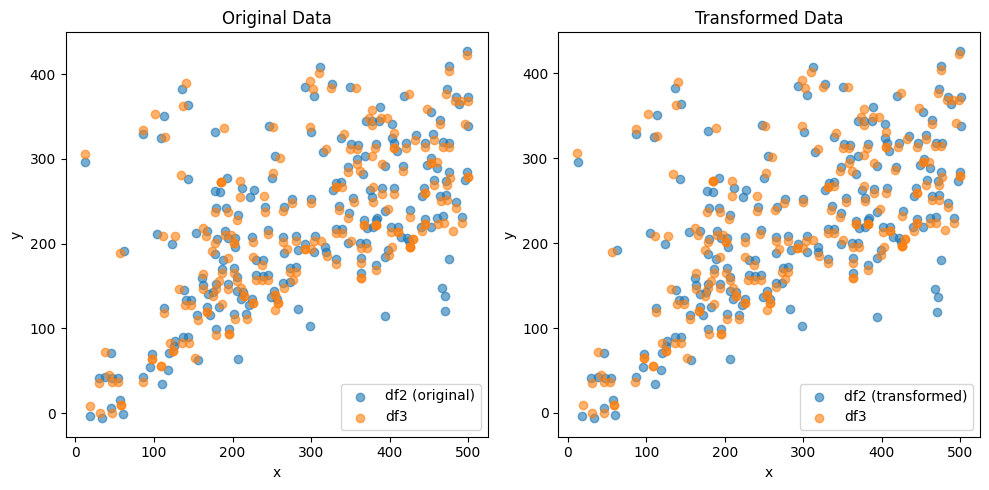

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (150,)
df2 (150, 2)
df3 (150, 2)
Optimal Translation and Rotation Parameters:
Translation: ( -3.0571741046923765e-05 , -1.3483818663070671e-05 )
Rotation (radians): 0.002607837367619548
Transform Matrix:
 [[ 9.99996600e-01 -2.60783441e-03 -3.05717410e-05]
 [ 2.60783441e-03  9.99996600e-01 -1.34838187e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


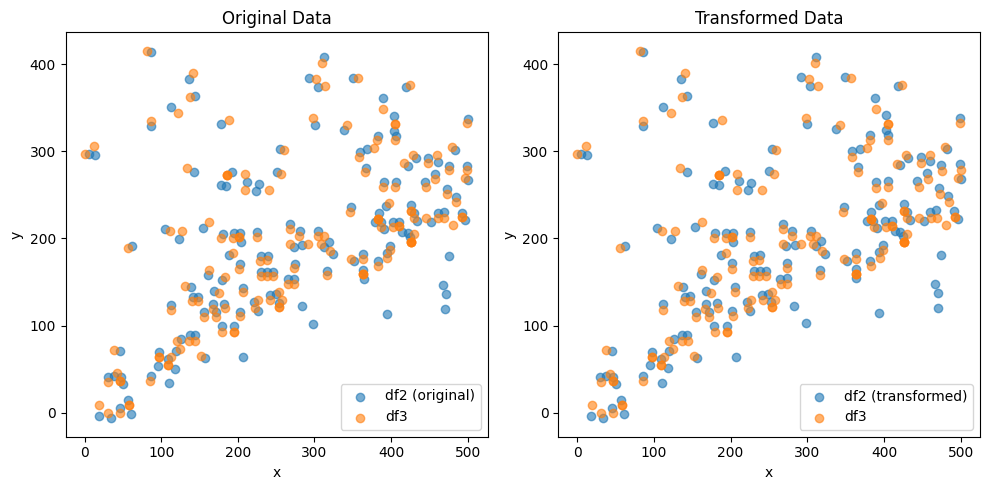

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (221,)
df2 (221, 2)
df3 (221, 2)
Optimal Translation and Rotation Parameters:
Translation: ( -6.134375173340195e-06 , -1.2763556388095982e-05 )
Rotation (radians): -0.0025334028350182895
Transform Matrix:
 [[ 9.99996791e-01  2.53340013e-03 -6.13437517e-06]
 [-2.53340013e-03  9.99996791e-01 -1.27635564e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


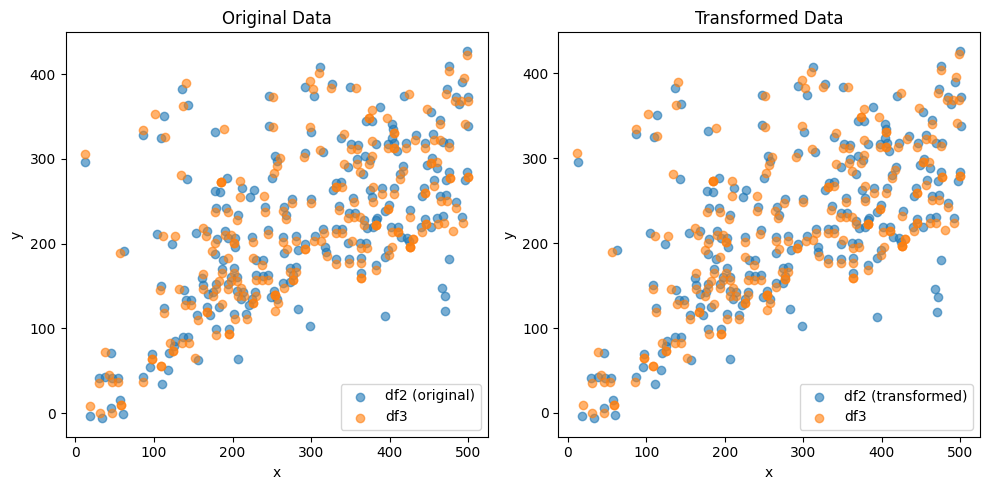

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (154,)
df2 (154, 2)
df3 (154, 2)
Optimal Translation and Rotation Parameters:
Translation: ( -3.420558319713201e-05 , -1.4953181812289434e-05 )
Rotation (radians): 0.0022776869048997386
Transform Matrix:
 [[ 9.99997406e-01 -2.27768494e-03 -3.42055832e-05]
 [ 2.27768494e-03  9.99997406e-01 -1.49531818e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


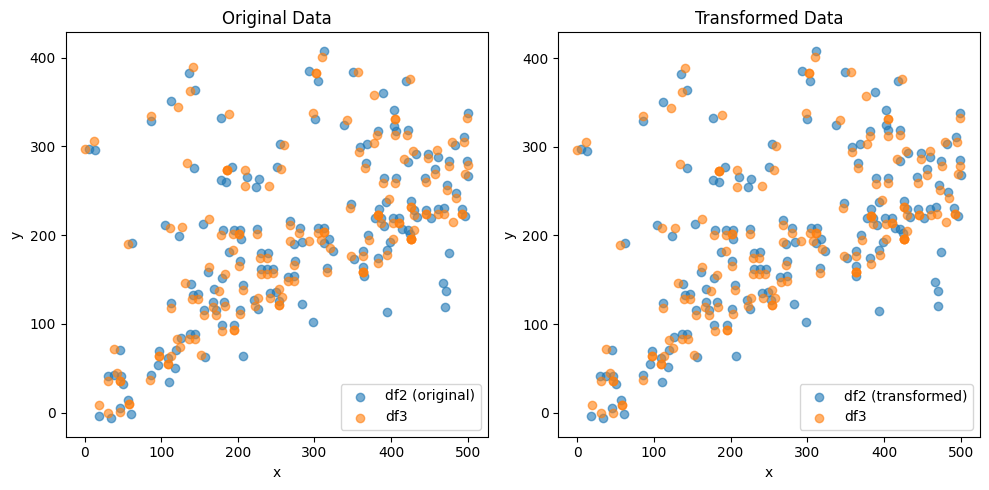

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (207,)
df2 (207, 2)
df3 (207, 2)
Optimal Translation and Rotation Parameters:
Translation: ( -5.115507868583118e-06 , -1.0914260339222935e-05 )
Rotation (radians): -0.002352134866341346
Transform Matrix:
 [[ 9.99997234e-01  2.35213270e-03 -5.11550787e-06]
 [-2.35213270e-03  9.99997234e-01 -1.09142603e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


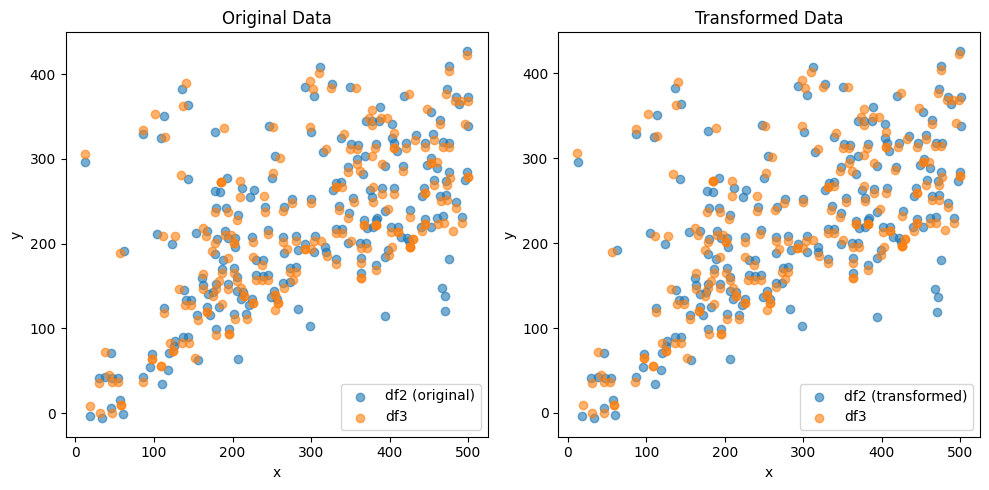

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (150,)
df2 (150, 2)
df3 (150, 2)
Optimal Translation and Rotation Parameters:
Translation: ( -3.038627930922467e-05 , -1.3313104182620372e-05 )
Rotation (radians): 0.0026079420970728084
Transform Matrix:
 [[ 9.99996599e-01 -2.60793914e-03 -3.03862793e-05]
 [ 2.60793914e-03  9.99996599e-01 -1.33131042e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


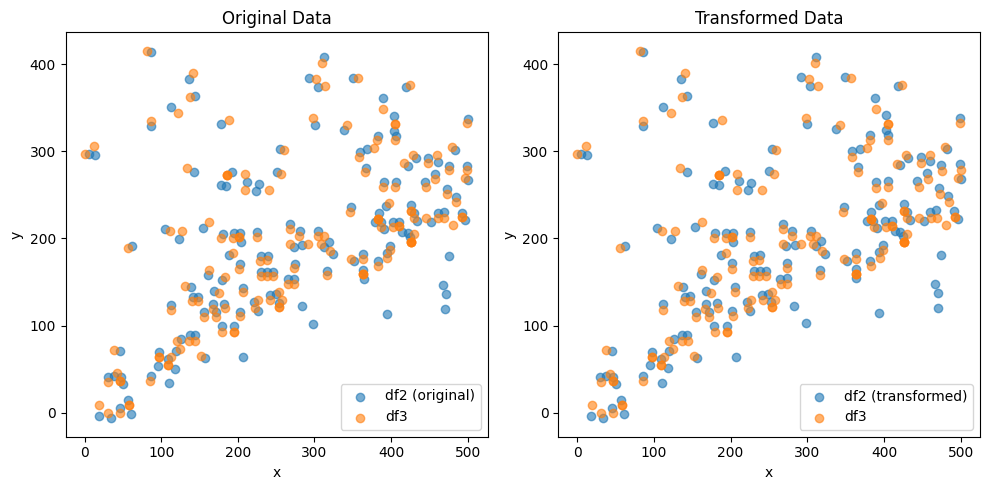

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (221,)
df2 (221, 2)
df3 (221, 2)
Optimal Translation and Rotation Parameters:
Translation: ( -6.059305881743992e-06 , -1.2697425877529816e-05 )
Rotation (radians): -0.0025334994118024682
Transform Matrix:
 [[ 9.99996791e-01  2.53349670e-03 -6.05930588e-06]
 [-2.53349670e-03  9.99996791e-01 -1.26974259e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


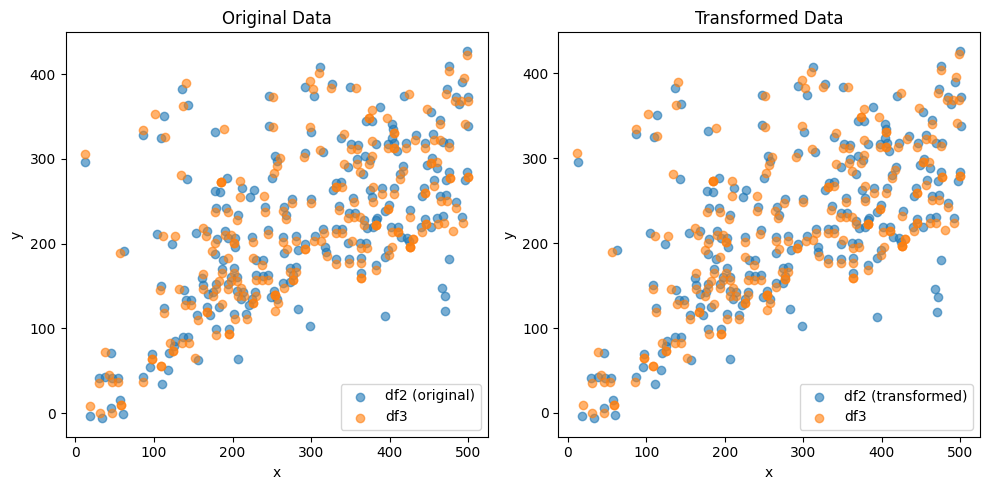

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (154,)
df2 (154, 2)
df3 (154, 2)
Optimal Translation and Rotation Parameters:
Translation: ( -3.408078855068102e-05 , -1.5006530572547975e-05 )
Rotation (radians): 0.0022777783366300553
Transform Matrix:
 [[ 9.99997406e-01 -2.27777637e-03 -3.40807886e-05]
 [ 2.27777637e-03  9.99997406e-01 -1.50065306e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


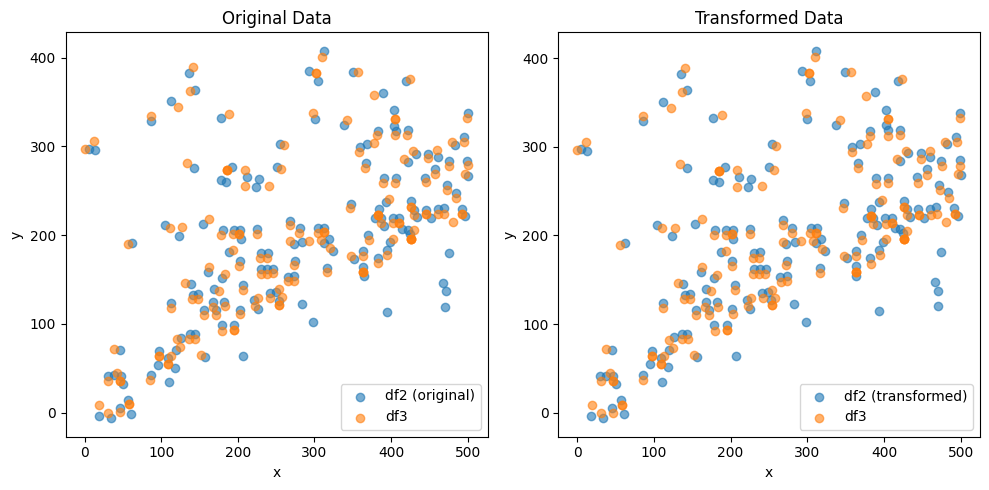

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (207,)
df2 (207, 2)
df3 (207, 2)
Optimal Translation and Rotation Parameters:
Translation: ( -5.08438427653609e-06 , -1.091195557115151e-05 )
Rotation (radians): -0.0023522487580969315
Transform Matrix:
 [[ 9.99997233e-01  2.35224659e-03 -5.08438428e-06]
 [-2.35224659e-03  9.99997233e-01 -1.09119556e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


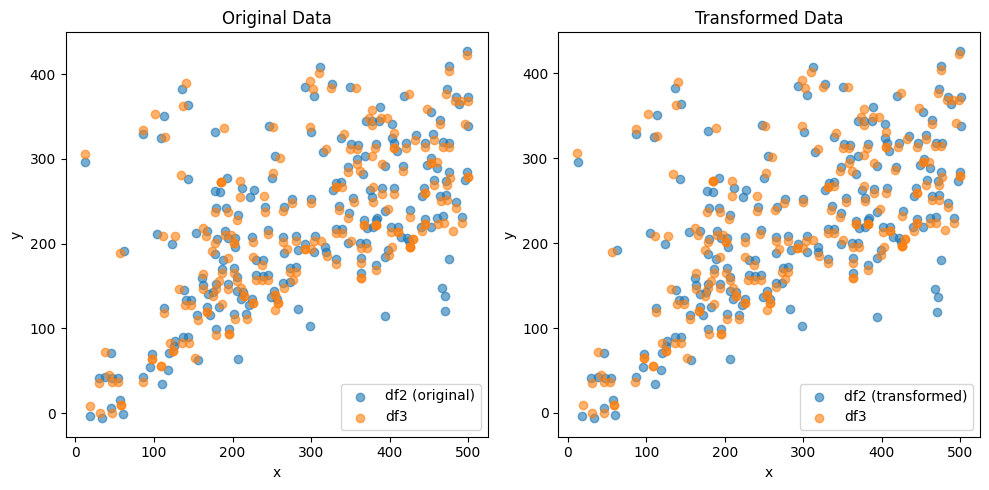

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (150,)
df2 (150, 2)
df3 (150, 2)
Optimal Translation and Rotation Parameters:
Translation: ( -3.043731338911966e-05 , -1.3499584260424e-05 )
Rotation (radians): 0.0026079484801544675
Transform Matrix:
 [[ 9.99996599e-01 -2.60794552e-03 -3.04373134e-05]
 [ 2.60794552e-03  9.99996599e-01 -1.34995843e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


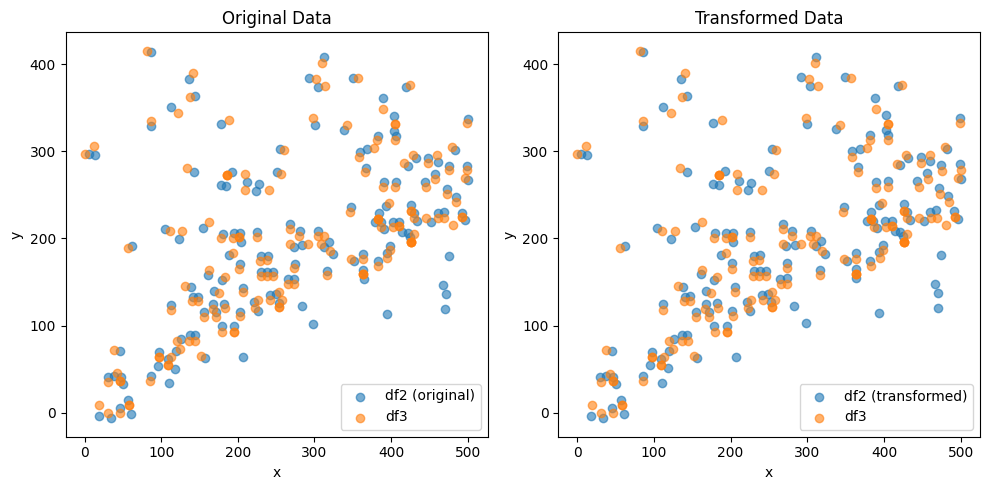

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (221,)
df2 (221, 2)
df3 (221, 2)
Optimal Translation and Rotation Parameters:
Translation: ( -6.043375364965766e-06 , -1.2687718854044428e-05 )
Rotation (radians): -0.002533514364609963
Transform Matrix:
 [[ 9.99996791e-01  2.53351165e-03 -6.04337536e-06]
 [-2.53351165e-03  9.99996791e-01 -1.26877189e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


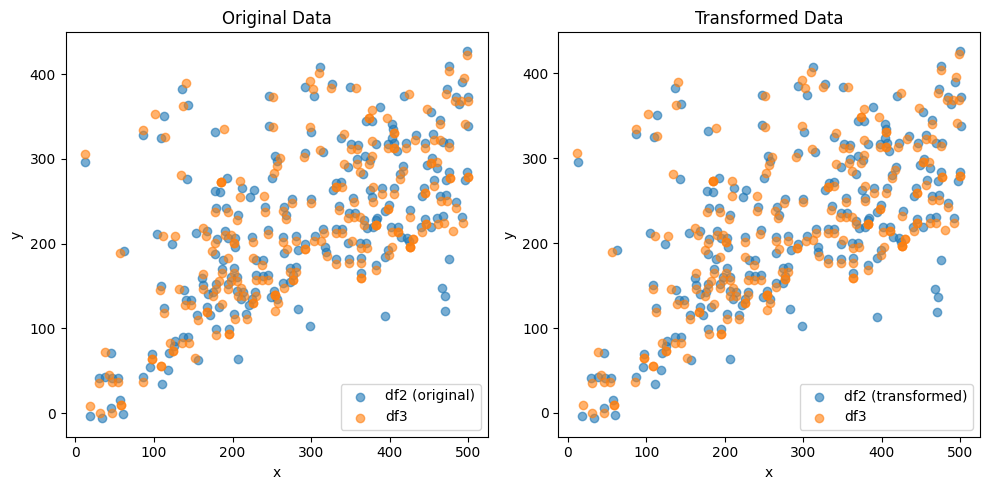

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (154,)
df2 (154, 2)
df3 (154, 2)
Optimal Translation and Rotation Parameters:
Translation: ( -3.414406065744699e-05 , -1.489137643962948e-05 )
Rotation (radians): 0.002277923145677145
Transform Matrix:
 [[ 9.99997406e-01 -2.27792118e-03 -3.41440607e-05]
 [ 2.27792118e-03  9.99997406e-01 -1.48913764e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


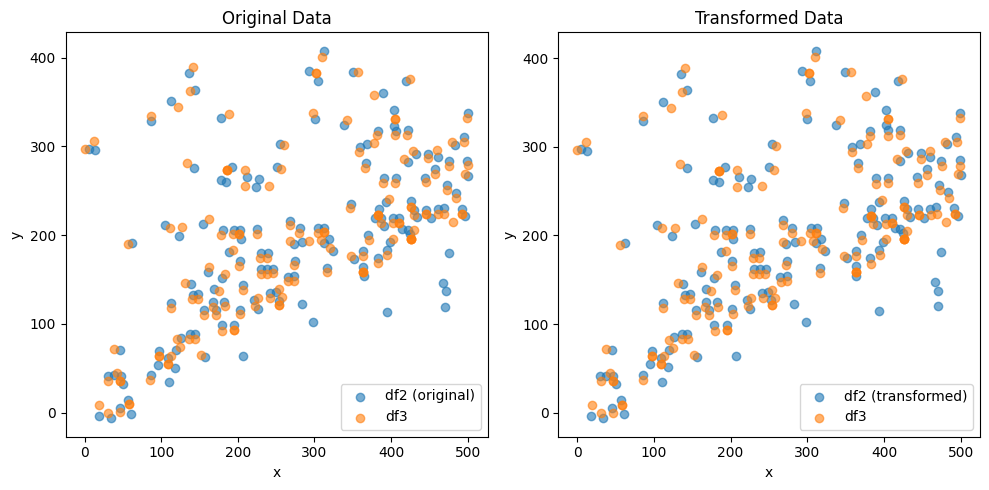

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (207,)
df2 (207, 2)
df3 (207, 2)
Optimal Translation and Rotation Parameters:
Translation: ( -5.132530379995613e-06 , -1.0956418162978673e-05 )
Rotation (radians): -0.0023523540442474526
Transform Matrix:
 [[ 9.99997233e-01  2.35235187e-03 -5.13253038e-06]
 [-2.35235187e-03  9.99997233e-01 -1.09564182e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


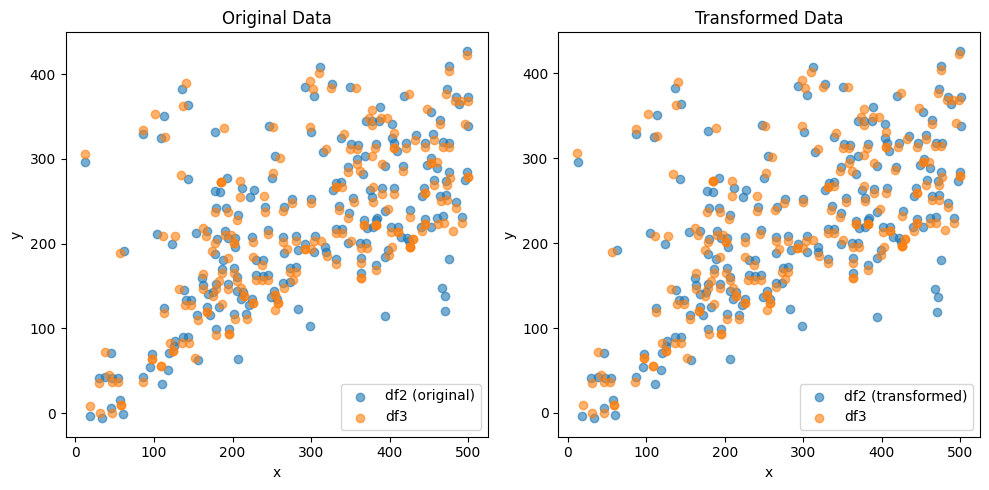

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (150,)
df2 (150, 2)
df3 (150, 2)
Optimal Translation and Rotation Parameters:
Translation: ( -3.0522755595865624e-05 , -1.3230666152179681e-05 )
Rotation (radians): 0.002607989447822643
Transform Matrix:
 [[ 9.99996599e-01 -2.60798649e-03 -3.05227556e-05]
 [ 2.60798649e-03  9.99996599e-01 -1.32306662e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


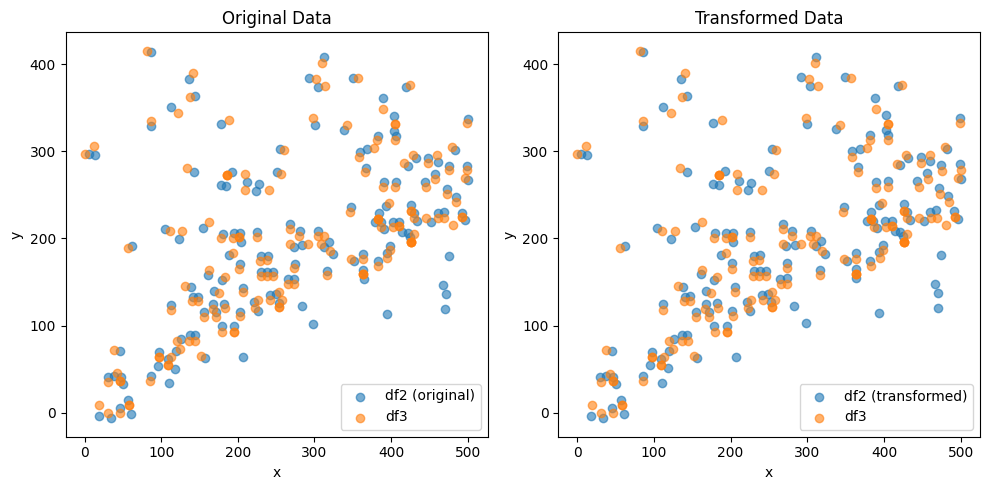

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (221,)
df2 (221, 2)
df3 (221, 2)
Optimal Translation and Rotation Parameters:
Translation: ( -6.0928682295235074e-06 , -1.2739887764821174e-05 )
Rotation (radians): -0.002533551017320558
Transform Matrix:
 [[ 9.99996791e-01  2.53354831e-03 -6.09286823e-06]
 [-2.53354831e-03  9.99996791e-01 -1.27398878e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


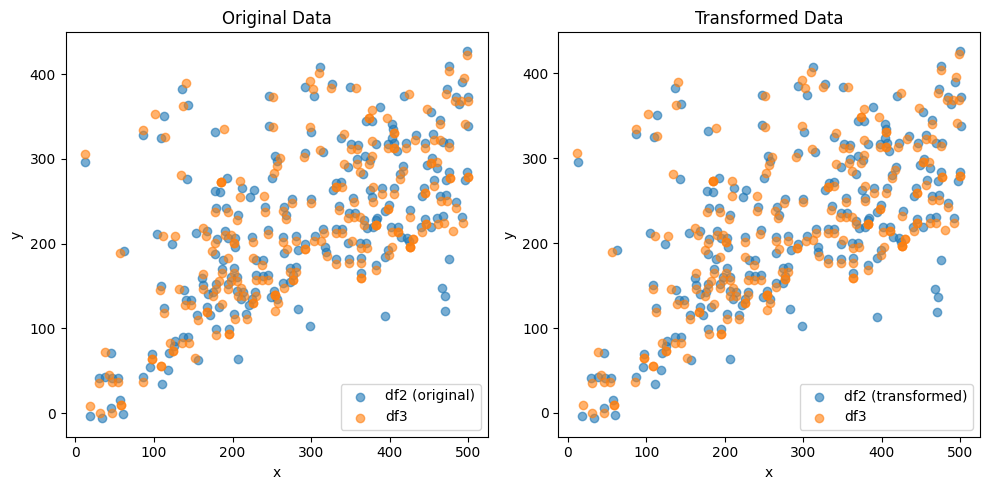

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (154,)
df2 (154, 2)
df3 (154, 2)
Optimal Translation and Rotation Parameters:
Translation: ( -3.4102961537627047e-05 , -1.4947450728532554e-05 )
Rotation (radians): 0.0022778200229074037
Transform Matrix:
 [[ 9.99997406e-01 -2.27781805e-03 -3.41029615e-05]
 [ 2.27781805e-03  9.99997406e-01 -1.49474507e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


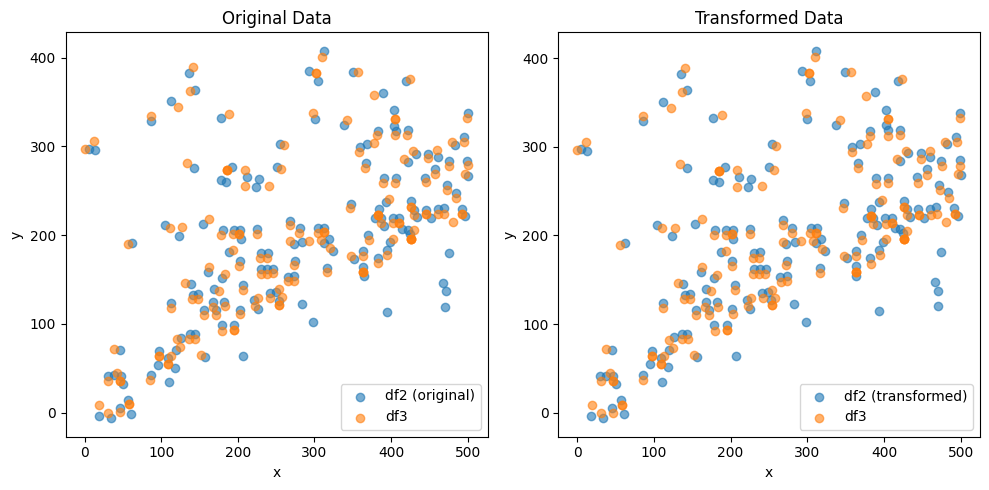

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (207,)
df2 (207, 2)
df3 (207, 2)
Optimal Translation and Rotation Parameters:
Translation: ( -5.105317268303849e-06 , -1.09391780889452e-05 )
Rotation (radians): -0.002352273512757552
Transform Matrix:
 [[ 9.99997233e-01  2.35227134e-03 -5.10531727e-06]
 [-2.35227134e-03  9.99997233e-01 -1.09391781e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


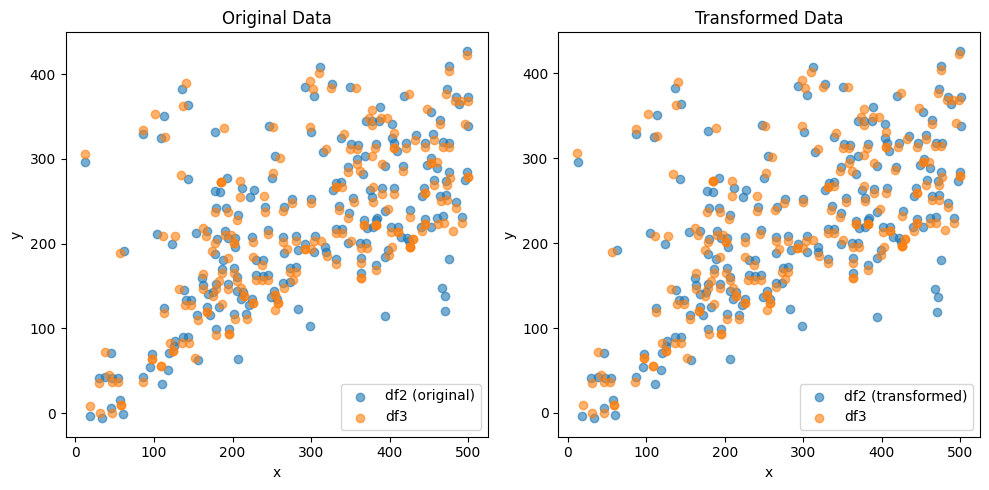

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1532358750.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (150,)
df2 (150, 2)
df3 (150, 2)
Optimal Translation and Rotation Parameters:
Translation: ( -3.0392306790262082e-05 , -1.327413680773167e-05 )
Rotation (radians): 0.002608169147340094
Transform Matrix:
 [[ 9.99996599e-01 -2.60816619e-03 -3.03923068e-05]
 [ 2.60816619e-03  9.99996599e-01 -1.32741368e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


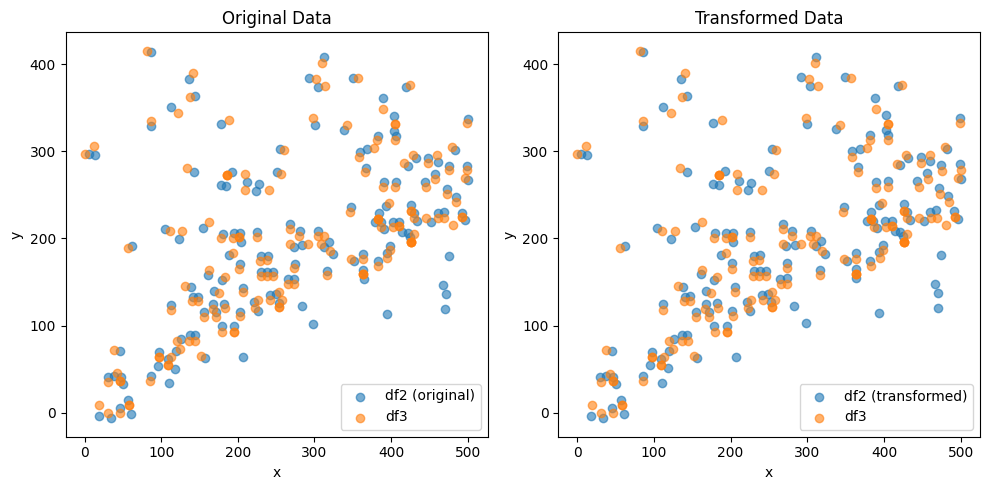

              0           1
0    334.224132  352.211007
1    246.216445  339.278988
2    397.349950  317.724698
3    112.221171  443.484173
4    221.377537  356.551433
..          ...         ...
995  335.336158  421.937375
996   37.684165   22.852398
997  275.399955  358.833567
998  122.968675  199.819373
999   81.344726  317.779004

[1000 rows x 2 columns]


In [1650]:
dist_min = 5  # min euclidean distance
data2_spatial_results = perform_transformations(data2_spatial_results, data3_spatial_results, Y_c, Z_c, data2_leiden_str, data1_leiden_str)
print(data2_spatial_results)

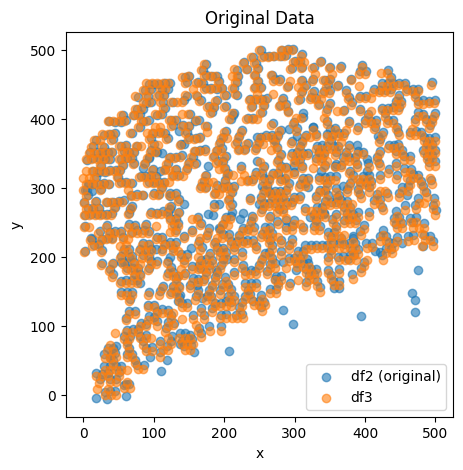

In [1702]:
plt.figure(figsize=(5, 5))

plt.scatter(data2_spatial_results[0], data2_spatial_results[1], label='df2 (original)', alpha=0.6)
plt.scatter(data3_spatial_results[0], data3_spatial_results[1], label='df3', alpha=0.6)
plt.title('Original Data')
plt.xlabel('x')
plt.ylabel('y')
plt.legend()



C:\Users\28123\AppData\Local\Temp\ipykernel_2856\1840640880.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


(1000, 2) (1000, 2)
(1000, 1000)
(1000, 2) (1000, 2)
(1000, 2) (1000, 2)
   spatial.CCA.X  spatial.CCA.Y  spatial_ID  spatial_cluster  spatial.CCA.Z  \
0     334.224132     352.211007           0                2             -1   
1     246.216445     339.278988           1                2             -1   
2     397.349950     317.724698           2               11             -1   
3     112.221171     443.484173           3                0             -1   
4     221.377537     356.551433           4                7             -1   

   metabolic.CCA.X  metabolic.CCA.Y  matabolic_ID  matabolic_cluster  \
0       333.198052       419.561732           995                  2   
1       239.042208       400.053447           886                  6   
2       397.321429       312.667023             2                 11   
3       108.969156       442.811331             3                  0   
4       219.967532       354.623196             4                  7   

   matabolic.CCA.Z 

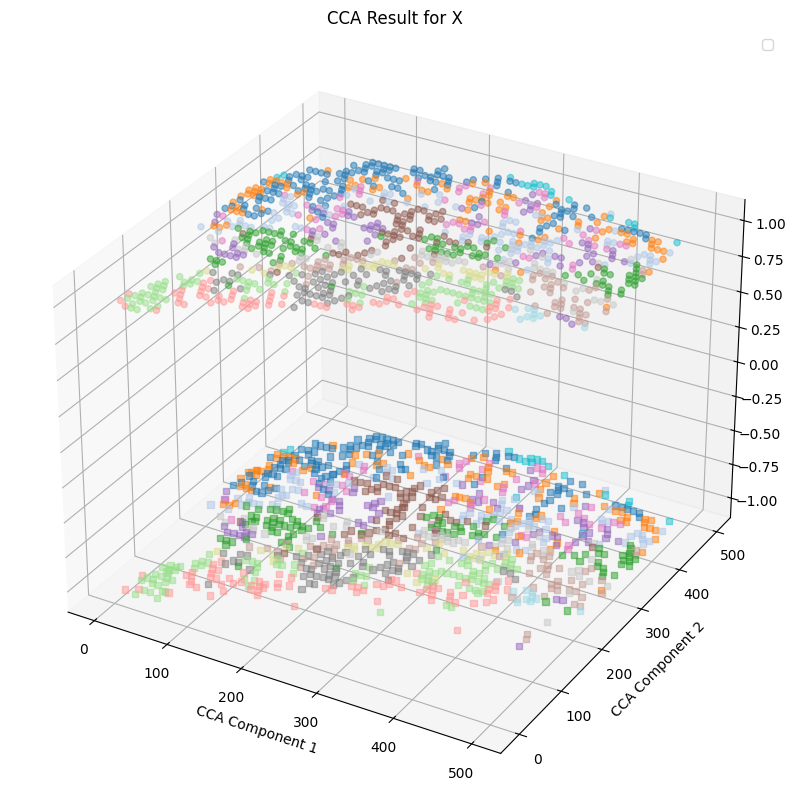

In [1719]:
Y_c=pd.DataFrame(data2_spatial_results)
Z_c=pd.DataFrame(data3_spatial_results)
print(Z_c.shape, Y_c.shape)
from scipy.spatial.distance import cdist
distances = cdist(Y_c, Z_c, metric='euclidean')
dist_df = pd.DataFrame(distances)
print(dist_df.shape)
min_row_indices = dist_df.idxmin()
print(Z_c.shape, Y_c.shape)
###############找出Y_C(spatial)周围dist_min以内的Z_C(metabolic)点
Y_C_ = Y_c.iloc[:,:]
Y_C_['spatial_ID'] = Y_C_.index
Y_C_ = Y_C_.reset_index()
Y_C_["spatial_cluster"] = data2_leiden_str.astype(int)
Y_C_["spatial.CCA.Z"] = -1
Y_C_ = Y_C_.drop(columns=['index'])
Y_C_ = Y_C_.rename(columns={0: "spatial.CCA.X", 1:"spatial.CCA.Y"})
print(Z_c.shape, Y_c.shape)
Z_C_=Z_c.iloc[min_row_indices,]
Z_C_['matabolic_ID'] = Z_C_.index
Z_C_=Z_C_.reset_index()
Z_C_["matabolic_cluster"] = data1_leiden_str[min_row_indices].astype(int)
Z_C_=Z_C_.drop(columns=['index'])
Z_C_["matabolic.CCA.Z"] = 1
Z_C_=Z_C_.rename(columns={0: "metabolic.CCA.X", 1:"metabolic.CCA.Y"})
pairs = pd.concat([Y_C_,Z_C_],axis=1)
#pairs["distance"] = dist_df.iloc[row_indices,col_indices].values.diagonal()  //diagonal要求内存过大
print(pairs.head())

fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(111, projection='3d')
plt.scatter(Z_c.iloc[:, 0], Z_c.iloc[:, 1],zs=1, c=data1_leiden_str[:].astype(int), cmap='tab20', s=20, alpha=0.5)
plt.scatter(Y_c.iloc[:, 0], Y_c.iloc[:, 1],zs=-1, c=data2_leiden_str.astype(int), cmap='tab20', s=20, alpha=0.5,marker='s')
#for i in range(0,pairs.shape[0]):
#    plt.plot(pairs.iloc[i,[0,5]], pairs.iloc[i,[1,6]], pairs.iloc[i,[4,9]], 'gray', linewidth=0.2)
plt.xlabel('CCA Component 1')
plt.ylabel('CCA Component 2')
plt.title('CCA Result for X')
plt.legend()
plt.show()


In [1774]:
same_values_mask_fine = pairs['spatial_cluster'] == pairs['matabolic_cluster']

# 计算相同值的个数
same_values_count_fine = same_values_mask_fine.sum()
same_values_count_fine

889

In [1707]:
#pairs.to_csv("I:\\mutiomics\\Spatial Multimodal Analysis of Transcriptomes and Metabolomes in Tissues\\benchmark\\no_anchorpair_run2.csv", index=False)

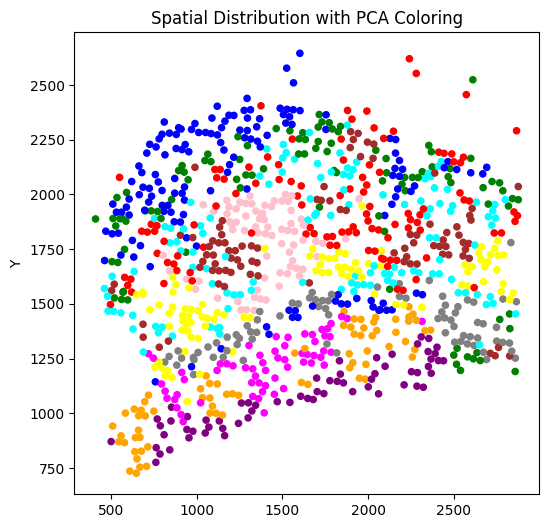

In [1775]:
plt.figure(figsize=(6, 6))
plt.scatter(pd.DataFrame(adata2.obsm['spatial']).iloc[:, 0],pd.DataFrame(adata2.obsm['spatial']).iloc[:, 1], 
            c=[color_mapping[category] for category in pairs["matabolic_cluster"].tolist()], s=20, alpha=1)
plt.ylabel('Y')
plt.title('Spatial Distribution with PCA Coloring')
unique_categories = pairs["matabolic_cluster"].unique()
handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color_mapping[cat], markersize=10) for cat in unique_categories]
#plt.legend(handles, unique_categories, title="Metabolic Clusters")
#plt.savefig("I:\\mutiomics\\Spatial Multimodal Analysis of Transcriptomes and Metabolomes in Tissues\\benchmark\\GC\\furtheralignment.pdf")
plt.show()


In [1776]:
same_values_mask_directmerge = pairs['spatial_cluster'] == pairs['matabolic_cluster']
# 计算相同值的个数
same_values_count_fine = same_values_mask_directmerge.sum()
Accruracy_furtheralignment = same_values_count_fine

In [1777]:
dist_min = 3 ## min euclidean distance
Y_c=pd.DataFrame(data2_spatial_results)
Z_c=pd.DataFrame(data3_spatial_results)
from scipy.spatial.distance import cdist
distances = cdist(Y_c, Z_c, metric='euclidean')
dist_df = pd.DataFrame(distances)
###############找出Y_C(spatial)周围dist_min以内的Z_C(metabolic)点
row_indices, col_indices = np.where(distances <dist_min)
unique_row_indices = np.unique(row_indices)
unique_col_indices = np.unique(col_indices)
#############plot
####Z_C is metablic and is at 1
Y_C_=Y_c.iloc[col_indices,]
Y_C_['spatial_ID'] = Y_C_.index
Y_C_=Y_C_.reset_index()
Y_C_["spatial_cluster"] = data2_leiden_str[col_indices].astype(int)
Y_C_["spatial.CCA.Z"] = -1
Y_C_=Y_C_.drop(columns=['index'])
Y_C_=Y_C_.rename(columns={0: "spatial.CCA.X", 1:"spatial.CCA.Y"})

Z_C_=Z_c.iloc[row_indices,]
Z_C_['matabolic_ID'] = Z_C_.index
Z_C_=Z_C_.reset_index()
Z_C_["matabolic_cluster"] = data1_leiden_str[row_indices].astype(int)
Z_C_=Z_C_.drop(columns=['index'])
Z_C_["matabolic.CCA.Z"] = 1
Z_C_=Z_C_.rename(columns={0: "metabolic.CCA.X", 1:"metabolic.CCA.Y"})

pairs = pd.concat([Y_C_,Z_C_],axis=1)
pairs["distance"] = dist_df.iloc[row_indices,col_indices].values.diagonal()  
print(pairs.head())


def calculate_simpson_index(values):
    total_count = len(values)
    unique_values = set(values)
    simpson_index = 1 - sum((values.count(value) / total_count) ** 2 for value in unique_values)
    return simpson_index

def main(df):
    # 保存每个 X1 中值对应的 X2 中值的列表
    x1_x2_lists = df.groupby('spatial_ID')['matabolic_cluster'].apply(list).reset_index()

    # 计算每个 X1 中值的辛普森指数
    simpson_indices = x1_x2_lists['matabolic_cluster'].apply(calculate_simpson_index)

    # 保存每个 X1 中值对应的 X2 中出现频率最高的值
    max_x2_values = x1_x2_lists['matabolic_cluster'].apply(lambda x: max(set(x), key=x.count))

    # 生成新的 DataFrame
    new_df = pd.DataFrame({'spatial_ID': x1_x2_lists['spatial_ID'], 'Most_freq_metabolic_cluster': max_x2_values, 'Simpson_Index': simpson_indices})

    # 合并 X3 列
    new_df = pd.merge(new_df, df[['spatial_ID',"spatial_cluster"]].drop_duplicates(), on='spatial_ID', how='left')

    return new_df

# 示例输入数据
data = pairs
df = pd.DataFrame(data)

# 调用主函数
result_df = main(df)
result_df

   spatial.CCA.X  spatial.CCA.Y  spatial_ID  spatial_cluster  spatial.CCA.Z  \
0     100.542838     200.235529           0                3             -1   
1     100.246717     288.810619           1                2             -1   
2     289.528806     335.930254           9                7             -1   
3     347.710937     363.258813          10                1             -1   
4     150.995144     353.270649          11                7             -1   

   metabolic.CCA.X  metabolic.CCA.Y  matabolic_ID  matabolic_cluster  \
0        99.351176       199.358632             0                  3   
1        98.337388       289.417424             1                  2   
2       290.348743       337.787280             9                  7   
3       348.945661       365.847141            10                  1   
4       148.824006       353.287012            11                  7   

   matabolic.CCA.Z  distance  
0                1  1.479529  
1                1  2.003434  

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\695837299.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_2856\695837299.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


,spatial_ID,Most_freq_metabolic_cluster,Simpson_Index,spatial_cluster
0,0,3,0.0,3
1,1,2,0.0,2
2,4,0,0.0,0
3,6,5,0.0,5
4,9,7,0.0,7
...,...,...,...,...
277,978,10,0.0,10
278,981,11,0.0,11
279,983,6,0.0,6
280,985,1,0.0,1


<bound method NDFrame.head of      spatial_ID  Most_freq_metabolic_cluster  Simpson_Index  spatial_cluster
0             0                            3            0.0                3
1             1                            2            0.0                2
2             4                            0            0.0                0
3             6                            5            0.0                5
4             9                            7            0.0                7
..          ...                          ...            ...              ...
277         978                           10            0.0               10
278         981                           11            0.0               11
279         983                            6            0.0                6
280         985                            1            0.0                1
281         994                            7            0.0                7

[282 rows x 4 columns]>
     spatial_ID  Most

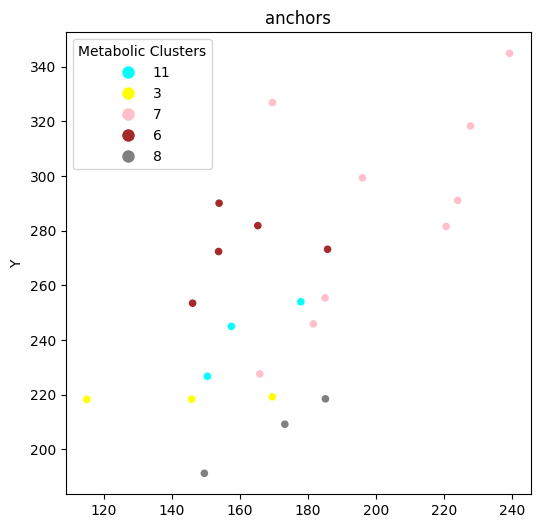

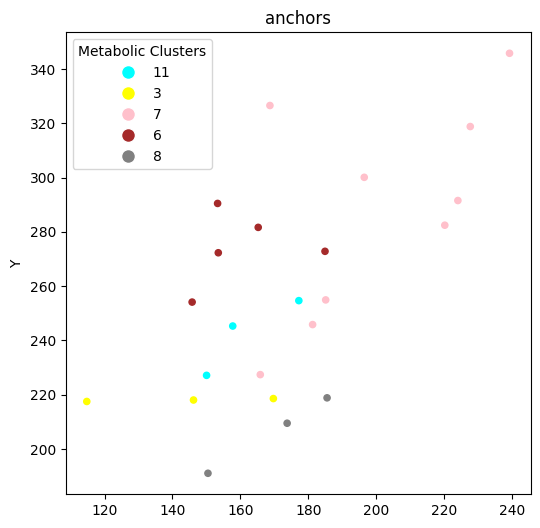

In [1779]:
###### find transcript-metaboic pairs anchors by filtering: 
######1/simpson index less than 0.2 2/Most_freq_metabolic_cluster==matabolic_cluster
print(result_df.head)
#print(pairs.head)
merged_df = pd.merge(result_df, pairs, on='spatial_ID', how='inner')
merged_df = pd.DataFrame(merged_df)
print(merged_df)
merged_df = merged_df[(merged_df['Simpson_Index'] < 0.5) &(merged_df['distance'] < 1) ]
#merged_df = merged_df[(merged_df['Simpson_Index'] < 0.5) & (merged_df['Most_freq_metabolic_cluster'] == merged_df['matabolic_cluster'])&(merged_df['distance'] < 0.5) ]
merged_df = merged_df.drop_duplicates(subset="matabolic_ID")
print(merged_df["spatial_ID"])

plt.figure(figsize=(6, 6))
plt.scatter(data2_spatial_results.iloc[merged_df["spatial_ID"], 0],data2_spatial_results.iloc[merged_df["spatial_ID"], 1], 
            c=[color_mapping[category] for category in merged_df["matabolic_cluster"].tolist()], s=20, alpha=1)
plt.ylabel('Y')
plt.title('anchors')
unique_categories = merged_df["matabolic_cluster"].unique()
handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color_mapping[cat], markersize=10) for cat in unique_categories]
plt.legend(handles, unique_categories, title="Metabolic Clusters")
#plt.savefig("I:\\mutiomics\\Spatial Multimodal Analysis of Transcriptomes and Metabolomes in Tissues\\m3\\anchor_spatial.pdf")
plt.show()

plt.figure(figsize=(6, 6))
plt.scatter(data3_spatial_results.iloc[merged_df["matabolic_ID"], 0],data3_spatial_results.iloc[merged_df["matabolic_ID"], 1], 
            c=[color_mapping[category] for category in merged_df["matabolic_cluster"].tolist()], s=20, alpha=1)
plt.ylabel('Y')
plt.title('anchors')
unique_categories = merged_df["matabolic_cluster"].unique()
handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color_mapping[cat], markersize=10) for cat in unique_categories]
plt.legend(handles, unique_categories, title="Metabolic Clusters")
#plt.savefig("I:\\mutiomics\\Spatial Multimodal Analysis of Transcriptomes and Metabolomes in Tissues\\m3\\anchor_metabolic.pdf")
plt.show()


In [1780]:
def convert_to_array(x):
    if isinstance(x, csr_matrix):
        return x.toarray()
    elif isinstance(x, np.ndarray):
        return x
    else:
        raise ValueError("Unsupported input type. Must be csr_matrix or ndarray.")
def tpm_normalize(counts_matrix):
    # 计算每个细胞的总表达量
    total_counts_per_cell = counts_matrix.sum(axis=1)
    # 计算每个基因的 TPM
    tpm_matrix = (counts_matrix.div(total_counts_per_cell, axis=0)) * 1e4
    return tpm_matrix
scaler = MinMaxScaler(feature_range=(-1, 1))
DF1 = convert_to_array(adata2.X)
DF1 = pd.DataFrame(DF1)
DF1 = tpm_normalize(DF1)
DF1 = np.log2(DF1 + 1)
#DF1 = scaler.fit_transform(DF1)
DF1 = pd.DataFrame(DF1)

DF2 = convert_to_array(adata1.X)
DF2 = pd.DataFrame(DF2)
DF2 = tpm_normalize(DF2)
#DF2 = scaler.fit_transform(DF2)
DF2 = np.log2(DF2+1)
DF2 = pd.DataFrame(DF2)

print(DF1.shape,DF2.shape)
spatial_ID_list = merged_df['spatial_ID'].tolist()
metabolic_ID_list = merged_df['matabolic_ID'].tolist()

# 从 DF1 和 DF2 中提取对应的样本
spatial_samples = DF1.loc[spatial_ID_list,:]
index_strings = adata2.var.index.astype(str)
column_mapping = {old_name: new_name for old_name, new_name in zip(spatial_samples.columns, index_strings)}
spatial_samples.rename(columns=column_mapping, inplace=True)
rowindex = spatial_samples.shape[0]
spatial_samples.index = range(rowindex)

metabolic_samples = DF2.loc[metabolic_ID_list,:]
rowindex = metabolic_samples.shape[0]
index_strings = adata1.var.index.astype(str)
column_mapping = {old_name: new_name for old_name, new_name in zip(metabolic_samples.columns, index_strings)}
metabolic_samples.rename(columns=column_mapping, inplace=True)
metabolic_samples.index = range(rowindex)

print(spatial_samples.shape,metabolic_samples.shape,pd.concat([spatial_samples, metabolic_samples], axis=0).shape)
# 计算特征之间的相关性

(1000, 2500) (1000, 2499)
(23, 2500) (23, 2499) (46, 4999)


(23, 4999)


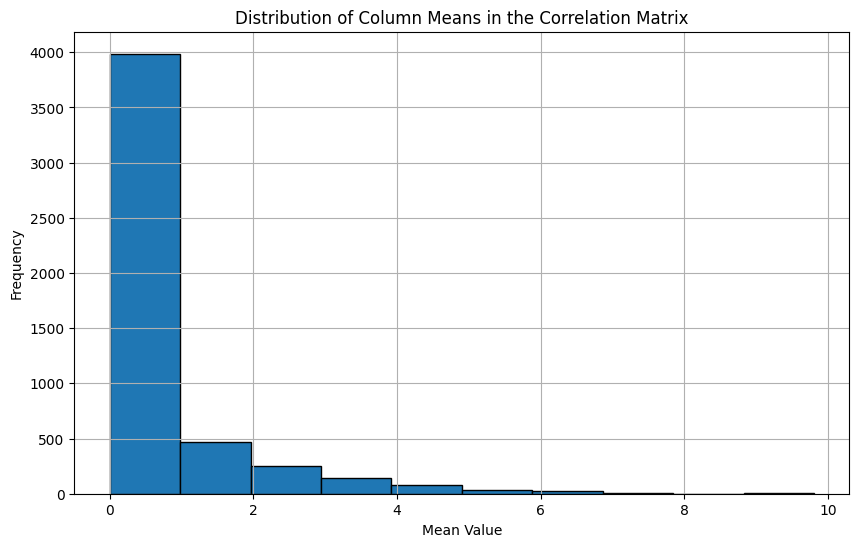

DF1 列变量与 DF2 列变量之间的相关性矩阵：


In [1781]:
correlation_matrix = pd.concat([spatial_samples, metabolic_samples], axis=1)
print(correlation_matrix.shape)
column_means = correlation_matrix.mean(axis=0)
plt.figure(figsize=(10, 6))
plt.hist(column_means, bins=10, edgecolor='black')
plt.title('Distribution of Column Means in the Correlation Matrix')
plt.xlabel('Mean Value')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()
correlation_matrix = correlation_matrix.corr()
# 显示相关性矩阵
print("DF1 列变量与 DF2 列变量之间的相关性矩阵：")

# 显示 DF3
#print(DF3)

(2500, 2499)


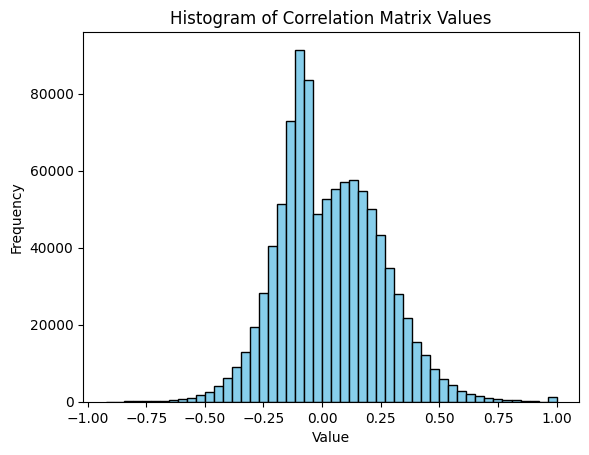

In [1782]:
correlation_matrix2 = correlation_matrix.iloc[:2500, -2499:]
print(correlation_matrix2.shape)

values = correlation_matrix2.values.flatten()
plt.hist(values, bins=50, color='skyblue', edgecolor='black')
plt.title('Histogram of Correlation Matrix Values')
plt.xlabel('Value')
plt.ylabel('Frequency')

# 显示图形
plt.show()
high_correlation_spatial = []
high_correlation_metabolic = []



In [1783]:
import pandas as pd
import numpy as np

# Example correlation matrix with NaN values
correlation_matrix2[correlation_matrix2 > 0.95] = np.nan
# Flatten the correlation matrix and keep track of the row and column indices, excluding NaNs
flattened = correlation_matrix2.values.flatten()
non_nan_indices = ~np.isnan(flattened)
flattened_non_nan = flattened[non_nan_indices]
original_indices = np.dstack(np.unravel_index(np.where(non_nan_indices)[0], correlation_matrix2.shape))[0]

# Sort the non-NaN flattened array to find the top 20 highest values
sorted_indices = np.argsort(flattened_non_nan)[::-1]
top_n = 200
top_indices = original_indices[sorted_indices[:top_n]]

# Retrieve the corresponding row and column indices
top_rows = top_indices[:, 0]
top_cols = top_indices[:, 1]

# Get the top 20 highest values
top_values = flattened_non_nan[sorted_indices[:top_n]]

# Convert to lists if needed
top_rows = list(top_rows)
top_cols = list(top_cols)
top_values = list(top_values)

# Display results
print("Top 20 highest correlation values (excluding NaNs):")
for i in range(len(top_values)):
    print(f"Value: {top_values[i]}, Row: {top_rows[i]}, Column: {top_cols[i]}")

# Optionally, convert to a DataFrame for easier viewing
top_correlations_df = pd.DataFrame({
    'Value': top_values,
    'Row': top_rows,
    'Column': top_cols
})

print("\nTop 20 highest correlation values in DataFrame format:")
print(top_correlations_df)

unique_top_correlations_df = top_correlations_df.drop_duplicates(subset=['Column'])
unique_top_correlations_df = unique_top_correlations_df.drop_duplicates(subset=['Row'])
# 转换为列表（如果需要）
unique_top_rows = list(unique_top_correlations_df['Row'])
unique_top_cols = list(unique_top_correlations_df['Column'])
unique_top_values = list(unique_top_correlations_df['Value'])

print("\nTop correlation values in DataFrame format (unique pairs):")
print(unique_top_correlations_df)


Top 20 highest correlation values (excluding NaNs):
Value: 0.9459130903234823, Row: 917, Column: 156
Value: 0.9444836611638845, Row: 1727, Column: 1689
Value: 0.9404327757940302, Row: 1123, Column: 332
Value: 0.939059520238433, Row: 2356, Column: 1806
Value: 0.939059520238433, Row: 2356, Column: 833
Value: 0.939059520238433, Row: 2356, Column: 839
Value: 0.9389998868878722, Row: 1785, Column: 2273
Value: 0.938404868163352, Row: 1257, Column: 2452
Value: 0.9359658150223795, Row: 1017, Column: 1306
Value: 0.9337982766319435, Row: 382, Column: 616
Value: 0.9337982766319435, Row: 1344, Column: 616
Value: 0.9328759654285582, Row: 2480, Column: 1128
Value: 0.9321325695998652, Row: 2274, Column: 1015
Value: 0.9316467173663948, Row: 628, Column: 739
Value: 0.930683501281768, Row: 937, Column: 1454
Value: 0.9306112341131628, Row: 2274, Column: 753
Value: 0.9303068554536517, Row: 2218, Column: 562
Value: 0.9295124321310376, Row: 636, Column: 1295
Value: 0.9295124321310376, Row: 1837, Column: 129

In [1784]:
import numpy as np
import matplotlib.pyplot as plt
scaler = MinMaxScaler(feature_range=(-1, 1))
metabolic_select_high_corr_variant = convert_to_array(adata1.X)
metabolic_select_high_corr_variant = pd.DataFrame(metabolic_select_high_corr_variant)
metabolic_select_high_corr_variant = scaler.fit_transform(metabolic_select_high_corr_variant)
metabolic_select_high_corr_variant = pd.DataFrame(metabolic_select_high_corr_variant)
metabolic_select_high_corr_variant = metabolic_select_high_corr_variant.iloc[:,top_cols]
metabolic_select_high_corr_variant = pd.concat([data3_spatial_results, metabolic_select_high_corr_variant], axis=1)

spatial_select_high_corr_variant = convert_to_array(adata2.X)
spatial_select_high_corr_variant = pd.DataFrame(spatial_select_high_corr_variant)
spatial_select_high_corr_variant = scaler.fit_transform(spatial_select_high_corr_variant)
spatial_select_high_corr_variant = pd.DataFrame(spatial_select_high_corr_variant)
spatial_select_high_corr_variant = spatial_select_high_corr_variant.iloc[:,top_rows]
spatial_select_high_corr_variant = pd.concat([data2_spatial_results, spatial_select_high_corr_variant], axis=1)

In [1785]:
spatial_select_high_corr_variant.iloc[:,2:].T.to_numpy().shape

(200, 1000)

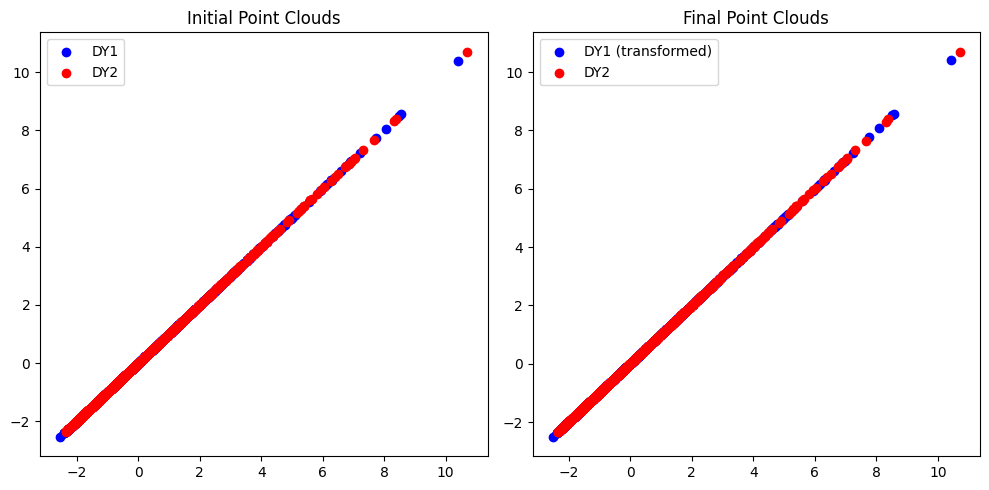

Final transformation matrix:
[[4.94744098e-06]]


In [1797]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial import cKDTree

#DY1 = data2_spatial_results.T.values  # Example DY1 point cloud (2D points
#DY1 = data2_spatial_results.T.values
#DY2 = data3_spatial_results.T.values # Example DY2 point cloud (2D points)
DY1 = spatial_select_high_corr_variant.iloc[:,2:].T.to_numpy()  # Example DYGW1 features
DY2 = metabolic_select_high_corr_variant.iloc[:,2:].T.to_numpy()  # Example DYGW2 features
scaler1 = StandardScaler()
scaler2 = StandardScaler()
DY1 = scaler1.fit_transform(DY1.T).T
DY2 = scaler2.fit_transform(DY2.T).T

# Perform CCA
cca = CCA(n_components=1)
DY1_c, DY2_c = cca.fit_transform(DY1.T, DY2.T)
DY1 = DY1_c.T
DY2 = DY2_c.T
DY1CCA = DY1
DY2CCA = DY2
# 初始变换估计
transformation = np.eye(2)  # 初始变换矩阵为2x2的单位矩阵

# 设定迭代次数和收敛阈值
max_iterations = 500
tolerance = 1e-5

# 创建一个新的图形窗口
plt.figure(figsize=(10, 5))

# 绘制初始的DY1和DY2点云
plt.subplot(1, 2, 1)
plt.title('Initial Point Clouds')
plt.scatter(DY1[0], DY1[0], color='blue', label='DY1')
plt.scatter(DY2[0], DY2[0], color='red', label='DY2')
plt.legend()

iteration = 0
converged = False

while not converged and iteration < max_iterations:
    # Step 1: Find correspondences based on spatial proximity
    tree = cKDTree(DY2.T)
    distances, indices = tree.query(DY1.T)
    
    corresponding_target_points = DY2[:, indices]

    # Step 2: Optimize transformation using spatial and feature distances
    # Example: simple averaging transformation for illustration
    transformation = np.mean(corresponding_target_points - DY1, axis=1, keepdims=True)

    # Step 3: Apply transformation to DY1
    DY1_transformed = DY1 + transformation

    # Step 4: Update DY1 for the next iteration
    DY1 = DY1_transformed

    # Step 5: Check convergence
    if np.linalg.norm(transformation) < tolerance:
        converged = True

    iteration += 1

# 绘制最终的DY1和DY2点云
plt.subplot(1, 2, 2)
plt.title('Final Point Clouds')
plt.scatter(DY1[0], DY1[0], color='blue', label='DY1 (transformed)')
plt.scatter(DY2[0], DY2[0], color='red', label='DY2')
plt.legend()

plt.tight_layout()
plt.show()

print("Final transformation matrix:")
print(transformation)


In [1798]:
DY1.shape

(1, 1000)

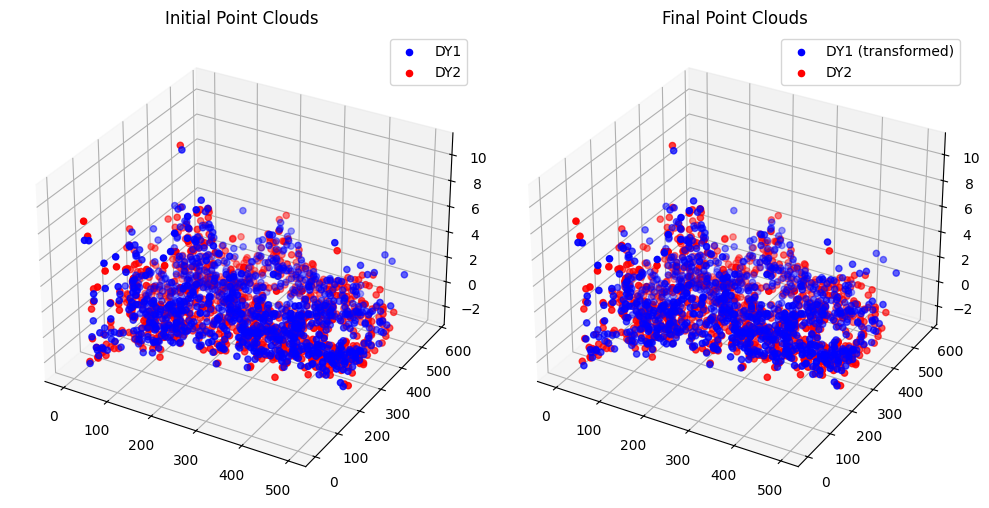

Final transformation matrix:
[[ 1.00000000e+00  2.05605264e-17  4.50513395e-20 -5.68434189e-14]
 [ 2.05593966e-17  1.00000000e+00 -2.44720651e-19  0.00000000e+00]
 [-1.11154734e-18  6.49550514e-19  1.00000000e+00  1.24900090e-16]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.00000000e+00]]


In [1799]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial import cKDTree
# Example 3D point cloud data (replace with your actual data)
#DY1CCA = DY1
#DY2CCA = DY2
DY1 = spatial_select_high_corr_variant.iloc[:,0:2].T.to_numpy()  # 3D point cloud DY1 (3 x N)
DY2 = metabolic_select_high_corr_variant.iloc[:,0:2].T.to_numpy()   # 3D point cloud DY2 (3 x M)
DY1 = np.vstack((DY1, DY1CCA))
DY2 = np.vstack((DY2, DY2CCA))

# 初始变换矩阵
transformation_matrix = np.eye(4)  # 初始变换矩阵为4x4单位矩阵

# 设置迭代参数
max_iterations = 500
tolerance = 1e-5

# 绘制初始点云
fig = plt.figure(figsize=(10, 5))

ax1 = fig.add_subplot(121, projection='3d')
ax1.scatter(DY1[0], DY1[1], DY1[2], color='blue', label='DY1')
ax1.scatter(DY2[0], DY2[1], DY2[2], color='red', label='DY2')
ax1.set_title('Initial Point Clouds')
ax1.legend()

iteration = 0
converged = False

while not converged and iteration < max_iterations:
    # Step 1: Find correspondences based on spatial proximity
    tree = cKDTree(DY2.T)
    distances, indices = tree.query(DY1.T)

    corresponding_target_points = DY2[:, indices]

    # Step 2: Calculate centroids
    centroid_DY1 = np.mean(DY1, axis=1, keepdims=True)
    centroid_DY2 = np.mean(corresponding_target_points, axis=1, keepdims=True)

    # Step 3: Center the points
    DY1_centered = DY1 - centroid_DY1
    DY2_centered = corresponding_target_points - centroid_DY2

    # Step 4: Compute the covariance matrix
    H = DY1_centered @ DY2_centered.T

    # Step 5: Compute the Singular Value Decomposition (SVD)
    U, S, Vt = np.linalg.svd(H)
    R = Vt.T @ U.T

    # Step 6: Ensure a proper rotation matrix (det(R) = 1)
    if np.linalg.det(R) < 0:
        Vt[2, :] *= -1
        R = Vt.T @ U.T

    # Step 7: Compute the translation vector
    t = centroid_DY2 - R @ centroid_DY1

    # Step 8: Form the transformation matrix
    transformation = np.eye(4)
    transformation[:3, :3] = R
    transformation[:3, 3] = t.flatten()

    # Step 9: Apply the transformation
    DY1_homogeneous = np.vstack((DY1, np.ones((1, DY1.shape[1]))))
    DY1_transformed_homogeneous = transformation @ DY1_homogeneous
    DY1_transformed = DY1_transformed_homogeneous[:3, :]

    # Step 10: Update DY1|
    DY1 = DY1_transformed

    # Step 11: Check convergence
    if np.linalg.norm(transformation[:3, 3]) < tolerance:
        converged = True

    iteration += 1

# 绘制最终点云
ax2 = fig.add_subplot(122, projection='3d')
ax2.scatter(DY1[0], DY1[1], DY1[2], color='blue', label='DY1 (transformed)')
ax2.scatter(DY2[0], DY2[1], DY2[2], color='red', label='DY2')
ax2.set_title('Final Point Clouds')
ax2.legend()

plt.tight_layout()
plt.show()

print("Final transformation matrix:")
print(transformation)

C:\Users\28123\AppData\Local\Temp\ipykernel_2856\2748365551.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


(1000, 3) (1000, 3)
(1000, 1000)
(1000, 3) (1000, 3)
(1000, 3) (1000, 3)
   spatial.CCA.X  spatial.CCA.Y         2  spatial_ID  spatial_cluster  \
0     102.383904     198.766588 -1.653128           0                3   
1     100.823826     287.327576  2.215700           1                2   
2     400.315743     347.397297 -2.178941           2                6   
3      89.864109     298.478012  6.253191           3                9   
4      86.913138     431.487047 -0.375055           4                0   

   spatial.CCA.Z  metabolic.CCA.X  metabolic.CCA.Y         2  matabolic_ID  \
0             -1        99.351176       199.358632 -1.287013             0   
1             -1        98.337388       289.417424  2.177779             1   
2             -1       404.298459       348.743987 -2.263722             2   
3             -1        86.577453       298.236237  6.258572             3   
4             -1        81.305758       433.190807 -0.001035             4   

   matabolic_

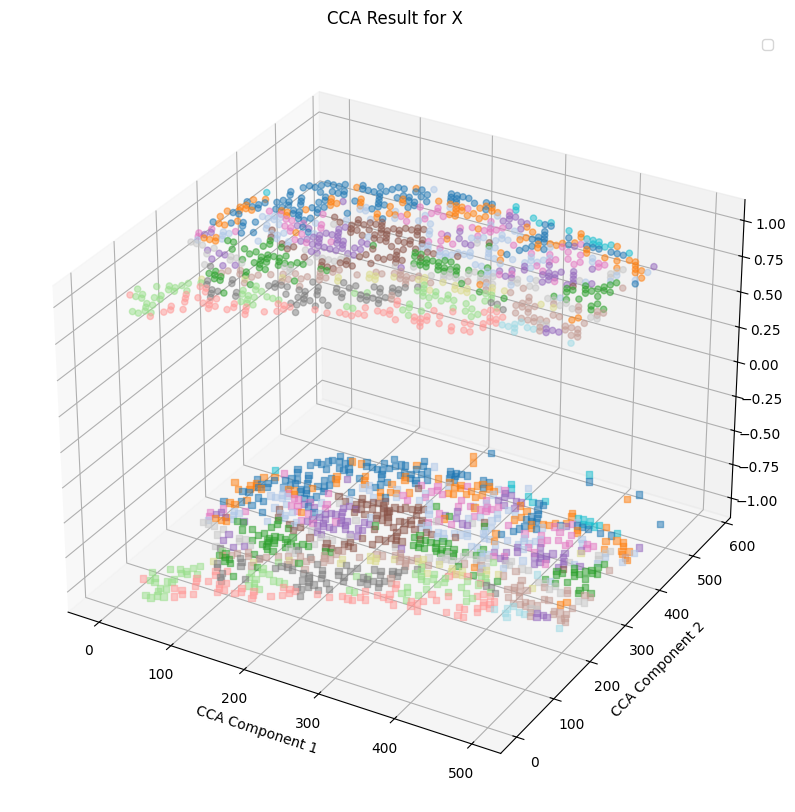

In [1800]:
Y_c = pd.DataFrame(DY1).T
Z_c = pd.DataFrame(DY2).T
#Y_c = pd.DataFrame(G)
#Z_c = data3_spatial_results
print(Z_c.shape, Y_c.shape)
from scipy.spatial.distance import cdist
distances = cdist(Z_c, Y_c, metric='euclidean')
dist_df = pd.DataFrame(distances)
print(dist_df.shape)
min_row_indices_ = dist_df.idxmin()
print(Z_c.shape, Y_c.shape)
###############找出Y_C(spatial)周围dist_min以内的Z_C(metabolic)点
Y_C_ = Y_c.iloc[:,:]
Y_C_['spatial_ID'] = Y_C_.index
Y_C_ = Y_C_.reset_index()
Y_C_["spatial_cluster"] = data2_leiden_str.astype(int)
Y_C_["spatial.CCA.Z"] = -1
Y_C_ = Y_C_.drop(columns=['index'])
Y_C_ = Y_C_.rename(columns={0: "spatial.CCA.X", 1:"spatial.CCA.Y"})
print(Z_c.shape, Y_c.shape)
Z_C_=Z_c.iloc[min_row_indices_,]
Z_C_['matabolic_ID'] = Z_C_.index
Z_C_=Z_C_.reset_index()
Z_C_["matabolic_cluster"] = data1_leiden_str[min_row_indices_].astype(int)
Z_C_=Z_C_.drop(columns=['index'])
Z_C_["matabolic.CCA.Z"] = 1
Z_C_=Z_C_.rename(columns={0: "metabolic.CCA.X", 1:"metabolic.CCA.Y"})
pairs = pd.concat([Y_C_,Z_C_],axis=1)
#pairs["distance"] = dist_df.iloc[row_indices,col_indices].values.diagonal()  //diagonal要求内存过大
print(pairs.head())

fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(111, projection='3d')
plt.scatter(Z_c.iloc[:, 0], Z_c.iloc[:, 1],zs=1, c=data1_leiden_str[:].astype(int), cmap='tab20', s=20, alpha=0.5)
plt.scatter(Y_c.iloc[:, 0], Y_c.iloc[:, 1],zs=-1, c=data2_leiden_str.astype(int), cmap='tab20', s=20, alpha=0.5,marker='s')
#for i in range(0,pairs.shape[0]):
#    plt.plot(pairs.iloc[i,[0,5]], pairs.iloc[i,[1,6]], pairs.iloc[i,[4,9]], 'gray', linewidth=0.2)
plt.xlabel('CCA Component 1')
plt.ylabel('CCA Component 2')
plt.title('CCA Result for X')
plt.legend()
plt.show()

In [1802]:
same_values_mask = pairs['spatial_cluster'] == pairs['matabolic_cluster']
# 计算相同值的个数
Accruracy_haCCA = same_values_mask.sum()
Accruracy_haCCA

919

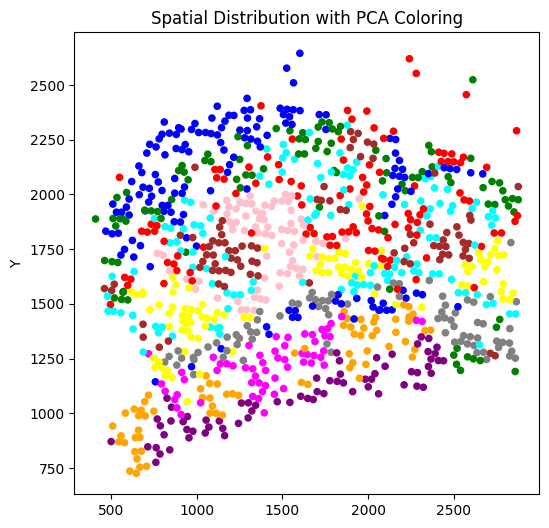

In [1791]:
plt.figure(figsize=(6, 6))
plt.scatter(pd.DataFrame(adata2.obsm['spatial']).iloc[:, 0],pd.DataFrame(adata2.obsm['spatial']).iloc[:, 1], 
            c=[color_mapping[category] for category in pairs["matabolic_cluster"].tolist()], s=20, alpha=1)
plt.ylabel('Y')
plt.title('Spatial Distribution with PCA Coloring')
unique_categories = pairs["matabolic_cluster"].unique()
handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color_mapping[cat], markersize=10) for cat in unique_categories]
#plt.legend(handles, unique_categories, title="Metabolic Clusters")
#plt.savefig("I:\\mutiomics\\Spatial Multimodal Analysis of Transcriptomes and Metabolomes in Tissues\\benchmark\\GC\\CCA_IPCalignment.pdf")
plt.show()


In [1792]:
#pairs.to_csv("I:\\mutiomics\\Spatial Multimodal Analysis of Transcriptomes and Metabolomes in Tissues\\benchmark\\run2.csv", index=False)

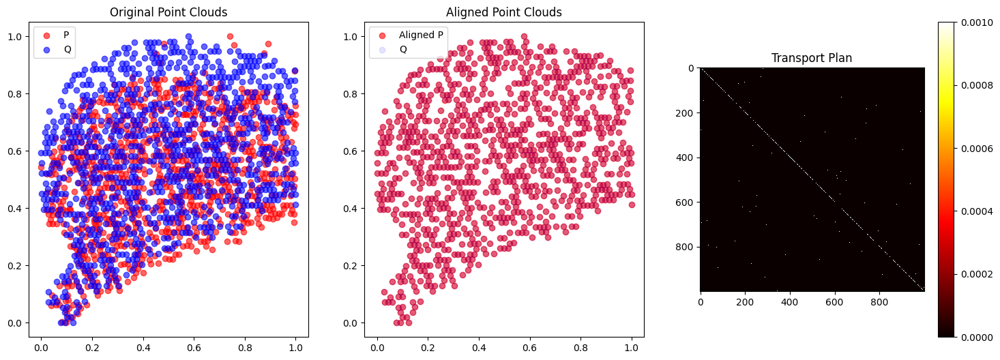

In [1793]:
import numpy as np
import ot
import matplotlib.pyplot as plt

# 假设 P 和 Q 是两个点云，形状分别为 (n, d) 和 (m, d)
P = data2_spatial_results.to_numpy()  # Example DYGW1 features
Q = data3_spatial_results.to_numpy()  # Example DYGW2 features

# 特征矩阵（这里假设特征与坐标相同）
F_P = DY1CCA
F_Q = DY2CCA

# 数据标准化
scaler = StandardScaler()
P = scaler.fit_transform(P)
Q = scaler.fit_transform(Q)

# 数据归一化
scaler = MinMaxScaler()
P = scaler.fit_transform(P)
Q = scaler.fit_transform(Q)

# 计算几何距离矩阵
C_P = np.linalg.norm(P[:, None, :] - P[None, :, :], axis=2)
C_Q = np.linalg.norm(Q[:, None, :] - Q[None, :, :], axis=2)

# 计算特征距离矩阵
M = np.linalg.norm(F_P[:, None, :] - F_Q[None, :, :], axis=2)

# 初始化权重，均匀分布
a = np.ones((P.shape[0],)) / P.shape[0]
b = np.ones((Q.shape[0],)) / Q.shape[0]

# 设置平衡参数
alpha = 0.5

# 设置参数
params = {
    'max_iter': 2000,    # 增加最大迭代次数
    'tol_rel': 1e-7,     # 调整相对容差
    'tol_abs': 1e-9,     # 调整绝对容差
    'armijo': True       # 使用Armijo线搜索
}

# 计算FGW最优传输计划
pi, log = ot.gromov.fused_gromov_wasserstein(M,C_P, C_Q, a, b, alpha=alpha, log=True, **params)

# 对齐点云 P 到 Q
P_aligned = np.dot(pi, Q)
scaler = StandardScaler()
P_aligned = scaler.fit_transform(P_aligned)
scaler = MinMaxScaler()
P_aligned = scaler.fit_transform(P_aligned)


# 可视化
plt.figure(figsize=(18, 6))

# 原始点云
plt.subplot(1, 3, 1)
plt.scatter(P[:, 0], P[:, 1], color='red', label='P', alpha=0.6)
plt.scatter(Q[:, 0], Q[:, 1], color='blue', label='Q', alpha=0.6)
plt.title('Original Point Clouds')
plt.legend()

# 对齐后的点云
plt.subplot(1, 3, 2)
plt.scatter(P_aligned[:, 0], P_aligned[:, 1], color='red', label='Aligned P', alpha=0.6)
plt.scatter(Q[:, 0], Q[:, 1], color='blue', label='Q', alpha=0.1)
plt.title('Aligned Point Clouds')
plt.legend()

# 可视化传输计划
plt.subplot(1, 3, 3)
plt.imshow(pi, cmap='hot', interpolation='nearest')
plt.title('Transport Plan')
plt.colorbar()

plt.show()


C:\Users\28123\AppData\Local\Temp\ipykernel_2856\2810758470.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


(1000, 2) (1000, 2)
(1000, 1000)
(1000, 2) (1000, 2)
(1000, 2) (1000, 2)
   spatial.CCA.X  spatial.CCA.Y  spatial_ID  spatial_cluster  spatial.CCA.Z  \
0       0.198703       0.398715           0                3             -1   
1       0.196675       0.578835           1                2             -1   
2       0.808597       0.697488           2                6             -1   
3       0.180860       0.578300           3                9             -1   
4       0.162612       0.830572           4                0             -1   

   metabolic.CCA.X  metabolic.CCA.Y  matabolic_ID  matabolic_cluster  \
0         0.198702         0.398717             0                  3   
1         0.196675         0.578835             1                  2   
2         0.808597         0.697488             2                  6   
3         0.180860         0.578300           779                  9   
4         0.162612         0.830572           742                  0   

   matabolic.CCA.Z 

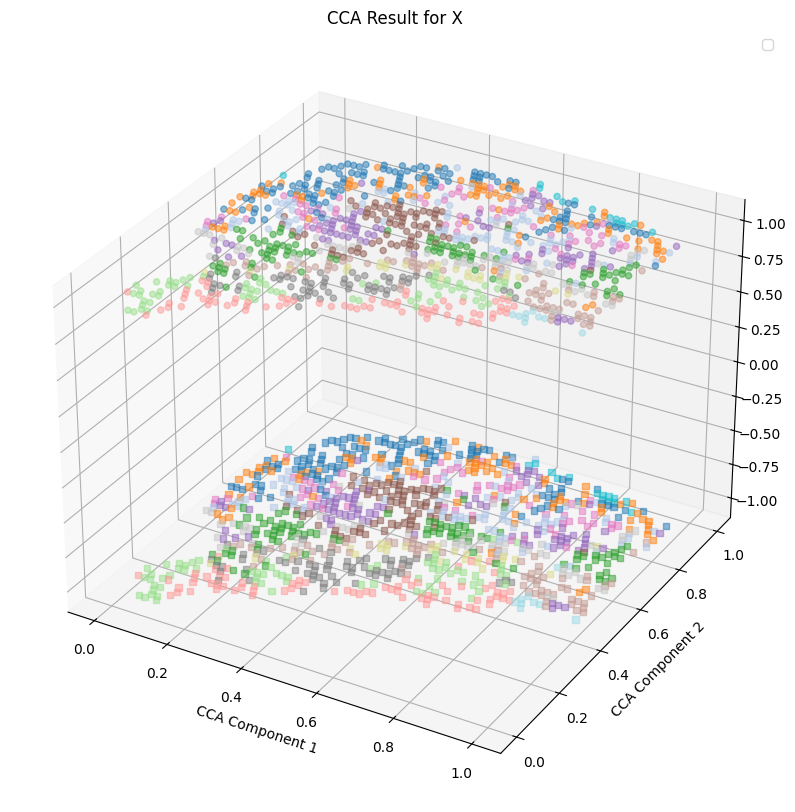

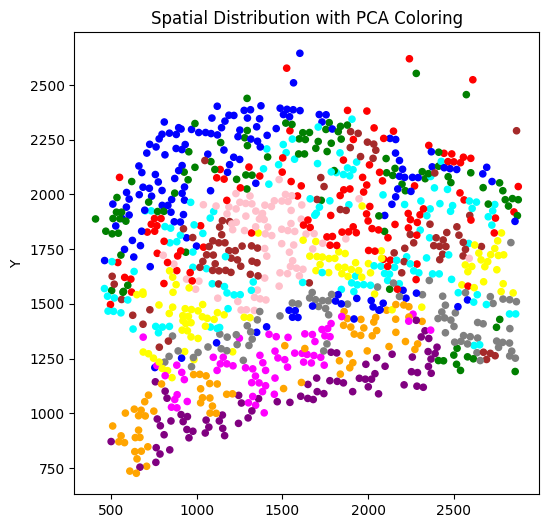

In [1794]:
Y_c = pd.DataFrame(P_aligned)
Z_c = pd.DataFrame(Q)
print(Z_c.shape, Y_c.shape)
from scipy.spatial.distance import cdist
distances = cdist(Z_c, Y_c, metric='euclidean')
dist_df = pd.DataFrame(distances)
print(dist_df.shape)
min_row_indices = dist_df.idxmin()
print(Z_c.shape, Y_c.shape)
###############找出Y_C(spatial)周围dist_min以内的Z_C(metabolic)点
Y_C_ = Y_c.iloc[:,:]
Y_C_['spatial_ID'] = Y_C_.index
Y_C_ = Y_C_.reset_index()
Y_C_["spatial_cluster"] = data2_leiden_str.astype(int)
Y_C_["spatial.CCA.Z"] = -1
Y_C_ = Y_C_.drop(columns=['index'])
Y_C_ = Y_C_.rename(columns={0: "spatial.CCA.X", 1:"spatial.CCA.Y"})
print(Z_c.shape, Y_c.shape)
Z_C_=Z_c.iloc[min_row_indices,]
Z_C_['matabolic_ID'] = Z_C_.index
Z_C_=Z_C_.reset_index()
Z_C_["matabolic_cluster"] = data1_leiden_str[min_row_indices].astype(int)
Z_C_=Z_C_.drop(columns=['index'])
Z_C_["matabolic.CCA.Z"] = 1
Z_C_=Z_C_.rename(columns={0: "metabolic.CCA.X", 1:"metabolic.CCA.Y"})
pairs = pd.concat([Y_C_,Z_C_],axis=1)
#pairs["distance"] = dist_df.iloc[row_indices,col_indices].values.diagonal()  //diagonal要求内存过大
print(pairs.head())

fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(111, projection='3d')
plt.scatter(Z_c.iloc[:, 0], Z_c.iloc[:, 1],zs=1, c=data1_leiden_str[:].astype(int), cmap='tab20', s=20, alpha=0.5)
plt.scatter(Y_c.iloc[:, 0], Y_c.iloc[:, 1],zs=-1, c=data2_leiden_str.astype(int), cmap='tab20', s=20, alpha=0.5,marker='s')
#for i in range(0,pairs.shape[0]):
#    plt.plot(pairs.iloc[i,[0,5]], pairs.iloc[i,[1,6]], pairs.iloc[i,[4,9]], 'gray', linewidth=0.2)
plt.xlabel('CCA Component 1')
plt.ylabel('CCA Component 2')
plt.title('CCA Result for X')
plt.legend()
plt.show()
plt.figure(figsize=(6, 6))
plt.scatter(pd.DataFrame(adata2.obsm['spatial']).iloc[:, 0],pd.DataFrame(adata2.obsm['spatial']).iloc[:, 1], 
            c=[color_mapping[category] for category in pairs["matabolic_cluster"].tolist()], s=20, alpha=1)
plt.ylabel('Y')
plt.title('Spatial Distribution with PCA Coloring')
unique_categories = pairs["matabolic_cluster"].unique()
handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color_mapping[cat], markersize=10) for cat in unique_categories]
#plt.legend(handles, unique_categories, title="Metabolic Clusters")
#plt.savefig("I:\\mutiomics\\Spatial Multimodal Analysis of Transcriptomes and Metabolomes in Tissues\\benchmark\\rat\\FPWalignment.pdf")
plt.show()
same_values_mask_directmerge = pairs['spatial_cluster'] == pairs['matabolic_cluster']
# 计算相同值的个数
same_values_count_fine = same_values_mask_directmerge.sum()
accruracy_hacca_FPWmerge = same_values_count_fine

In [1795]:
print(same_values_mask.sum())
print("SOTA: ",same_values_mask.sum()-Accruracy_furtheralignment )
print("directalignment: ",accruracy_directmerge)
print("grossalignment: ",Accruracy_grossalignment)
print("furtheralignment: ",Accruracy_furtheralignment)
print("ICP",accruracy_ICP)
print("FPW",accruracy_FPWmerge)
print("haCCA: ",Accruracy_haCCA)
print("FPWhaCCA: ",accruracy_hacca_FPWmerge)

919
SOTA:  30
directalignment:  289
grossalignment:  889
furtheralignment:  889
ICP 462
FPW 583
haCCA:  919
FPWhaCCA:  786


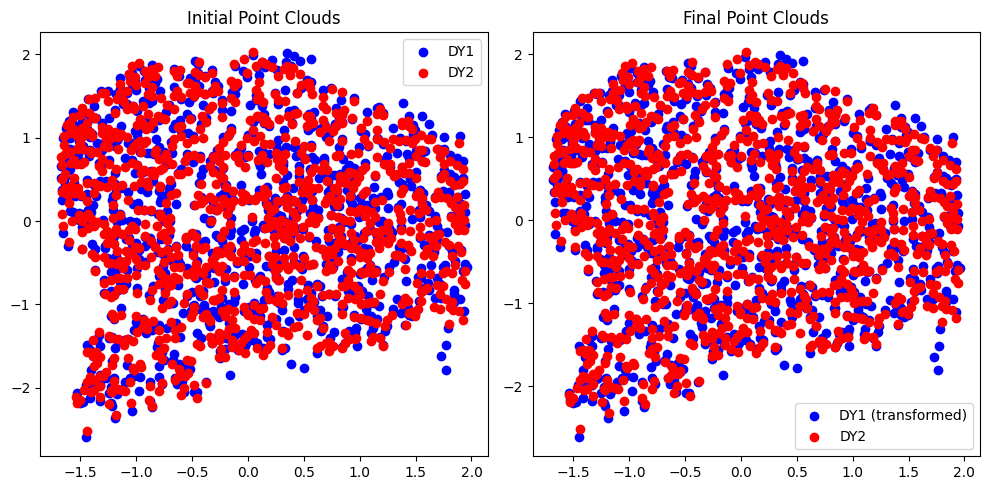

Final transformation matrix:
[[2.25375274e-17]
 [1.24483757e-17]]


In [1626]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial import cKDTree

#DY1 = data2_spatial_results.T.values  # Example DY1 point cloud (2D points
#DY1 = data2_spatial_results.T.values
#DY2 = data3_spatial_results.T.values # Example DY2 point cloud (2D points)
DY1 = spatial_select_high_corr_variant.T.to_numpy()  # Example DYGW1 features
DY2 = metabolic_select_high_corr_variant.T.to_numpy()  # Example DYGW2 features
scaler1 = StandardScaler()
scaler2 = StandardScaler()
DY1 = scaler1.fit_transform(DY1.T).T
DY2 = scaler2.fit_transform(DY2.T).T

# Perform CCA
cca = CCA(n_components=2)
DY1_c, DY2_c = cca.fit_transform(DY1.T, DY2.T)
DY1 = DY1_c.T
DY2 = DY2_c.T
# 初始变换估计
transformation = np.eye(2)  # 初始变换矩阵为2x2的单位矩阵

# 设定迭代次数和收敛阈值
max_iterations = 500
tolerance = 1e-5

# 创建一个新的图形窗口
plt.figure(figsize=(10, 5))

# 绘制初始的DY1和DY2点云
plt.subplot(1, 2, 1)
plt.title('Initial Point Clouds')
plt.scatter(DY1[0], DY1[1], color='blue', label='DY1')
plt.scatter(DY2[0], DY2[1], color='red', label='DY2')
plt.legend()

iteration = 0
converged = False

while not converged and iteration < max_iterations:
    # Step 1: Find correspondences based on spatial proximity
    tree = cKDTree(DY2.T)
    distances, indices = tree.query(DY1.T)
    
    corresponding_target_points = DY2[:, indices]

    # Step 2: Optimize transformation using spatial and feature distances
    # Example: simple averaging transformation for illustration
    transformation = np.mean(corresponding_target_points - DY1, axis=1, keepdims=True)

    # Step 3: Apply transformation to DY1
    DY1_transformed = DY1 + transformation

    # Step 4: Update DY1 for the next iteration
    DY1 = DY1_transformed

    # Step 5: Check convergence
    if np.linalg.norm(transformation) < tolerance:
        converged = True

    iteration += 1

# 绘制最终的DY1和DY2点云
plt.subplot(1, 2, 2)
plt.title('Final Point Clouds')
plt.scatter(DY1[0], DY1[1], color='blue', label='DY1 (transformed)')
plt.scatter(DY2[0], DY2[1], color='red', label='DY2')
plt.legend()

plt.tight_layout()
plt.show()

print("Final transformation matrix:")
print(transformation)